# Introduction

The focus of this project will be Cancer Cells. Such are ones which grow very quickly, so that the blood vessels can’t keep up with the disease and only very few Oxygen gets to the cell (Hypoxia). As a result they will either die, or express some particular genes necessary for them to survive in such extreme environment.  It the latter case, they become more aggressive and are usually harder to treat.
Up to now what is generally done to measure hypoxia is to use imaging (MRI). That’s however quite expensive, and actually only identifies tissue hypoxic cells.
We will work on single cell sequencing data from two different cell lines (HCC1806, MCF7) gathered with two different sequencing techniques (Smartseq and Dropseq). Hypoxia cells were artificially put under hypoxic conditions (level of Oxygen about 1%), while the rest were under air condition. Our research goal is to build a classifier in order to distinguish hypoxic cells from the normal ones. This way, hypoxic cells shall be better studied so that more powerful treatments can be invented.

## Materials and Methods

For our experiment we use RNA. However what is actually sequenced is cDNA (we use reverse transcription to obtain it from the starting RNA). Sequencing DNA is indeed easier than dealing with RNA directly. This is done in various steps using appropriate equipment. A DNA sequencing machine produces a vendor tool format file, which is then transformed in FASTQ file and finally in SAM/BAM ones.
The vendor tool format file is a non-text file produced by the machine, while FASTQ contains the list of bases as well of the quality (expressed in ASCII characters) with which they were registered. Finally we have the SAM/BAM files, which contain alligned sequenced reads.
In terms of methods used, we'll start with EDA, where we'll give heuristics on how we could filter and normalize the dataset. Unsupervised Lerning follows, where we'll find groups of genes and cells with similar properties by using k-means and agglomoritive clustering. Finally we'll do classification using a variety of classifiers, appropriately tuned so as to minimize the generalization error. As the code for the various datasets is highly repetitive, we included for each portion only one of the four datasets that is representative of the methods used.

Note to the reader: Some minor errors may arise due to the use of different IDE (we worked independetly in the beginning). Some erros include images not rendering, code cells not being hidden etc. 

## Python libraries, file locations

In [ ]:
import sys
import sklearn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import tensorflow.keras as keras
%matplotlib inline     
sns.set(color_codes=True)

In [ ]:
# unfiltered data
mcf_smart_unfiltered = "SmartSeq/MCF7_SmartS_Unfiltered_Data.txt"
hcc_smart_unfiltered = "SmartSeq/HCC1806_SmartS_Unfiltered_Data.txt"

# meta data
mcf_meta = "SmartSeq/MCF7_SmartS_MetaData.tsv"
hcc_meta = "SmartSeq/HCC1806_SmartS_MetaData.tsv"

# filtered data
mcf_smart = "SmartSeq/MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt"
hcc_smart = "SmartSeq/HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt"
mcf_drop = "DropSeq/MCF7_Filtered_Normalised_3000_Data_train.txt"
hcc_drop = "DropSeq/HCC1806_Filtered_Normalised_3000_Data_train.txt"

# test data
hcc_smart_test = "SmartSeq/HCC1806_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt"
mcf_smart_test = "SmartSeq/MCF7_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt"

In [ ]:
def format_file(location):
    """
    return a pandas dataframe and an array of labels for the specified file.
    """
    df = pd.read_csv(location, delimiter='\ ', engine='python', index_col=0)
    df = df.T
    y = np.array(['Hypo' in name for name in df.index])
    return df, y

# Exploratory Data Analysis

## HCC1806 SmartSeq

### Metadata

First, we load the metadata of the SmartSeq experiment for the HCC1806 cell line.

In [ ]:
meta = pd.read_csv(hcc_meta, delimiter='\t', engine='python', index_col=0)
print(f"shape: {meta.shape}")
meta.head()

shape: (243, 8)


,Cell Line,PCR Plate,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,HCC1806,1,A10,Normo,24,S123,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,HCC1806,1,A12,Normo,24,S26,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,HCC1806,1,A1,Hypo,24,S97,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,HCC1806,1,A2,Hypo,24,S104,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,HCC1806,1,A3,Hypo,24,S4,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


The 243 rows each represent a cell, while the columns provide information about the experimental conditions under which each cell was processed, such as the position and plate number during augmentation through PCR. There are also two columns providing information about the preprocessing pipeline, and one specifying whether the cell is hypoxic or normoxic.

In [ ]:
meta.dtypes

Cell Line             object
PCR Plate              int64
Pos                   object
Condition             object
Hours                  int64
Cell name             object
PreprocessingTag      object
ProcessingComments    object
dtype: object

In [ ]:
meta.describe(include='all')

,Cell Line,PCR Plate,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
count,243,243.000000,243,243,243.0,243,243,243
unique,1,NaN,91,2,NaN,243,1,1
top,HCC1806,NaN,A10,Hypo,NaN,S123,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
freq,243,NaN,4,126,NaN,1,243,243
mean,NaN,2.411523,NaN,NaN,24.0,NaN,NaN,NaN
std,NaN,1.081107,NaN,NaN,0.0,NaN,NaN,NaN
min,NaN,1.000000,NaN,NaN,24.0,NaN,NaN,NaN
25%,NaN,1.000000,NaN,NaN,24.0,NaN,NaN,NaN
50%,NaN,2.000000,NaN,NaN,24.0,NaN,NaN,NaN
75%,NaN,3.000000,NaN,NaN,24.0,NaN,NaN,NaN


We check for missing values: there aren't any.

In [ ]:
meta.isnull().any().sum()

0

### Unfiltered Sequencing Data

We now proceed to load the unfiltered sequencing data from the SmartSeq experiment for the HCC1806 cell line.

In [ ]:
df, y = format_file(hcc_smart_unfiltered)
print(f"shape: {df.shape}")
df.head()

shape: (243, 23396)


,"""WASH7P""","""CICP27""","""DDX11L17""","""WASH9P""","""OR4F29""","""MTND1P23""","""MTND2P28""","""MTCO1P12""","""MTCO2P12""","""MTATP8P1""",...,"""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP""","""MAFIP"""
"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""",0,0,0,0,2,250,54,1740,6,1,...,17,5,15,3852,900,22,4208,26,66,0
"""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,424,100,2340,5,1,...,49,29,36,7457,1439,43,6491,62,71,4
"""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,11,0,22,0,0,...,0,0,0,93,12,0,25,0,1,0
"""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,63,16,1020,3,0,...,43,17,8,1479,234,0,4819,11,3,7
"""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,27,3,303,0,0,...,0,0,3,303,33,0,310,4,9,0


Each of the 243 rows represents a cell, while each column corresponds to one of 233396 human genes that were detected. Each entry specifies the number of reads for a gene in the genome from a cell.

Please note that for convenience we have transposed the original dataframe to have the cells in the rows acting as instances, with the genes in the columns acting as features.

In [ ]:
df.describe()

,"""WASH7P""","""CICP27""","""DDX11L17""","""WASH9P""","""OR4F29""","""MTND1P23""","""MTND2P28""","""MTCO1P12""","""MTCO2P12""","""MTATP8P1""",...,"""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP""","""MAFIP"""
count,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,...,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000
mean,0.045267,0.119342,0.469136,0.255144,0.127572,117.930041,28.427984,904.308642,1.403292,0.378601,...,10.358025,5.930041,13.493827,2290.213992,386.901235,18.246914,2163.588477,20.613169,46.444444,3.897119
std,0.318195,0.594531,1.455282,0.818639,0.440910,103.038022,26.062662,654.520308,1.735003,0.747361,...,10.910199,7.040559,11.803967,1726.423259,309.276105,54.076514,1730.393947,22.224590,47.684223,4.736193
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,46.500000,8.000000,390.500000,0.000000,0.000000,...,2.000000,1.000000,4.000000,918.000000,138.500000,4.000000,947.500000,5.000000,14.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,94.000000,22.000000,790.000000,1.000000,0.000000,...,7.000000,4.000000,10.000000,1848.000000,320.000000,11.000000,1774.000000,14.000000,38.000000,2.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,157.000000,42.000000,1208.000000,2.000000,1.000000,...,14.000000,7.500000,20.000000,3172.000000,528.000000,20.000000,2927.000000,30.500000,64.500000,6.000000
max,3.000000,5.000000,12.000000,6.000000,4.000000,694.000000,120.000000,3569.000000,12.000000,4.000000,...,52.000000,43.000000,57.000000,8972.000000,1439.000000,804.000000,11383.000000,154.000000,409.000000,24.000000


Looking at the quantiles, we can see that the data covers a range of orders of magnitude, and that the data is sparse. In fact, it seems that a high number of entries are zeros, and most entries are 'small', with some very big outliers. Both these observations will be investigated upon later in the report.

Checking for missing values: again there aren't any.

In [ ]:
df.isnull().any().sum()

0

Checking that all entries are numeric:

In [ ]:
df.dtypes.value_counts()

int64    23396
dtype: int64

The array y contains one entry for each cell, it being True if the cell is Hypoxic and False if it is Normoxic.

In [ ]:
y = pd.DataFrame(y)
y.index = df.index
y.columns = ['Condition']

In [ ]:
y.head()

,Condition
"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""",False
"""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""",False
"""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""",True
"""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""",True
"""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""",True


### Preliminary Exploration

In order to get a first feeling for the data, we plot the gene expression profiles of a few cells. We use violin plots to visualize the shape of the distributions.

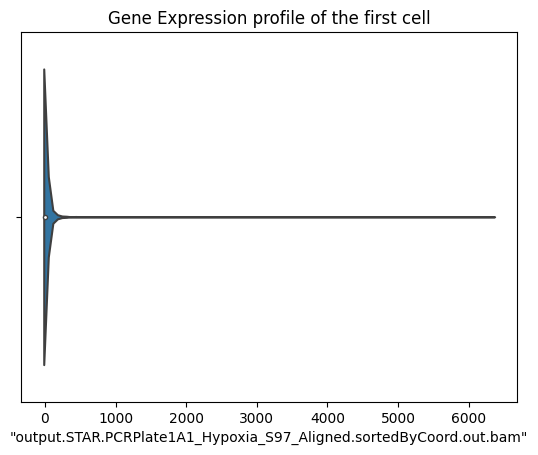

In [ ]:
sns.violinplot(x=df.iloc[2, :])
plt.title('Gene Expression profile of the first cell')
plt.show()

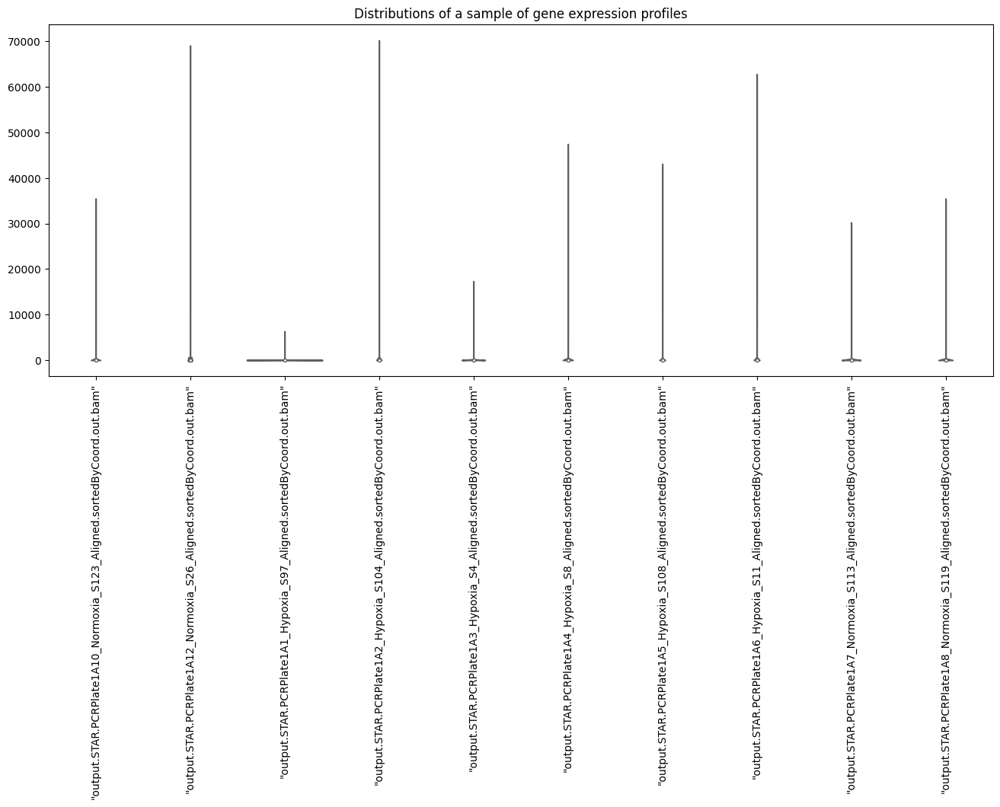

In [ ]:
df_small = df.iloc[:10, :].T
plt.figure(figsize=(16, 6))
sns.violinplot(data=df_small, palette='Set3', cut=0)
plt.xticks(rotation=90)
plt.title("Distributions of a sample of gene expression profiles")
plt.show()

We now plot the distribution of the reads of a few genes across the cells, again using violin plots.

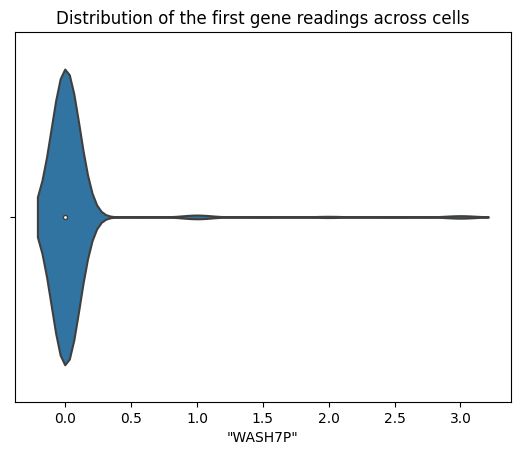

In [ ]:
sns.violinplot(x=df.iloc[:, 0])
plt.title('Distribution of the first gene readings across cells')
plt.show()

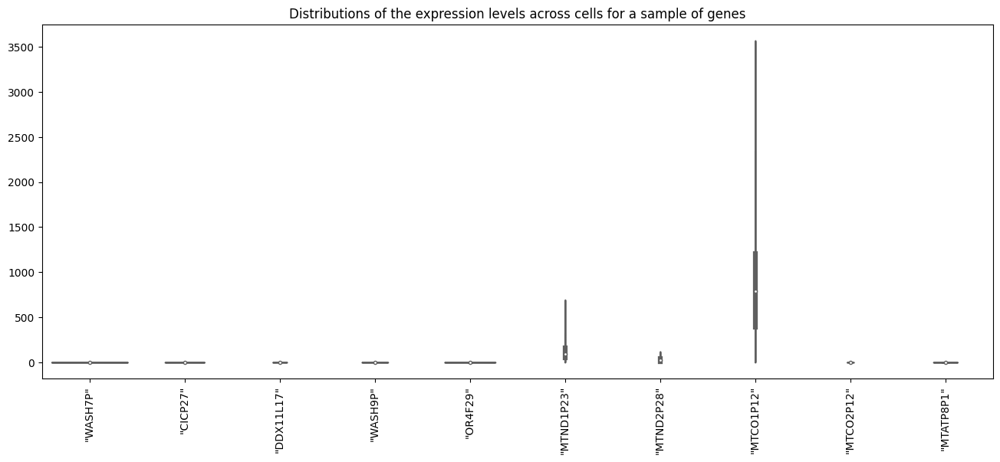

In [ ]:
df_small = df.iloc[:, :10]
plt.figure(figsize=(16, 6))
sns.violinplot(data=df_small, palette='Set3', cut=0)
plt.xticks(rotation=90)
plt.title("Distributions of the expression levels across cells for a sample of genes")
plt.show()

These preliminary graphs, especially those representing gene read distributions across cells, seem to confirm our initial impression, only guided by the quantiles, that the data is sparse. Also, it is clearly visible that some reads are order of magnitudes bigger than most of the others.

### Outliers

As remarked, there seem to be some outliers in the distributions. As a first attempt, we try a standard approach to outliers in statistics: we compute the interquartile range for each feature, and call a value an outlier whenever it is more than 1.5 times the interquartile range away from the closest between the first and the third quantiles. Then, we filter cells based on this, and we compare the distribution of the data filtered this way with the previous plots.

In [ ]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
IQR.value_counts()

0.0       10145
1.0         700
2.0         330
3.0         225
4.0         181
          ...  
1528.5        1
370.5         1
635.5         1
278.0         1
1979.5        1
Length: 1539, dtype: int64

10 thousand genes have an interquartile range of 0. The data is very sparse, and it is unlikely that this kind of technique, usually used for denser data, will produce good results.

In [ ]:
low = df < (Q1 - 1.5*IQR).T
high = df > (Q3 + 1.5*IQR).T

In [ ]:
msk = (df < low) | (df > high)
df_noOut = df[~ msk.any(axis=1)]
df_noOut.shape

(0, 23396)

By filtering this way, i.e. only keeping cells that have no outlier values among their features, all the cells have been removed. We can tryan analogous filtering for the genes, and see what it produces.

In [ ]:
Q1 = df.T.quantile(0.25)
Q3 = df.T.quantile(0.75)
IQR = Q3 - Q1
IQR.value_counts()

22.0     9
0.0      9
16.0     7
29.0     7
25.0     7
        ..
132.0    1
6.0      1
84.0     1
28.0     1
41.0     1
Length: 102, dtype: int64

In [ ]:
low = (Q1 - 1.5*IQR)
high = (Q3 + 1.5*IQR)

In [ ]:
msk = (df.T < low) | (df.T > high)
df_noOut = df.T[~ msk.any(axis=1)]
df_noOut.shape

(10815, 243)

Filtering outlier genes, instead of cells, we cut off more or less half of them. Let's see how this affected the distribution of the data by again plotting violin plots and comparing with the original data.

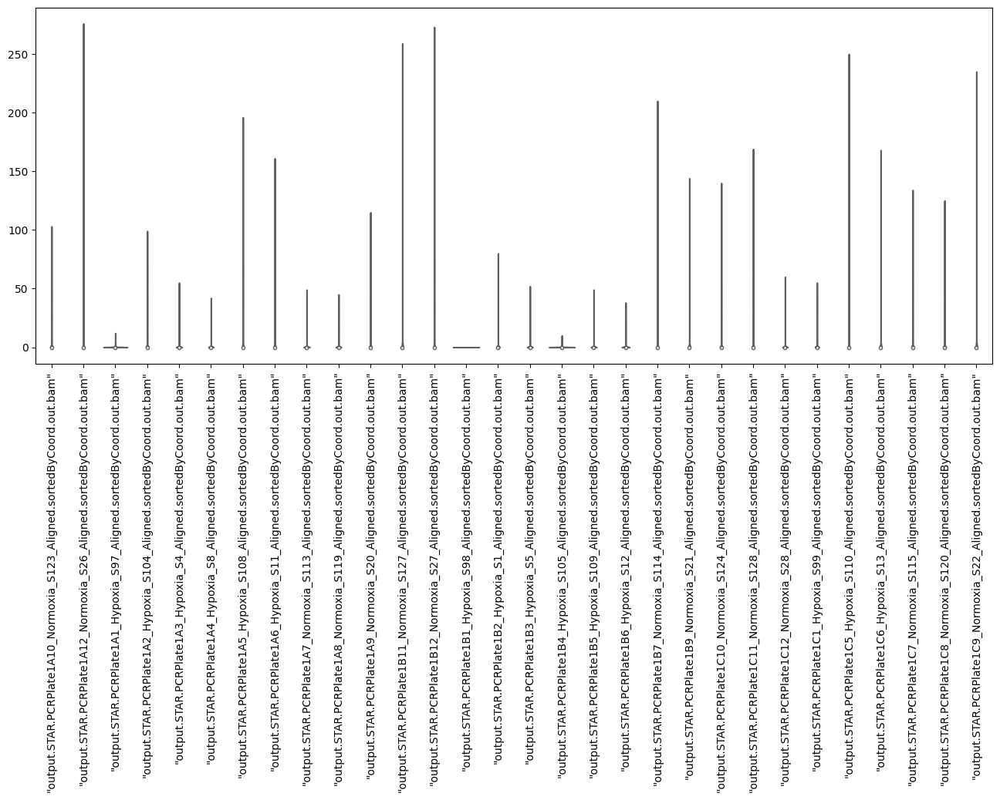

In [ ]:
df_noOut_small = df_noOut.iloc[:, :30]
plt.figure(figsize=(16, 6))
sns.violinplot(data=df_noOut_small, palette='Set3', cut=0)
plt.xticks(rotation=90)
plt.show()

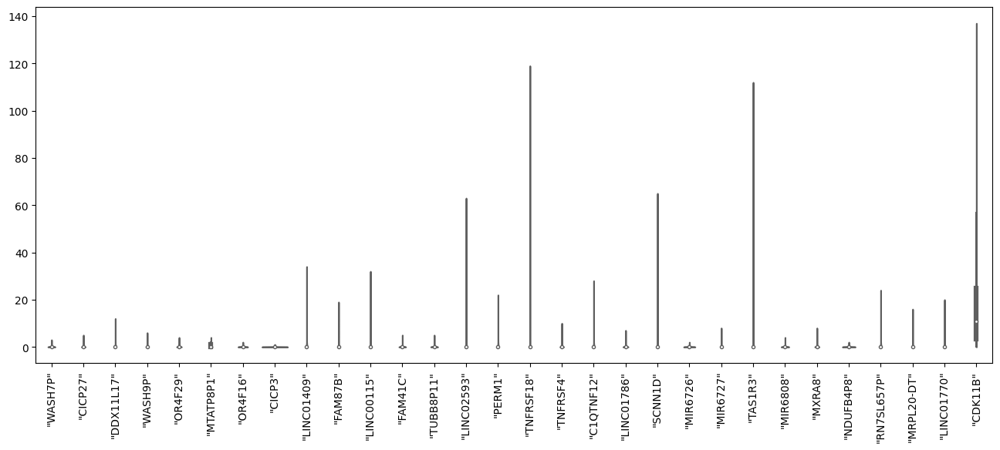

In [ ]:
df_noOut_small = df_noOut.iloc[:30, :].T
plt.figure(figsize=(16, 6))
sns.violinplot(data=df_noOut_small, palette='Set3', cut=0)
plt.xticks(rotation=90)
plt.show()

In [ ]:
print("sparsity level:")
print("without outliers:", (df_noOut == 0).sum().sum() / df_noOut.size)
print("with outliers:", (df == 0).sum().sum() / df.size)

sparsity level:
without outliers: 0.8673120133026642
with outliers: 0.558456230779135


From the observation of the plots, and by comparing the sparsity levels before and after the filtering, we see that now the data is even more sparse than before, and by a considerable amount: we have filtered many of the nonzero entries. This is revealing of a more general principle: outliers need to be handled with greater care when the data is sparse, because in that case it often happens that what would normally be called an outlier carries important information. We have to find more sensible ways to filter our dataset, which we will try to do in the following.

### Cell Filtering

The first thing we want to do is to perform quality control on the cell data. We want to remove any cells that may be dying, those which may have broken membranes and those that may be doublets, as these would be detrimental to our analysis. To accomplish this, we will analyse three variables: distribution of gene reads, counts among the cells, as well as fraction of gene counts derived from mitochondrial genes. The goal will be to combine all of these covariates in order to find outlier cells which will then be filtered out. We indeed expect that cells with low gene reads, low counts, and a high percentage of mitochondrial genes will be those with a broken membrane from which cytoplasmic mRNA has leaked. On the other hand, cells with high gene reads and high counts may be doublets. Deciding which thresholds to use when filtering cells is a tricky task, so our first choices can be later revised, if needed, in light of the results of downstream analysis.

Nevertheless, these decisions should be discussed with biologists or other experts with appropriate domain knowledge, who would then help us choose thresholds appopriately.

#### Total Counts

In this section, we will analyse the distribution of the total number of counts per cell.

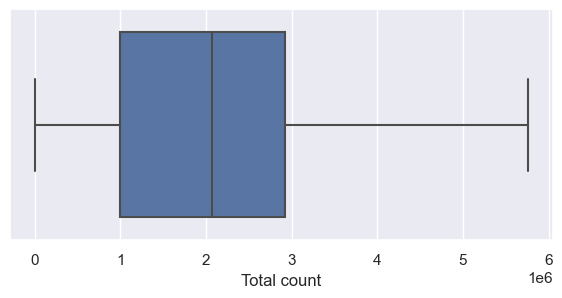

In [ ]:
sns.set_theme()
total_count = df.sum(axis=1)
fig = plt.figure(figsize=(7, 3))
sns.boxplot(x=total_count)
plt.xlabel("Total count");

Here we make a violin plot of the distribution of total counts per cell. It is clearly bimodal. Although this graph alone is not evidence enough, it is possible that the left mode contains quiescent or dying cells. To gather more conclusive evidence on this point, total reads and mithocondrial ratios should also be taken in consideration before any decision can be made. We highlight a natural "cutting line", where we'd hypotethically remove all cells on the left of it.

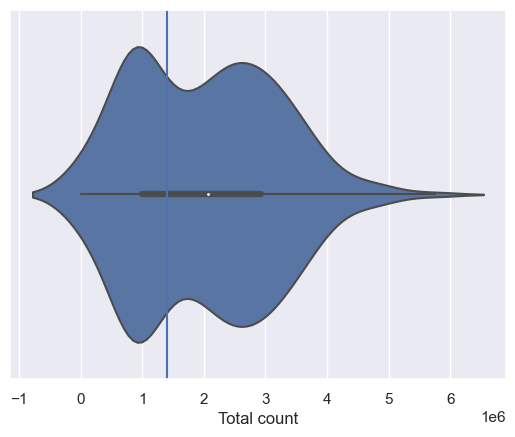

In [ ]:
sns.violinplot(x=total_count)
plt.axvline(x=1.4e6)
plt.xlabel("Total count");

Now, we would like to identify cells with outlier counts. We inspect the various histograms of the total counts per cell below: the first one is just a regular histogram over all the cells, while the other histograms focus, respectively, on the cells above the third quartile, the cells below the first quartile, and the cells in the interquatile range. The red line describes possible ways to cut some cells away, either because their count is too big or too small. The reason behind is that a small count may be an indication of dead cells while a huge count may detect doublet cells.

In [ ]:
quantiles = total_count.quantile([0.25,0.5,0.75])
print('Quantiles:')
print(quantiles)
q1, q3 = quantiles.iloc[[0, 2]]


Quantiles:
0.25     991062.5
0.50    2067645.0
0.75    2925181.5
dtype: float64


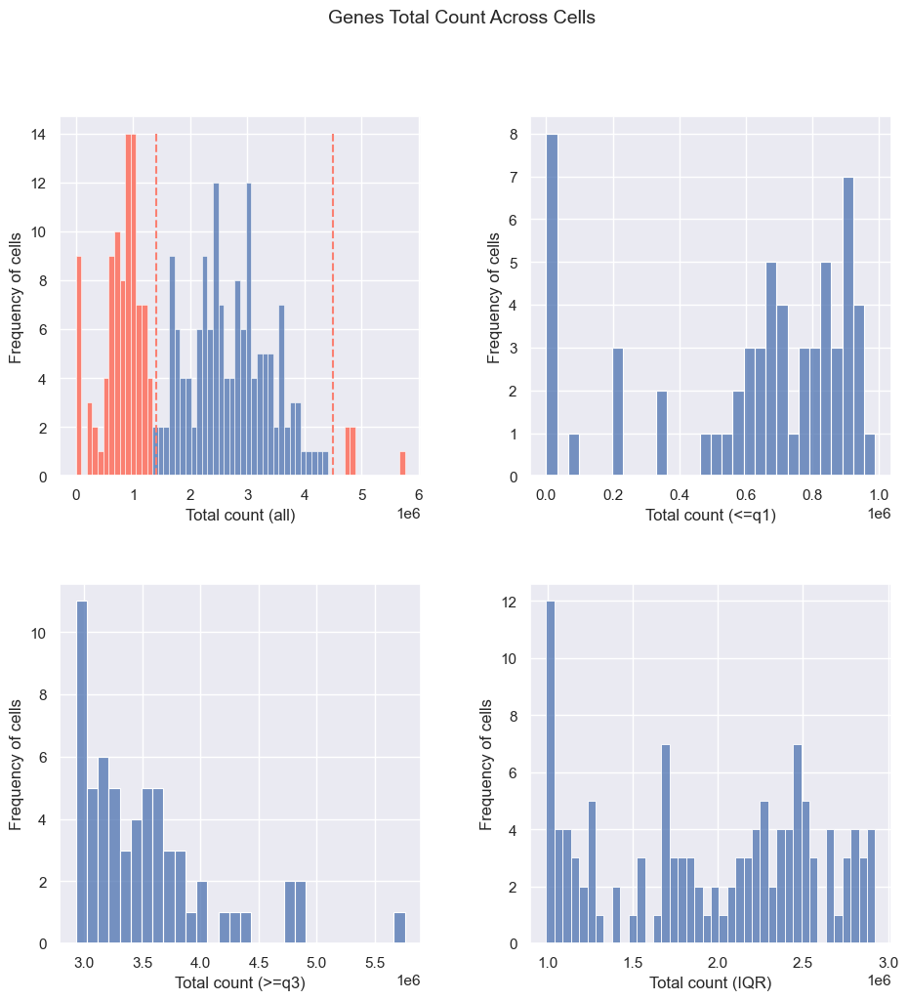

In [ ]:
sns.set_theme()

mask1 = (total_count <= q1) # q1
mask2 = (total_count >= q3) # q3
mask3 = ~(mask1 | mask2) # IQR

# Selection
total_count_to_q1 = total_count[mask1]
total_count_after_q3 = total_count[mask2]
total_count_iqr =  total_count[mask3]

fig, ax = plt.subplots(2, 2, figsize=(11, 11))
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# First plot [0, 0]
bars = sns.histplot(total_count, bins=60, ax=ax[0, 0])
count, i = 0, 0

## Outlier Idenditification and Coloring
while count < 13:
  if bars.patches[i].get_height() > 0:
    bars.patches[i].set_facecolor('salmon')
    count += 1
  i += 1
count, i = 0, -1
while count < 3:
  if bars.patches[i].get_height() > 0:
    bars.patches[i].set_facecolor('salmon')
    count += 1
  i -= 1

low_threshold_counts = 1.4*10**6

ax[0, 0].plot([low_threshold_counts, low_threshold_counts], [0, 14], color='salmon', 
              linestyle='dashed')

high_threshold_counts = 4.5*10**6
ax[0, 0].plot([high_threshold_counts, high_threshold_counts], [0, 14], color='salmon', 
              linestyle='dashed')

# Second plot [0, 1]
bars = sns.histplot(total_count_to_q1, bins=30, ax=ax[0, 1])


# Third Plot [1, 0]
bars2 = sns.histplot(total_count_after_q3, bins=30, ax=ax[1, 0])

# Fourth Plot [1, 1]
sns.histplot(total_count_iqr, bins=40, ax=ax[1, 1])


# Labels
ax[0, 0].set_xlabel("Total count (all)")
ax[0, 1].set_xlabel("Total count (<=q1)")
ax[1, 0].set_xlabel("Total count (>=q3)")
ax[1, 1].set_xlabel("Total count (IQR)")
ax[0, 0].set_ylabel("Frequency of cells")
ax[0, 1].set_ylabel("Frequency of cells")
ax[1, 0].set_ylabel("Frequency of cells")
ax[1, 1].set_ylabel("Frequency of cells")
fig.suptitle('Genes Total Count Across Cells', fontsize=14);

These are the cells with total count smaller or higher than our threshold:

In [ ]:
low_count_outliers = total_count[total_count <= low_threshold_counts]
low_count_outliers

"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"        226818
"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"         835249
"output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam"        1101681
"output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam"      897562
"output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam"     1064802
                                                                           ...   
"output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam"      1263995
"output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam"       696354
"output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam"      676271
"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"     823108
"output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam"      872202
Length: 93, dtype: int64

In [ ]:
high_count_outliers = total_count[total_count >= high_threshold_counts]
high_count_outliers 

"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"    4858841
"output.STAR.PCRPlate1B12_Normoxia_S27_Aligned.sortedByCoord.out.bam"    4844324
"output.STAR.PCRPlate2C3_Hypoxia_S38_Aligned.sortedByCoord.out.bam"      4723635
"output.STAR.PCRPlate2H2_Hypoxia_S35_Aligned.sortedByCoord.out.bam"      5758132
"output.STAR.PCRPlate3H4_Hypoxia_S74_Aligned.sortedByCoord.out.bam"      4775797
dtype: int64

#### Number of Genes

Now we analyse the distribution of the number of gene reads per cell, i.e. the number of genes which are non-zero per cell.

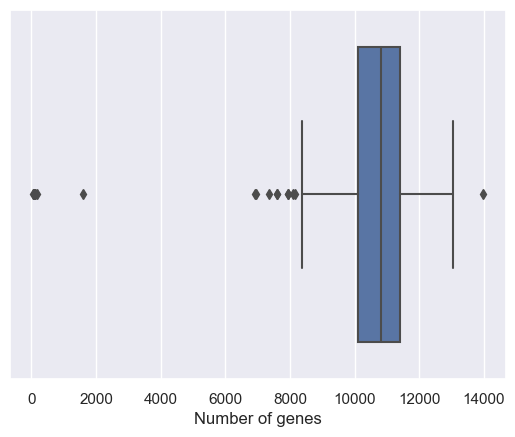

In [ ]:
number_genes = (df != 0).sum(axis=1)
sns.boxplot(x=number_genes)
plt.xlabel("Number of genes");

There are some outliers clearly visible from the boxplot.

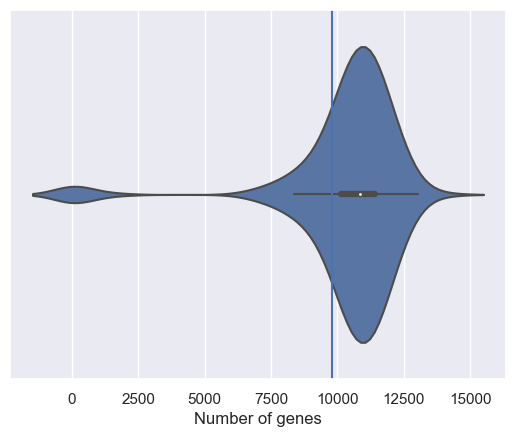

In [ ]:
sns.violinplot(x=number_genes)
plt.axvline(x=9800)
plt.xlabel("Number of genes");

As before, the cutting line suggests a possible threshold for our outlier removal.

In [ ]:
number_genes.sort_values()

"output.STAR.PCRPlate3D11_Normoxia_S92_Aligned.sortedByCoord.out.bam"        35
"output.STAR.PCRPlate2E12_Normoxia_S61_Aligned.sortedByCoord.out.bam"        67
"output.STAR.PCRPlate3D10_Normoxia_S188_Aligned.sortedByCoord.out.bam"       71
"output.STAR.PCRPlate3D2_Hypoxia_S168_Aligned.sortedByCoord.out.bam"         81
"output.STAR.PCRPlate2F12_Normoxia_S62_Aligned.sortedByCoord.out.bam"        85
                                                                          ...  
"output.STAR.PCRPlate3D9_Normoxia_S86_Aligned.sortedByCoord.out.bam"      12491
"output.STAR.PCRPlate3G1_Hypoxia_S164_Aligned.sortedByCoord.out.bam"      12660
"output.STAR.PCRPlate3A9_Normoxia_S83_Aligned.sortedByCoord.out.bam"      12698
"output.STAR.PCRPlate1F8_Normoxia_S18_Aligned.sortedByCoord.out.bam"      13029
"output.STAR.PCRPlate1D3_Hypoxia_S6_Aligned.sortedByCoord.out.bam"        13986
Length: 243, dtype: int64

We build an histogram where we plot the number of reads in the cells, namely the number of cells which have a certain number of different genes expressed. The idea is again to identify possible outliers between the cells and, considering also the thresholds coming from the other two factors, remove them.
We identify two possible thresholds, indicated by the dashed red lines, for the cuts.


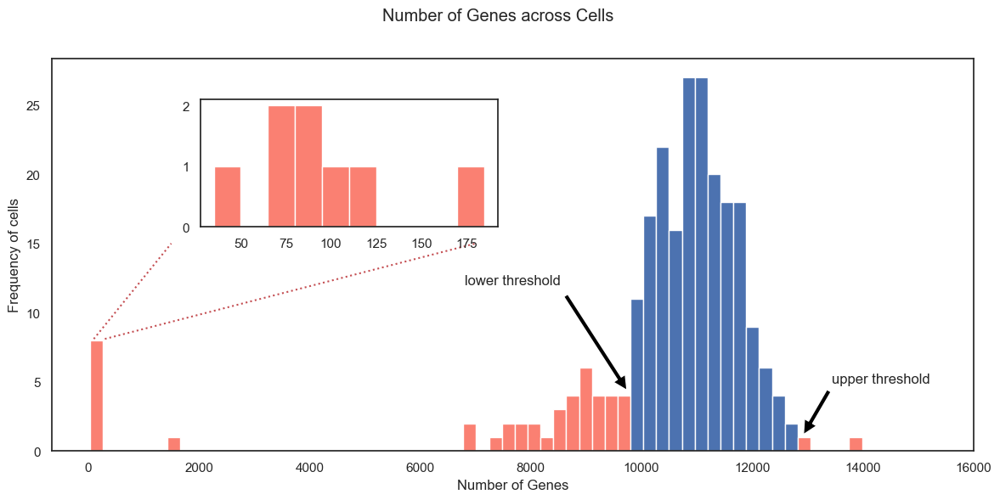

In [ ]:
fig = plt.figure(figsize=(14, 6))
sns.set_style("white")

ax1 = plt.axes()
bars = ax1.hist(number_genes, bins = 60)
ax1.set_xlim(right = 16000)


# Outlier Idenditification and Coloring
l_count, u_count, i = 0, 0, 0
while l_count < 14 or u_count<2:
  if bars[2][i].get_height() > 0 and l_count<14:
    bars[2][i].set_facecolor('salmon')
    l_count += 1
  if bars[2][-i-1].get_height()>0 and u_count<2:
    bars[2][-i-1].set_facecolor('salmon')
    u_count += 1
  i += 1


# Threshold
low_threshold_reads = 9800
high_threshold_reads= 12900

ax1.annotate('lower threshold', xy=(low_threshold_reads, 4),  xycoords='data',
            xytext=(0.5, 0.45), textcoords='axes fraction',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='center', verticalalignment='top',
            )
ax1.annotate('upper threshold', xy=(high_threshold_reads, 1),  xycoords='data',
            xytext=(0.9, 0.2), textcoords='axes fraction',
            arrowprops=dict(facecolor='black', shrink=0.05),
            horizontalalignment='center', verticalalignment='top',
            )


# Subplot
ax2 = plt.axes([0.25, 0.55, 0.25, 0.25])
ax2.hist(number_genes[number_genes < 1000], color="salmon")
ax1.plot([100, 1500], [8.1, 15], 'r:')
ax1.plot([300, 7000], [8.1, 15], 'r:')

# Labels
fig.suptitle("Number of Genes across Cells")
ax1.set_xlabel("Number of Genes")
ax1.set_ylabel("Frequency of cells");

sns.set_theme() # resetting the style plot

We print the cells below the lower threshold and those above the higher threshold.

In [ ]:
low_reads_outliers = number_genes[number_genes <= low_threshold_reads]
low_reads_outliers

"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"      7597
"output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam"        8107
"output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam"      9312
"output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam"     9390
"output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam"     8464
"output.STAR.PCRPlate1B1_Hypoxia_S98_Aligned.sortedByCoord.out.bam"        117
"output.STAR.PCRPlate1B2_Hypoxia_S1_Aligned.sortedByCoord.out.bam"        8144
"output.STAR.PCRPlate1B3_Hypoxia_S5_Aligned.sortedByCoord.out.bam"        8661
"output.STAR.PCRPlate1B4_Hypoxia_S105_Aligned.sortedByCoord.out.bam"      9017
"output.STAR.PCRPlate1B5_Hypoxia_S109_Aligned.sortedByCoord.out.bam"      8755
"output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam"       7602
"output.STAR.PCRPlate1C5_Hypoxia_S110_Aligned.sortedByCoord.out.bam"      9372
"output.STAR.PCRPlate1D10_Normoxia_S125_Aligned.sort

In [ ]:
high_reads_outliers = number_genes[number_genes >= high_threshold_reads]
high_reads_outliers 

"output.STAR.PCRPlate1D3_Hypoxia_S6_Aligned.sortedByCoord.out.bam"      13986
"output.STAR.PCRPlate1F8_Normoxia_S18_Aligned.sortedByCoord.out.bam"    13029
dtype: int64

#### Mitochondria Counts

In this section, we identify the mitochondrial genes and calculate what percentage of counts they represent from the total counts per cell. This is the last covariate we take into consideration for QC on cell data. We begin by identifying the mithocondrial genes among those that appear in the dataset.

In [ ]:
mito_genes = np.array(df.columns[df.columns.str.find("MT-")!=-1])
print(mito_genes)
correct = []
for i, name in enumerate(mito_genes):
  if name[1] == "M":
    correct.append(i)
mito_genes = mito_genes[correct]
print(mito_genes)

['"INMT-MINDY4"' '"MT-TF"' '"MT-RNR1"' '"MT-TV"' '"MT-RNR2"' '"MT-TL1"'
 '"MT-ND1"' '"MT-TI"' '"MT-TQ"' '"MT-TM"' '"MT-ND2"' '"MT-TW"' '"MT-TA"'
 '"MT-TC"' '"MT-TY"' '"MT-CO1"' '"MT-TS1"' '"MT-TD"' '"MT-CO2"' '"MT-TK"'
 '"MT-ATP8"' '"MT-ATP6"' '"MT-CO3"' '"MT-TG"' '"MT-ND3"' '"MT-TR"'
 '"MT-ND4L"' '"MT-ND4"' '"MT-TH"' '"MT-TS2"' '"MT-TL2"' '"MT-ND5"'
 '"MT-ND6"' '"MT-TE"' '"MT-CYB"' '"MT-TT"' '"MT-TP"']
['"MT-TF"' '"MT-RNR1"' '"MT-TV"' '"MT-RNR2"' '"MT-TL1"' '"MT-ND1"'
 '"MT-TI"' '"MT-TQ"' '"MT-TM"' '"MT-ND2"' '"MT-TW"' '"MT-TA"' '"MT-TC"'
 '"MT-TY"' '"MT-CO1"' '"MT-TS1"' '"MT-TD"' '"MT-CO2"' '"MT-TK"'
 '"MT-ATP8"' '"MT-ATP6"' '"MT-CO3"' '"MT-TG"' '"MT-ND3"' '"MT-TR"'
 '"MT-ND4L"' '"MT-ND4"' '"MT-TH"' '"MT-TS2"' '"MT-TL2"' '"MT-ND5"'
 '"MT-ND6"' '"MT-TE"' '"MT-CYB"' '"MT-TT"' '"MT-TP"']


In [ ]:
df_mito = df.loc[:, mito_genes]
df_mito

,"""MT-TF""","""MT-RNR1""","""MT-TV""","""MT-RNR2""","""MT-TL1""","""MT-ND1""","""MT-TI""","""MT-TQ""","""MT-TM""","""MT-ND2""",...,"""MT-ND4""","""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP"""
"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""",3,662,13,9947,44,1123,3,7,10,1364,...,17732,17,5,15,3852,900,22,4208,26,66
"""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""",13,1528,31,19835,111,2111,3,6,5,2069,...,15624,49,29,36,7457,1439,43,6491,62,71
"""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""",0,14,0,195,1,34,0,0,0,14,...,200,0,0,0,93,12,0,25,0,1
"""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""",1,453,0,5123,26,394,2,2,0,202,...,6588,43,17,8,1479,234,0,4819,11,3
"""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""",0,190,4,1950,9,174,1,1,4,82,...,1028,0,0,3,303,33,0,310,4,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""",8,1005,10,8201,57,900,4,8,5,855,...,6273,25,17,11,2926,423,26,3719,42,48
"""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""",0,132,2,1421,4,243,1,1,0,207,...,1446,2,1,3,688,114,1,984,1,18
"""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""",2,411,1,7836,29,542,1,9,9,558,...,7026,9,6,23,2999,486,4,2256,15,36
"""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""",1,192,0,1475,20,230,1,2,2,183,...,1201,2,3,3,611,75,4,981,6,8


In [ ]:
fractional_mito = df_mito.sum(axis=1)/ total_count
fractional_mito.sort_values(ascending=False)

"output.STAR.PCRPlate3D2_Hypoxia_S168_Aligned.sortedByCoord.out.bam"      0.492157
"output.STAR.PCRPlate1G6_Hypoxia_S15_Aligned.sortedByCoord.out.bam"       0.077753
"output.STAR.PCRPlate4B1_Hypoxia_S221_Aligned.sortedByCoord.out.bam"      0.067976
"output.STAR.PCRPlate2G10_Normoxia_S157_Aligned.sortedByCoord.out.bam"    0.050459
"output.STAR.PCRPlate2C1_Hypoxia_S131_Aligned.sortedByCoord.out.bam"      0.048678
                                                                            ...   
"output.STAR.PCRPlate1D3_Hypoxia_S6_Aligned.sortedByCoord.out.bam"        0.004921
"output.STAR.PCRPlate3D5_Hypoxia_S78_Aligned.sortedByCoord.out.bam"       0.004622
"output.STAR.PCRPlate1B1_Hypoxia_S98_Aligned.sortedByCoord.out.bam"       0.002237
"output.STAR.PCRPlate2A4_Hypoxia_S138_Aligned.sortedByCoord.out.bam"      0.000435
"output.STAR.PCRPlate3D10_Normoxia_S188_Aligned.sortedByCoord.out.bam"    0.000000
Length: 243, dtype: float64

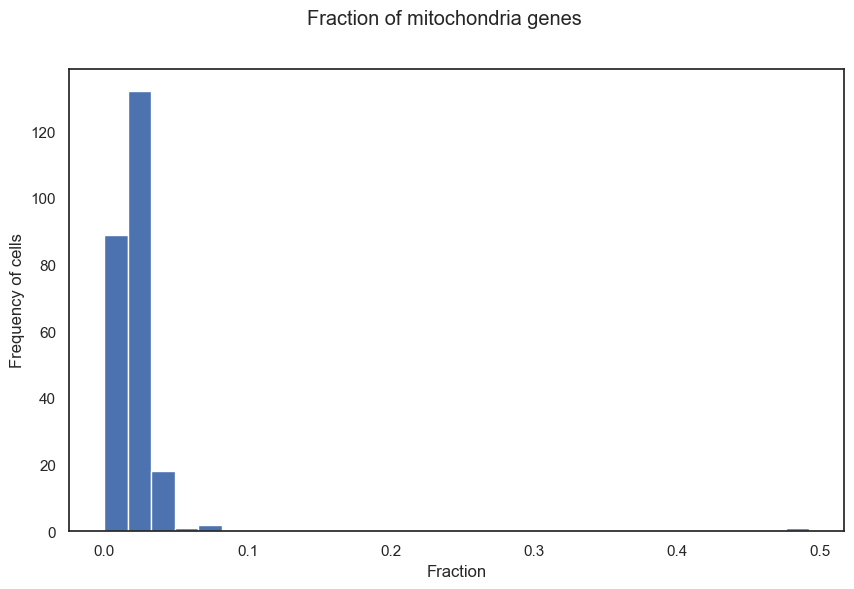

In [ ]:
fig = plt.figure(figsize=(10, 6))
sns.set_style("white")

ax1 = plt.axes()
ax1.hist(fractional_mito, bins = 30)

# Labels
fig.suptitle("Fraction of mitochondria genes")
ax1.set_xlabel("Fraction")
ax1.set_ylabel("Frequency of cells");

sns.set_theme() # resetting the style plot

It is difficult to appreciate the shape of the distribution because of the presence of a strong outlier on the far right. We temporarily and artificially modify its value to make the plot more informative.

In [ ]:
fractional_mito['"output.STAR.PCRPlate3D2_Hypoxia_S168_Aligned.sortedByCoord.out.bam"']

0.492156862745098

In [ ]:
fractional_mito['"output.STAR.PCRPlate3D2_Hypoxia_S168_Aligned.sortedByCoord.out.bam"'] = 0.02

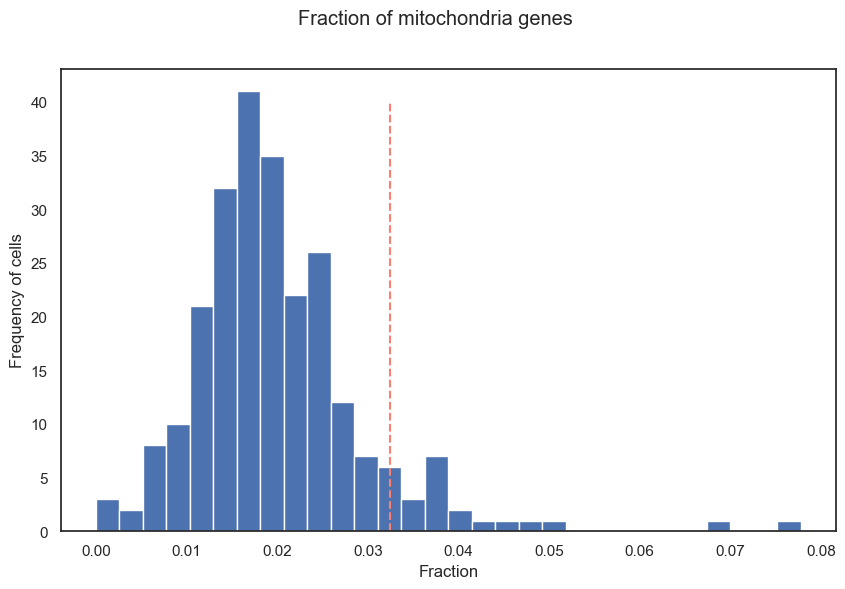

In [ ]:
fig = plt.figure(figsize=(10, 6))
sns.set_style("white")

ax1 = plt.axes()
ax1.hist(fractional_mito, bins = 30)

# Labels
fig.suptitle("Fraction of mitochondria genes")
ax1.set_xlabel("Fraction")
ax1.set_ylabel("Frequency of cells");

high_threshold_mytho = 0.0325
ax1.plot([high_threshold_mytho, high_threshold_mytho], [0, 40], color='salmon', 
              linestyle='dashed')

sns.set_theme() # resetting the style plot

In [ ]:
fractional_mito['"output.STAR.PCRPlate3D2_Hypoxia_S168_Aligned.sortedByCoord.out.bam"'] = 0.492156862745098

As for the other covariated, it should be noted that the mitochondrial ratio alone can be misleading for the purpose of cell filtering. In fact, in general, a high mitochondrial ratio could be associated to a broken membrane, but also simply be due to the fact that the cell is involved in respiratory processes, which would be no reason to filter it out.

#### Filtering

Here, we finally put together the results from the previous three sections of quality control. The graph below combines all three covariates that we are interested in, with the percentage of mitochondria counts represented by the size of the circles. The second graph plots the same, but with the total counts logged.

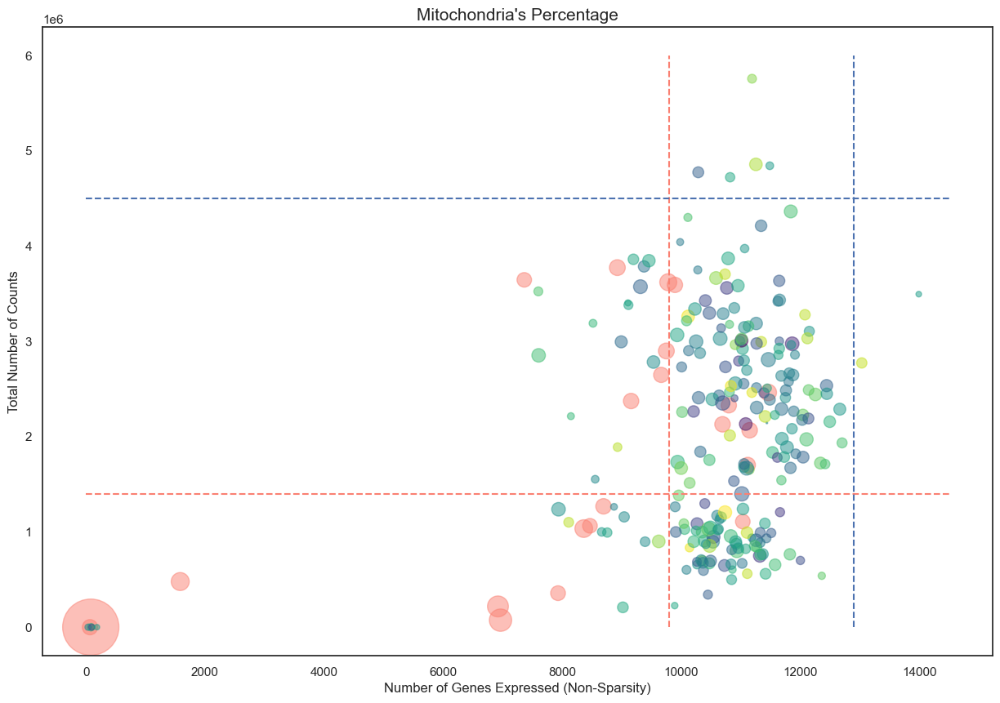

In [ ]:
rng = np.random.RandomState(0)
sns.set_style("white")
fig = plt.figure(figsize=(15, 10))
colors = rng.randn(len(total_count[fractional_mito<=high_threshold_mytho]))
plt.scatter(number_genes[fractional_mito>high_threshold_mytho], 
            total_count[fractional_mito>high_threshold_mytho], alpha=0.5,
            s = fractional_mito[fractional_mito>high_threshold_mytho] * 5000, c = 'salmon', cmap='viridis')

plt.scatter(number_genes[(fractional_mito<=high_threshold_mytho)], 
            total_count[(fractional_mito<=high_threshold_mytho)], alpha=0.5,
            s=fractional_mito[fractional_mito<=high_threshold_mytho]*5000, c=colors, cmap='viridis')

#Low thresholds
plt.plot([0,14500], [low_threshold_counts, low_threshold_counts], color='salmon', 
              linestyle='dashed', label="Lower Thresholds")
plt.plot([low_threshold_reads,low_threshold_reads], [0, 6*10**6], color='salmon', 
              linestyle='dashed')

#High thresholds
plt.plot([0,14500], [high_threshold_counts, high_threshold_counts], color='b', 
              linestyle='dashed', label="Higher Thresholds")
plt.plot([high_threshold_reads,high_threshold_reads], [0, 6*10**6], color='b', 
              linestyle='dashed')

plt.legend(loc=(0.05,0.9))
plt.xlabel("Number of Genes Expressed (Non-Sparsity)")
plt.ylabel("Total Number of Counts")
plt.title("Mitochondria's Percentage", fontsize=15);

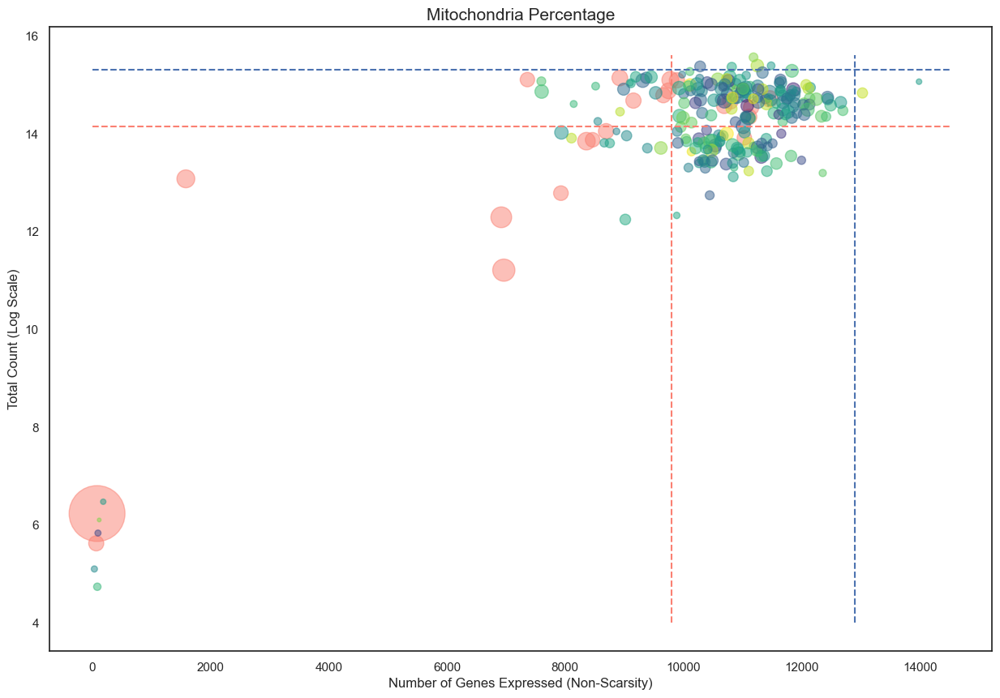

In [ ]:
rng = np.random.RandomState(0)
sns.set_style("white")
fig = plt.figure(figsize=(15, 10))
colors = rng.randn(len(total_count[fractional_mito<=high_threshold_mytho]))
plt.scatter(number_genes[fractional_mito>high_threshold_mytho], 
            np.log(total_count[fractional_mito>high_threshold_mytho]), alpha=0.5,
            s = fractional_mito[fractional_mito>high_threshold_mytho] * 5000, c = 'salmon', cmap='viridis')

plt.scatter(number_genes[(fractional_mito<=high_threshold_mytho)], 
            np.log(total_count[(fractional_mito<=high_threshold_mytho)]), alpha=0.5,
            s=fractional_mito[fractional_mito<=high_threshold_mytho]*5000, c=colors, cmap='viridis')
#Low thresholds
plt.plot([0,14500], [np.log(low_threshold_counts), np.log(low_threshold_counts)], color='salmon', 
              linestyle='dashed', label="Lower Thresholds")
plt.plot([low_threshold_reads,low_threshold_reads], [4, np.log(6*10**6)], color='salmon', 
              linestyle='dashed')

#High thresholds
plt.plot([0,14500], [np.log(high_threshold_counts), np.log(high_threshold_counts)], color='b', 
              linestyle='dashed', label="Higher Thresholds")
plt.plot([high_threshold_reads,high_threshold_reads], [4, np.log(6*10**6)], color='b', 
              linestyle='dashed')

plt.legend(loc=(0.4,0.05))
plt.xlabel("Number of Genes Expressed (Non-Scarsity)")
plt.ylabel("Total Count (Log Scale)")
plt.title("Mitochondria Percentage", fontsize=15);

Now that we have all these 3 components we can combine them in order to finally select which are the cells that may be filtered. We propose these as possible thresholds to filter the cells. 

In the graph we plot the 3 characteristics for each cell, in particular we have:

- reads on the x-axis
- counts on the y-axis
- mitochondrial ratio is represented by the size of the balls.

Moreover the cells with mitochondrial ratio bigger than high_threshold_mytho = 0.0325 are the ones represented by a red ball. The red and blue dashed lines are, respectively, the lower and upper thresholds that we discussed in the previous paragraphs about the counts and the reads.

There are 9 cells which are below the 2 red thresholds and have a mitochondrial ratio bigger than 0.0325. These are likely to be cells whose cytoplasmic mRNA has leaked out through a broken membrane, so that only the mRNA that remains in the mitochondria is detected. Then, as we explained at the beginning of the Quality Controll paragraph, we can remove these cells.

Another importat remark is that there are 5 cells that, although they don't have a high mitochondrial ratio, and so aren't cells with a broken membrane, have very low counts and reads, and are therefore likely to be dying cells with low methabolic activity. For this reason, we remove those cells as well.

Finally, we notice that no cell has been identified as a clear candidate to be a doublet.

In [ ]:
count_mask = (total_count < low_threshold_counts)
reads_mask = (number_genes < low_threshold_reads)
mytho_mask = (fractional_mito > high_threshold_mytho)

broken_membrane = (count_mask & reads_mask & mytho_mask)
df_broken_membrane = df[broken_membrane]
df_broken_membrane

,"""WASH7P""","""CICP27""","""DDX11L17""","""WASH9P""","""OR4F29""","""MTND1P23""","""MTND2P28""","""MTCO1P12""","""MTCO2P12""","""MTATP8P1""",...,"""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP""","""MAFIP"""
"""output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,177,10,779,2,1,...,12,5,3,1574,331,8,1829,8,30,0
"""output.STAR.PCRPlate1G6_Hypoxia_S15_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,25,0,81,0,0,...,1,0,3,149,40,4,400,2,2,1
"""output.STAR.PCRPlate2C12_Normoxia_S59_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,125,20,755,2,0,...,28,14,14,2638,580,30,3341,13,40,9
"""output.STAR.PCRPlate2C1_Hypoxia_S131_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,127,25,1076,3,1,...,25,7,14,2624,410,11,1921,13,28,14
"""output.STAR.PCRPlate2D12_Normoxia_S60_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,17,3,191,0,0,...,6,3,5,771,135,8,857,3,13,3
"""output.STAR.PCRPlate2E12_Normoxia_S61_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""output.STAR.PCRPlate2G10_Normoxia_S157_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,230,6,8,1,0,...,43,27,2,0,0,804,67,27,409,0
"""output.STAR.PCRPlate3D2_Hypoxia_S168_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,31,0,0,0,0,0
"""output.STAR.PCRPlate4B1_Hypoxia_S221_Aligned.sortedByCoord.out.bam""",0,2,0,0,1,130,1,100,1,0,...,27,1,2,251,167,29,583,4,13,0


In [ ]:
dying = ((total_count < 5e3) & (number_genes < 200))
df_dying = df[dying]
df_dying

,"""WASH7P""","""CICP27""","""DDX11L17""","""WASH9P""","""OR4F29""","""MTND1P23""","""MTND2P28""","""MTCO1P12""","""MTCO2P12""","""MTATP8P1""",...,"""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP""","""MAFIP"""
"""output.STAR.PCRPlate1B1_Hypoxia_S98_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""output.STAR.PCRPlate2E12_Normoxia_S61_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""output.STAR.PCRPlate2F12_Normoxia_S62_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
"""output.STAR.PCRPlate3D10_Normoxia_S188_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""output.STAR.PCRPlate3D11_Normoxia_S92_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""output.STAR.PCRPlate3D2_Hypoxia_S168_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,31,0,0,0,0,0
"""output.STAR.PCRPlate3D3_Hypoxia_S72_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"""output.STAR.PCRPlate3D5_Hypoxia_S78_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0


In [ ]:
y

,Condition
"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""",False
"""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""",False
"""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""",True
"""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""",True
"""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""",True
...,...
"""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""",False
"""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""",False
"""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""",True
"""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""",False


In [ ]:
df_filtered = df[~ (dying | broken_membrane)]
y_filtered = y.loc[y.index[(~ (dying | broken_membrane))]]
df_filtered.shape

(228, 23396)

In [ ]:
df = df_filtered
y= y_filtered

### Gene Selection

We now turn our attention to genes. Since they are so abundant, we need to filter a significant proportion of them out in order to lower the burden on downstream analysis tools. First, we will leverage the sparsity that we observed in the gene counts and remove those genes that are expressed in no more than a few cells. Then, we will consider the variability of the genes across the cells, and keep only the most variable genes.

#### Duplicate genes

Before proceeding to consider sparsity and variability, we will check for duplicate genes, i.e. pairs of genes that have the same counts across all cells. It is likely that the cause of the duplication in redundancy during gene annotation, or overlap in the genomic regions. If this is true, keeping more than one copy of such genes could bias the analysis and the classifiers. However, in order to make comparisons with studies in the literature, this should be annotated, as one of the dropped features could constitute an important biological link with some historical study.

In [ ]:
duplicate_genes_df = df.T[df.T.duplicated(keep=False)]
print("number of duplicate genes: ", duplicate_genes_df.shape[0])
print("Duplicate genes: ", duplicate_genes_df)

number of duplicate genes:  148
Duplicate genes:               "output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"  \
"MMP23A"                                                     0                        
"LINC01647"                                                  0                        
"CSF3R"                                                      0                        
"PTGFR"                                                      0                        
"LINC01361"                                                  0                        
...                                                        ...                        
"FPR1"                                                       0                        
"LILRB2"                                                     0                        
"TMEM150B"                                                   0                        
"LRRC74B"                                                    0                  

So there are 148 genes that are not unique. It should be noted that this has been computed for the filtered data. If on one hand this reduces the probability that the genes labeled as duplicate really are cause by an annotation mistake, on the other hand it is on the filtered data that the downstream analysis is performed, and so it is that data which we wish not to bias by keeping duplicate features. To check whether removing these genes could be harmful, let's look at some significant statistics.

In [ ]:
duplicate_genes_df.T.describe()

,"""MMP23A""","""LINC01647""","""CSF3R""","""PTGFR""","""LINC01361""","""ITGA10""","""RORC""","""TTC24""","""ATP1A4""","""GPA33""",...,"""MIR1-1HG-AS1""","""CHRNA4""","""OR7G2""","""LINC00661""","""PLVAP""","""FPR1""","""LILRB2""","""TMEM150B""","""LRRC74B""","""POM121L7P"""
count,228.000000,228.000000,228.000000,228.000000,228.000000,228.000000,228.000000,228.0,228.000000,228.000000,...,228.000000,228.000000,228.000000,228.000000,228.000000,228.000000,228.000000,228.000000,228.0,228.000000
mean,0.008772,0.004386,0.008772,0.008772,0.004386,0.004386,0.008772,0.0,0.004386,0.004386,...,0.004386,0.004386,0.004386,0.004386,0.004386,0.004386,0.008772,0.004386,0.0,0.004386
std,0.093452,0.066227,0.132453,0.132453,0.066227,0.066227,0.093452,0.0,0.066227,0.066227,...,0.066227,0.066227,0.066227,0.066227,0.066227,0.066227,0.093452,0.066227,0.0,0.066227
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
max,1.000000,1.000000,2.000000,2.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000


In [ ]:
(duplicate_genes_df.T == 0).sum(axis=0)/duplicate_genes_df.T.shape[0]

"MMP23A"       0.991228
"LINC01647"    0.995614
"CSF3R"        0.995614
"PTGFR"        0.995614
"LINC01361"    0.995614
                 ...   
"FPR1"         0.995614
"LILRB2"       0.991228
"TMEM150B"     0.995614
"LRRC74B"      1.000000
"POM121L7P"    0.995614
Length: 148, dtype: float64

Most of the duplicate genes are extremely sparse. Combined with the previous observations, this seems evidence enough to remove them.

In [ ]:
df_noDup=(df.T.drop_duplicates()).T
df = df_noDup
df.shape

(228, 23303)

#### Sparsity of genes

Very sparse genes are expressed by no more than a few cells, and thus they are not informative of the cell heterogeneity. In fact, we are interested in studying the Normoxia and Hypoxia conditions, both of which are very well represented in our dataset, as can be seen below, so we do not expect very sparse genes to be very relevant for the classification.

In [ ]:
y["Condition"].value_counts()

True     119
False    109
Name: Condition, dtype: int64

First of all, let us compute the overall sparsity of the dataset.

In [ ]:
print("sparsity level:", (df == 0).sum().sum() / df.size)

sparsity level: 0.5371285302472161


The sparsity level indicates that one entry out of two in the dataset is 0. One could consider using a sparse matrix representation to save memory and possibly speed up the computations. However, modern CPUs exploit highly optimized vector operations and multi-threading that make computations with dense representation faster than they once were. This, combined with the fact that the overall sparsity level is not extremely high (sklearn documentation for instance recommends to use sparse representations for sparsity levels above 90 %), imply that a gain in speed from a sparse representation is unlikely in this case. Since memory is not critical, we stick to a dense representation.

Now we compute the sparsity level of each gene.

In [ ]:
sparsity_genes = (df==0).sum(axis=0)/df.shape[0]
sparsity_genes

"WASH7P"      0.973684
"CICP27"      0.947368
"DDX11L17"    0.811404
"WASH9P"      0.850877
"OR4F29"      0.899123
                ...   
"MT-TE"       0.048246
"MT-CYB"      0.000000
"MT-TT"       0.043860
"MT-TP"       0.008772
"MAFIP"       0.267544
Length: 23303, dtype: float64

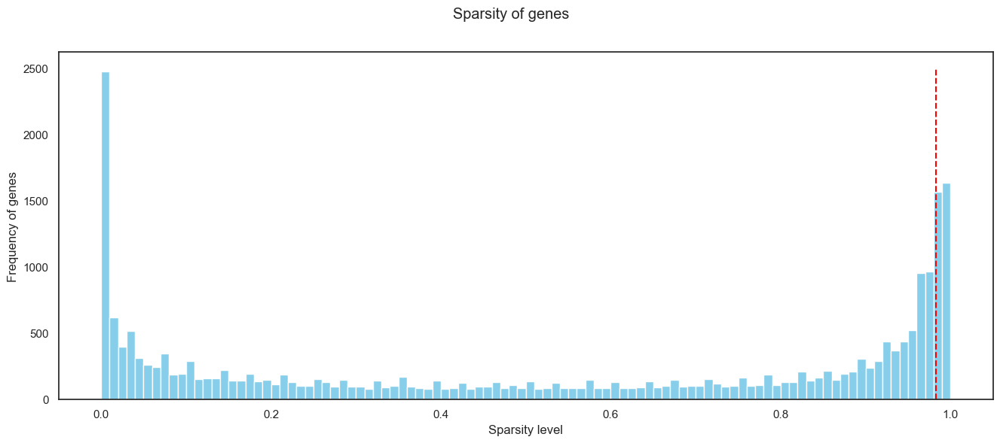

In [ ]:
fig = plt.figure(figsize=(16, 6))
sns.set_style("white")

ax1 = plt.axes()
bars = ax1.hist(sparsity_genes, bins = 100, color = 'skyblue')

# Labels
fig.suptitle("Sparsity of genes")
ax1.set_xlabel("Sparsity level")
ax1.set_ylabel("Frequency of genes");

sparsity_threshold = 0.9824

ax1.plot([sparsity_threshold, sparsity_threshold], [0, 2500], color='red', linestyle='dashed')

sns.set_theme() # resetting the style plot

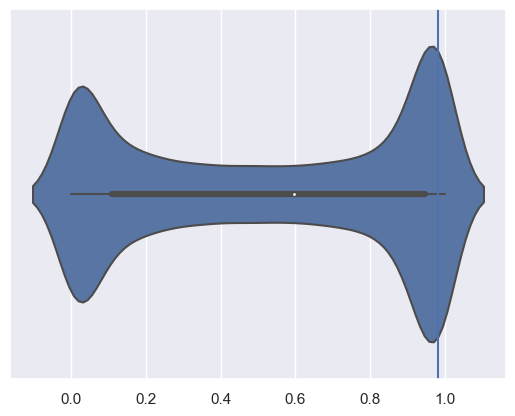

In [ ]:
sns.violinplot(x=sparsity_genes)
plt.axvline(x=0.9824)
plt.show()

From the graphs, we see that the distribution of the sparsity levels of genes is strongly bimodal, with a cluster of very dense genes and one of extremely sparse ones. In light of our previous considerations, the very sparse genes can be filtered, as they constitute an extra burden for downstream analysis which is unlikely to be rewarded with improved performance. We choose the threshold so that the filtered genes are those that are expressed in 4 or less cells.

In [ ]:
print(f"Threshold: {df.shape[0] * (1 - sparsity_threshold)}")

Threshold: 4.012799999999988


In [ ]:
sparse_genes = (sparsity_genes > sparsity_threshold)
df_noSparse = df.drop(df.columns[sparse_genes], axis=1)
df_noSparse.head()

,"""WASH7P""","""CICP27""","""DDX11L17""","""WASH9P""","""OR4F29""","""MTND1P23""","""MTND2P28""","""MTCO1P12""","""MTCO2P12""","""MTATP8P1""",...,"""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP""","""MAFIP"""
"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""",0,0,0,0,2,250,54,1740,6,1,...,17,5,15,3852,900,22,4208,26,66,0
"""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,424,100,2340,5,1,...,49,29,36,7457,1439,43,6491,62,71,4
"""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,11,0,22,0,0,...,0,0,0,93,12,0,25,0,1,0
"""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,63,16,1020,3,0,...,43,17,8,1479,234,0,4819,11,3,7
"""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,27,3,303,0,0,...,0,0,3,303,33,0,310,4,9,0


In [ ]:
df = df_noSparse

#### Variability

We now consider the variability of the genes across the cells. Ideally, we would prefer to keep those genes that vary the most across the dataset, because constant features aren't very informative. In quantifying the variability of a gene, we take into account its mean expression to avoid biasing the selection towards genes with very high counts which will, naturally, have a higher variance in absolute terms. We begin by plotting the variance vs the mean for the various genes.

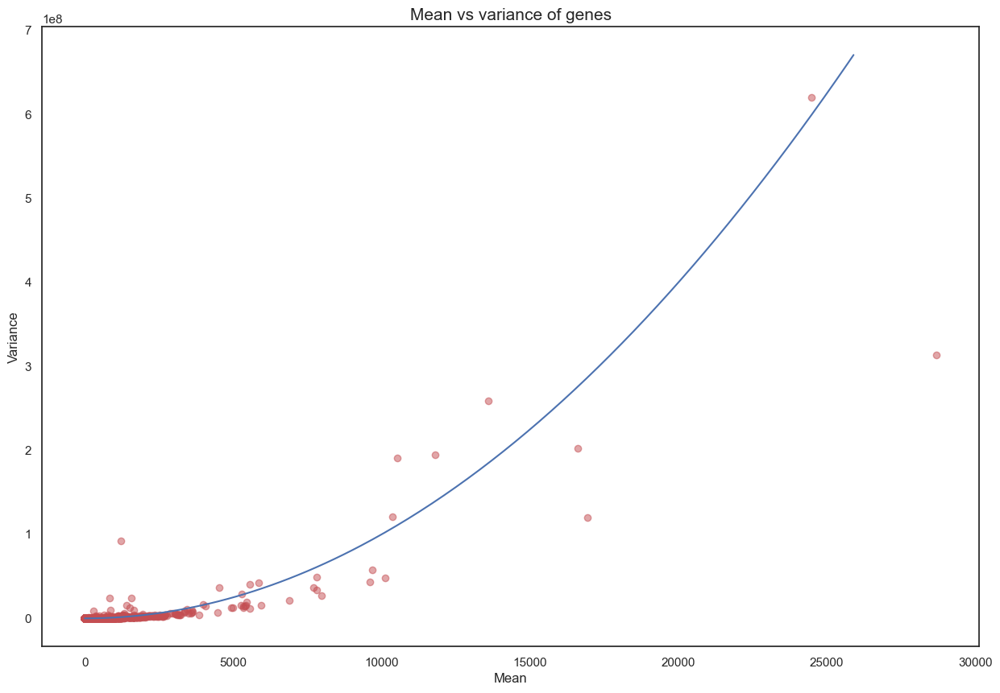

In [ ]:
sns.set_style("white")
fig = plt.figure(figsize=(15, 10))

variance=(df.var())
mean = df.mean()
plt.scatter(mean, 
            variance, alpha=0.5, c="r", cmap='viridis')
x=np.arange(0,26000,100)
f_x=x**2
plt.plot(x, f_x)
plt.xlabel("Mean")
plt.ylabel("Variance")
plt.title("Mean vs variance of genes", fontsize=15);

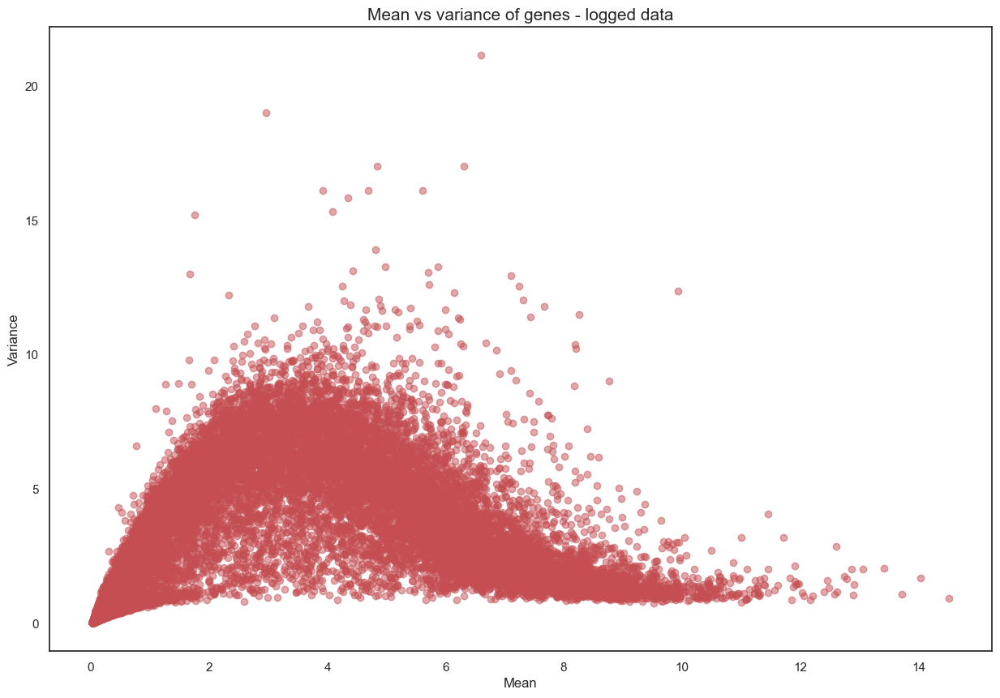

In [ ]:
sns.set_style("white")
fig = plt.figure(figsize=(15, 10))

variance=(np.log2(1 + df).var())
mean = np.log2(1 + df).mean()
plt.scatter(mean, 
            variance, alpha=0.5, c="r", cmap='viridis')
plt.xlabel("Mean")
plt.ylabel("Variance")
plt.title("Mean vs variance of genes - logged data", fontsize=15);

We see from the plots, especially the non-logged one, that the typical variance to mean ratio changes as the mean changes. The log transformation mitigates this, as the plot shows. To avoid biasing our selection towards genes with means in a specific range, we split the genes into bins based on their mean expression and normalize the mean-variance ratios by the typical mean variance ratios of the bins. We use logged data because this makes the composition of the bins more uniform, as the plot for the original data shows a great concentration of genes with small mean, while bigger mean genes become more and more dispersed.

In [ ]:
import math

bins = [0, 0.25, 0.5, 0.75, 1, 1.25, 1.5, 1.75, 2, 2.5, 3, 3.5, 4, 4.5, 5, 5.5, 6, 6.5, 7, 8, 10, math.inf]
l = len(bins) - 1
binned = pd.cut(mean, bins=bins, labels=np.arange(1, l+1), retbins=False)

In [ ]:
binned.value_counts()

1     4402
2     1552
19    1136
20    1038
3      948
9      866
10     855
14     849
13     835
15     830
16     827
12     793
11     781
17     761
18     705
4      697
5      624
7      492
6      491
8      456
21     159
dtype: int64

The bins have been chosen so that neither the number of genes per bin nor the width of the bins is too unbalanced. Now we compute the typical variance to mean ratio for each bin, and we use it to normalize the variance to mean ratios of the individual genes.

In [ ]:
coeff = np.zeros(l)
counter = np.zeros(l)
for gene in binned.index:
    i = binned.loc[gene] - 1
    coeff[i] += variance.loc[gene] / mean.loc[gene]
    counter[i] += 1
for i in range(l):
    coeff[i] /= counter[i]

In [ ]:
coeff

array([2.33913297, 2.90514161, 2.8599691 , 2.94397493, 2.92059072,
       2.8833304 , 2.73637639, 2.68440019, 2.50349801, 2.18496504,
       1.90716803, 1.64313579, 1.40271409, 1.14959472, 0.95060271,
       0.73211409, 0.5839763 , 0.42729274, 0.31831165, 0.19953013,
       0.12523109])

In [ ]:
ratios = variance / mean
ratios

"WASH7P"      1.543042
"CICP27"      1.715841
"DDX11L17"    1.684510
"WASH9P"      1.402548
"OR4F29"      1.142294
                ...   
"MT-TE"       0.655406
"MT-CYB"      0.145792
"MT-TT"       0.640271
"MT-TP"       0.425815
"MAFIP"       1.044278
Length: 20097, dtype: float64

In [ ]:
for gene in ratios.index:
    ratios.loc[gene] /= coeff[binned.loc[gene]-1]
ratios

"WASH7P"      0.659664
"CICP27"      0.733537
"DDX11L17"    0.579838
"WASH9P"      0.599602
"OR4F29"      0.488341
                ...   
"MT-TE"       0.343654
"MT-CYB"      1.164181
"MT-TT"       0.389664
"MT-TP"       0.447943
"MAFIP"       0.381628
Length: 20097, dtype: float64

Now we sort the genes based on the normalized variance to mean ratios. Usually a number of genes in the range of 1000 to 5000 is selected, based on the complexity of the downstream analysis tasks. To be on the safe side, as a first attempt we keep the most variable 5000 genes. Anyway, the literature suggests that downstream analysis is robust to the exact choice of this threshold, so we can make this first choice and possibly revisit it in the future.

In [ ]:
sorted_ratios = ratios.sort_values(ascending=False)
sorted_ratios

"ANGPTL4"     7.507096
"KRT6A"       6.979530
"AKR1C2"      6.366900
"DDIT4"       6.258435
"RRM2"        6.250192
                ...   
"XRCC6P2"     0.162961
"RPS2P46"     0.161725
"MIR3620"     0.149378
"DAND5"       0.148447
"RPL18AP3"    0.143170
Length: 20097, dtype: float64

In [ ]:
most_variable = sorted_ratios.iloc[:5000]
most_variable

"ANGPTL4"      7.507096
"KRT6A"        6.979530
"AKR1C2"       6.366900
"DDIT4"        6.258435
"RRM2"         6.250192
                 ...   
"TM9SF2"       1.267415
"SDC3"         1.267351
"LINC00381"    1.267307
"POGK"         1.267296
"ZNF783"       1.267269
Length: 5000, dtype: float64

In [ ]:
df_most_variable = df.loc[:, most_variable.index]
df_most_variable

,"""ANGPTL4""","""KRT6A""","""AKR1C2""","""DDIT4""","""RRM2""","""G0S2""","""SPP1""","""FOS""","""AURKB""","""CDC20""",...,"""USB1""","""SMBD1P""","""KDM5A""","""PRXL2B""","""CFAP44""","""TM9SF2""","""SDC3""","""LINC00381""","""POGK""","""ZNF783"""
"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""",0,622,562,0,1816,168,1264,281,433,819,...,1,0,0,31,0,220,0,0,1,28
"""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""",0,0,480,5508,1972,46,34,783,3262,5428,...,830,0,347,241,2,323,0,0,232,8
"""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""",178,38,0,1766,123,343,27,208,163,114,...,35,0,0,16,1,4,5,0,7,0
"""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""",3498,0,0,14739,0,1461,755,2242,0,0,...,540,0,363,228,0,1916,141,0,0,274
"""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""",1203,75,199,2719,934,526,36,175,443,303,...,50,0,0,77,0,12,0,0,69,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""",6,4775,905,90,1170,417,603,956,703,1100,...,268,0,122,363,0,65,0,0,117,0
"""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""",0,230,0,63,18,394,69,42,198,788,...,153,0,59,10,0,100,0,0,49,0
"""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""",3691,723,839,11921,307,3073,446,0,395,2408,...,388,0,14,239,0,330,0,0,201,30
"""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""",16,1181,419,96,337,309,15,238,237,1140,...,111,0,29,59,0,98,0,0,49,0


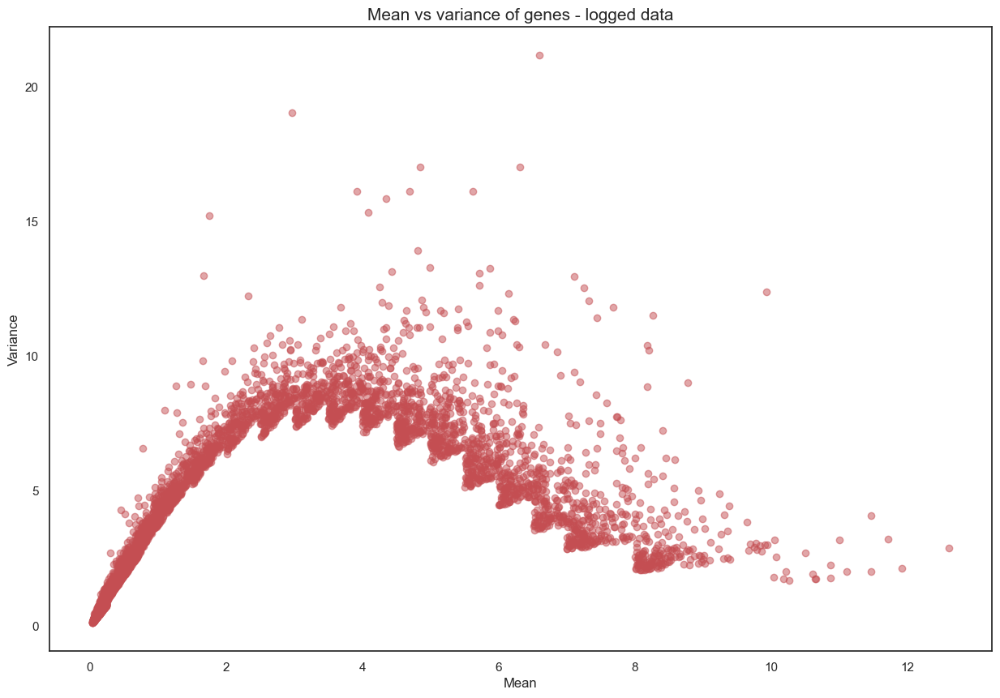

In [ ]:
sns.set_style("white")
fig = plt.figure(figsize=(15, 10))

variance_most_variable = (np.log2(1 + df_most_variable).var())
mean_most_variable = np.log2(1 + df_most_variable).mean()
plt.scatter(mean_most_variable, 
            variance_most_variable, alpha=0.5, c="r", cmap='viridis')
plt.xlabel("Mean")
plt.ylabel("Variance")
plt.title("Mean vs variance of genes - logged data", fontsize=15);

This graph is to be compared with the logged data graph above. It shows that our method of normalizing the variance to mean ratios based on bins selected the most variable genes from each bin, as expected. The following histogram shows the normalized ratios of all the genes, and where the cut has been operated.

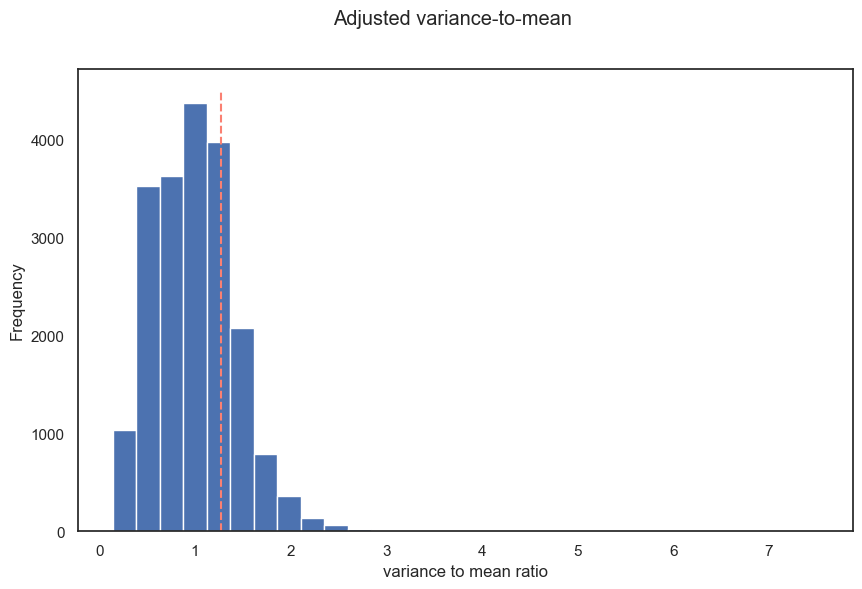

In [ ]:
fig = plt.figure(figsize=(10, 6))
sns.set_style("white")

ax1 = plt.axes()
bars = ax1.hist(ratios, bins = 30)

# Labels
fig.suptitle("Adjusted variance-to-mean")
ax1.set_xlabel("variance to mean ratio")
ax1.set_ylabel("Frequency");

ax1.plot([1.27, 1.27], [0, 4500], color='salmon', 
              linestyle='dashed')

sns.set_theme() # resetting the style plot

To validate our feature selection, we compare it to the filtered dataset that was provided. We find out that 88 % of the genes that were kept in the filtered dataset have been kept by our filtering as well. 

In [ ]:
filtered = pd.read_csv(hcc_smart, delimiter='\ ', engine='python', index_col=0).T
filtered.head()

,"""DDIT4""","""ANGPTL4""","""CALML5""","""KRT14""","""CCNB1""","""IGFBP3""","""AKR1C2""","""KRT6A""","""NDRG1""","""KRT4""",...,"""MST1R""","""ZYG11A""","""NRG1""","""RBMS3""","""VCPIP1""","""LINC02693""","""OR8B9P""","""NEAT1""","""ZDHHC23""","""ODAD2"""
"""output.STAR.PCRPlate1G12_Normoxia_S32_Aligned.sortedByCoord.out.bam""",0,48,0,321,298,82,6250,634,0,0,...,78,10,136,0,0,29,0,29,0,0
"""output.STAR.PCRPlate1G1_Hypoxia_S102_Aligned.sortedByCoord.out.bam""",8739,2101,55,96,1824,1938,62,0,522,413,...,279,0,264,0,134,68,0,213,0,0
"""output.STAR.PCRPlate1G2_Hypoxia_S2_Aligned.sortedByCoord.out.bam""",13098,14032,0,0,1616,247,430,907,348,0,...,311,0,38,0,0,0,0,92,0,0
"""output.STAR.PCRPlate1G3_Hypoxia_S7_Aligned.sortedByCoord.out.bam""",2880,356,0,6211,3,3430,79,1953,592,176,...,125,0,16,0,4,1,0,1,0,0
"""output.STAR.PCRPlate1G4_Hypoxia_S107_Aligned.sortedByCoord.out.bam""",7777,5661,4383,0,145,4618,246,85,206,0,...,268,1,25,0,0,0,0,128,0,0


In [ ]:
genes_we_have = np.array(df_most_variable.columns)
target_genes = np.array(filtered.columns)
genes_we_have

array(['"ANGPTL4"', '"KRT6A"', '"AKR1C2"', ..., '"LINC00381"', '"POGK"',
       '"ZNF783"'], dtype=object)

In [ ]:
target_genes

array(['"DDIT4"', '"ANGPTL4"', '"CALML5"', ..., '"NEAT1"', '"ZDHHC23"',
       '"ODAD2"'], dtype=object)

In [ ]:
matches = 0

for gene in target_genes:
    if gene in genes_we_have:
        matches += 1
matches

2627

In [ ]:
2627 / 3000

0.8756666666666667

We are satisfied with our filtering, so we update the dataframe

In [ ]:
df = df_most_variable

In [ ]:
df.shape

(228, 5000)

### Normalization

When carrying out an experiment multiple times, there are going to be some fluctuations in the results that can depend on a multitude of experimental conditions and settings that were not equal across all the experiments. In order to mitigate this, data is usually normalized at the level of cells, and various techniques are possible.

The genome of every cell has been amplified by PCR, and this process happened on one of four different plates. Therefore, it is possible that there are differences in the statistical properties of the cells coming from the different plates. In the following, we investigate this by doing a simple check: we compute the mean count depth for each batch, and we divide by the standard deviation of the count depths in the whole (filtered) dataset. In fact, the standard deviation represents the typical deviation from the mean of a count depth in the dataset, and it is in relation to this value that we should ask ourselves whether the difference in the means of the batches are significant.

In [ ]:
cls = np.array(df.index)
for i in range(len(cls)):
    cls[i] = cls[i][1:-1]

In [ ]:
meta = meta.loc[cls, :]
meta

,Cell Line,PCR Plate,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,HCC1806,1,A10,Normo,24,S123,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,HCC1806,1,A12,Normo,24,S26,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,HCC1806,1,A1,Hypo,24,S97,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,HCC1806,1,A2,Hypo,24,S104,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,HCC1806,1,A3,Hypo,24,S4,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
...,...,...,...,...,...,...,...,...
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,HCC1806,4,H10,Normo,24,S210,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,HCC1806,4,H11,Normo,24,S214,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,HCC1806,4,H2,Hypo,24,S199,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


In [ ]:
meta['PCR Plate'].value_counts()

3    63
1    61
2    57
4    47
Name: PCR Plate, dtype: int64

In [ ]:
m = max(meta['PCR Plate'])
std = df.sum(axis=1).std()

for i in range(1, m+1):
    msk = np.array([(meta['PCR Plate'] == i).iloc[j] for j in range(df.shape[0])])
    b = df.loc[msk, :]
    print(f"Batch {i}: {b.sum(axis=1).mean() / std}")

Batch 1: 2.0901154934767856
Batch 2: 1.9741531246910506
Batch 3: 1.6977195844136985
Batch 4: 1.4138335830757054


From this simple computation, it seems that the plate where PCR was performed does have an influence on the mean count depth. To obtain more conclusive evidence, a statistical test should be carried out, and, if it confirmed our hypothesis, this information should be leveraged to correct the normalization of the cells. However, we will not pursue this approach, but rather go for a simpler approach known as counts per million: we normalize by the size of each cell's count depth, and we multiply the results by 1e6 to adjust the scale of the data. This approach to normalization presupposes that all cells in the dataset have the same level of overall gene expression. More fancy methods exist that do not make this simplistic assumption, but we do not pursue them here.

In [ ]:
total_count = df.sum(axis=1)
cpm = total_count/1000000
cpm

"output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam"    0.323610
"output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam"     0.906096
"output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam"       0.056125
"output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam"      0.741777
"output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam"        0.188277
                                                                            ...   
"output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam"    0.536755
"output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam"    0.189298
"output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam"      0.567722
"output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam"     0.184719
"output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"     0.305334
Length: 228, dtype: float64

In [ ]:
cpm_df = pd.DataFrame(cpm)
df_normalized = df.div(cpm_df.iloc[:,0], axis='rows')

In [ ]:
df_normalized

,"""ANGPTL4""","""KRT6A""","""AKR1C2""","""DDIT4""","""RRM2""","""G0S2""","""SPP1""","""FOS""","""AURKB""","""CDC20""",...,"""USB1""","""SMBD1P""","""KDM5A""","""PRXL2B""","""CFAP44""","""TM9SF2""","""SDC3""","""LINC00381""","""POGK""","""ZNF783"""
"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""",0.000000,1922.066685,1736.658323,0.000000,5611.693087,519.143413,3905.936158,868.329162,1338.030345,2530.824140,...,3.090139,0.0,0.000000,95.794320,0.000000,679.830660,0.000000,0.0,3.090139,86.523902
"""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""",0.000000,0.000000,529.745193,6078.826085,2176.369833,50.767248,37.523618,864.146845,3600.060038,5990.535219,...,916.017729,0.0,382.961629,265.976232,2.207272,356.474369,0.000000,0.0,256.043510,8.829087
"""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""",3171.492205,677.060134,0.000000,31465.478842,2191.536748,6111.358575,481.069042,3706.013363,2904.231626,2031.180401,...,623.608018,0.0,0.000000,285.077951,17.817372,71.269488,89.086860,0.0,124.721604,0.000000
"""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""",4715.702967,0.000000,0.000000,19869.853069,0.000000,1969.594636,1017.826112,3022.471713,0.000000,0.000000,...,727.981590,0.0,489.365402,307.370005,0.000000,2582.986531,190.084082,0.0,0.000000,369.383251
"""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""",6389.521822,398.349241,1056.953319,14441.487808,4960.775878,2793.756008,191.207636,929.481562,2352.916182,1609.330933,...,265.566160,0.0,0.000000,408.971887,0.000000,63.735879,0.000000,0.0,366.481301,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""",11.178284,8896.051271,1686.057885,167.674265,2179.765442,776.890760,1123.417574,1781.073302,1309.722313,2049.352125,...,499.296700,0.0,227.291781,676.286201,0.000000,121.098080,0.000000,0.0,217.976544,0.000000
"""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""",0.000000,1215.015478,0.000000,332.808588,95.088168,2081.374341,364.504643,221.872392,1045.969846,4162.748682,...,808.249427,0.0,311.677884,52.826760,0.000000,528.267599,0.000000,0.0,258.851124,0.000000
"""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""",6501.421470,1273.510627,1477.835983,20997.953224,540.757624,5412.860520,785.595767,0.000000,695.763067,4241.512571,...,683.433089,0.0,24.659957,420.980691,0.000000,581.270411,0.000000,0.0,354.046523,52.842765
"""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""",86.618052,6393.494984,2268.310244,519.708314,1824.392726,1672.811135,81.204424,1288.443528,1283.029899,6171.536225,...,600.912738,0.0,156.995220,319.404068,0.000000,530.535570,0.000000,0.0,265.267785,0.000000


In [ ]:
df = df_normalized

### Log Transformation

In this section, we are going to apply a logaithmic transformation to our data. This has three main benefits. First, an increase or decrease by 1 in log-scale represents a doubling or halving of the counts, which is the canonical way to measure changes in the expression levels. Second, as already remarked in the section about variability of genes, a log transformation mitigates the so called mean-variance relationship that is often found in single cell sequencing data (i.e., the variance of genes grows more than linearly as their mean grows). Finally, a logarithmic transformation reduces the skewness of the data, which as we will see is very high, making less unrealistic the assumption, common to many downstream analysis techniques (e.g. PCA, which we widly use in the subsequent analysis, can be formulated in a probabilistic latent variable setting as a noise free special case of PPCA, assuming normality), that data is normally distributed.

We plot histograms representing the distributions of the skewness and kurtosis of the data, before and after the logarithmic transformation, both at the level of cells and at the level of genes. The skewness can be interpreted as a measure of the asymmetry of a distribution, while the kurtosis can be thought of as quantifying how heavy the tails of the distribution are.

In [ ]:
df_log = df.apply(lambda x: np.log2(1+x))

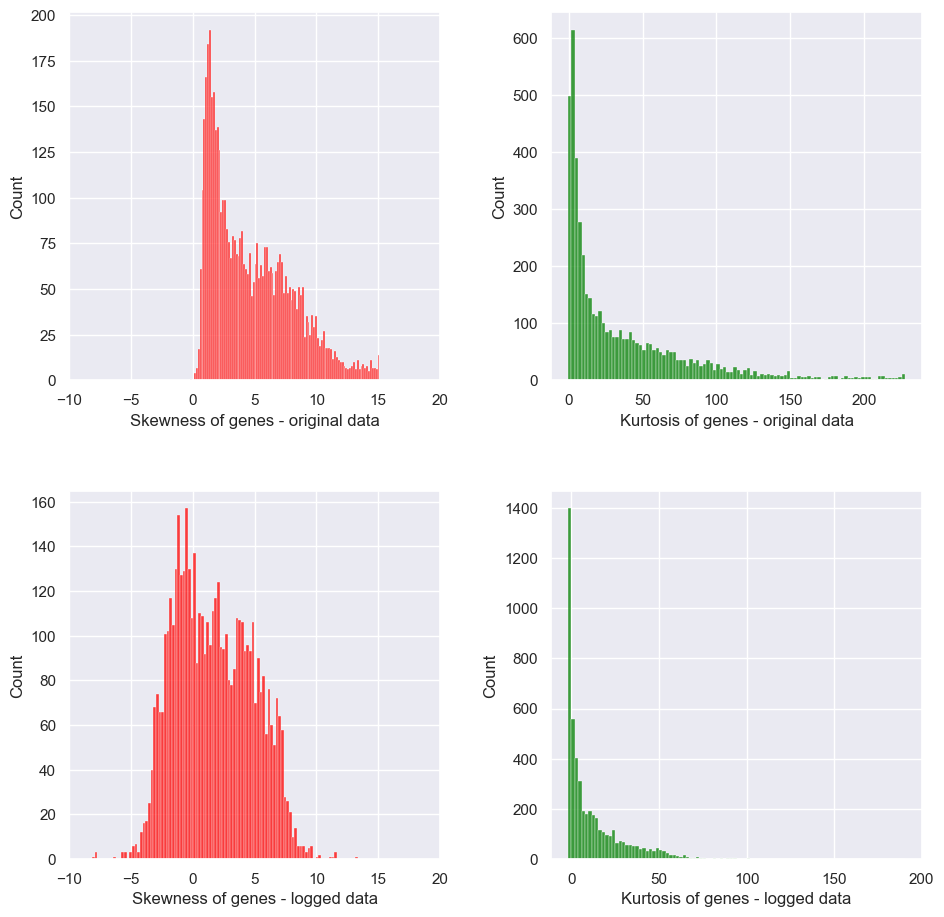

In [ ]:
from scipy.stats import kurtosis, skew 

fig, ax = plt.subplots( 2, 2, figsize = (11,11))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)



#subplot 1

n_cols = df.shape[1]
skew_genes = []
for i in range(n_cols) :     
     skew_genes += [df.iloc[:, i].skew()]

bars = sns.histplot(skew_genes, bins = 100, ax=ax[0, 0], color = 'red')

#labels
ax[0, 0].set_xlabel('Skewness of genes - original data')
ax[0,0].set_xlim(-10,20) 


#subplot 2

kurt_genes = []
for i in range(n_cols) :     
     kurt_genes += [df.iloc[:, i].kurtosis()]

bars = sns.histplot(kurt_genes, bins = 100, ax=ax[0, 1], color = 'green')

#labels
ax[0, 1].set_xlabel('Kurtosis of genes - original data')



#subplot 3
n_cols = df_log.shape[1]
skew_genes_log = []
for i in range(n_cols) :     
     skew_genes_log += [df_log.iloc[:, i].skew()]

bars = sns.histplot(skew_genes_log, bins = 100, ax=ax[1, 0], color = 'red')
#ax[0, 0].hist(skew_cells, bins = 100, color = 'red')

# Labels
ax[1, 0].set_xlabel('Skewness of genes - logged data')
ax[1, 0].set_xlim(-10,20) 

#subplot 4 
kurt_genes_log = []
for i in range(n_cols) :     
     kurt_genes_log += [df_log.iloc[:, i].kurtosis()]


bars = sns.histplot(kurt_genes_log, bins = 100, ax=ax[1, 1], color = 'green')

# Labels
ax[1, 1].set_xlabel('Kurtosis of genes - logged data')

plt.show()

sns.set_theme() # resetting the style plot

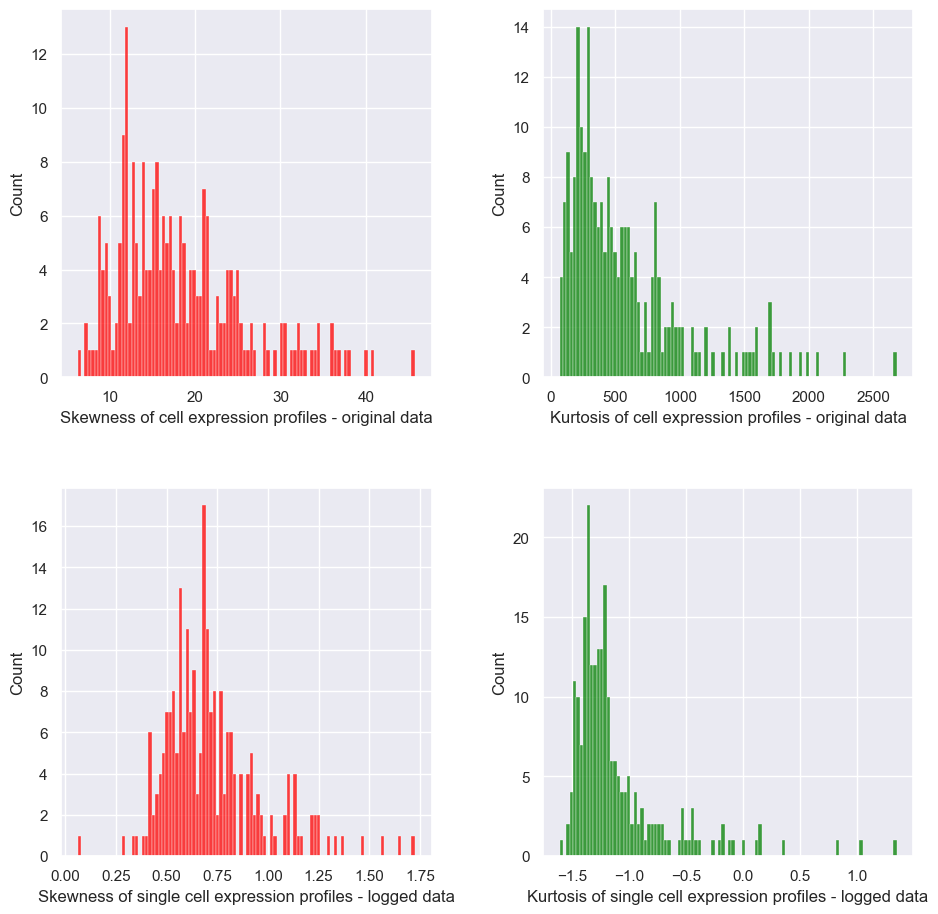

In [ ]:

fig, ax = plt.subplots( 2, 2, figsize = (11,11))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)


#subplot 1
n_rows = df.shape[0]
skew_cells = []
for i in range(n_rows) :     
     skew_cells += [df.iloc[i, :].skew()]

bars = sns.histplot(skew_cells, bins = 100, ax=ax[0, 0], color = 'red')

# Labels
ax[0, 0].set_xlabel('Skewness of cell expression profiles - original data')

#subplot 2 
kurt_cells = []
for i in range(n_rows) :     
     kurt_cells += [df.iloc[i, :].kurtosis()]

bars = sns.histplot(kurt_cells, bins = 100, ax=ax[0, 1], color = 'green')

# Labels
ax[0, 1].set_xlabel('Kurtosis of cell expression profiles - original data')

#subplot 3

n_rows = np.shape(df_log)[0]
skew_cells_log = []
for i in range(n_rows) :     
     skew_cells_log += [df_log.iloc[i, :].skew()]

bars = sns.histplot(skew_cells_log, bins = 100, ax=ax[1, 0], color = 'red')

#labels
ax[1, 0].set_xlabel('Skewness of single cell expression profiles - logged data')


#subplot 4

kurt_cells_log = []
for i in range(n_rows) :     
     kurt_cells_log += [df_log.iloc[i, :].kurtosis()]

bars = sns.histplot(kurt_cells_log, bins = 100, ax=ax[1, 1], color = 'green')

#labels
ax[1, 1].set_xlabel('Kurtosis of single cell expression profiles - logged data')

plt.show()

sns.set_theme() # resetting the style plot

The distributions of both genes and cells are highly skewed with very heavy tails. After the log transformation, this is mitigated.

By default, scipy uses Fisher's definition of Kurtosis, which can take positive, negative or 0 values. When it is positive, tails are heavy and the distribution peaks acutely around its mean. When it is negative, tails are thinner and the distribution is flatter around the mean. When it is 0, it is close to the shape of a normal distribution.

In light of this, although the logged data are most definitely not normally distributed, their shape resembles that of a gaussian much more than the non-logged data, since their distribution is more symmetric (skewness closer to 0) and their kurtosis is closer to that of a normal (again, 0). Now, we plot the distributions of a few genes and a few cells to see visually how the distributions changed after the transformation. These graphs are to be compared with those in the preliminary analysis.

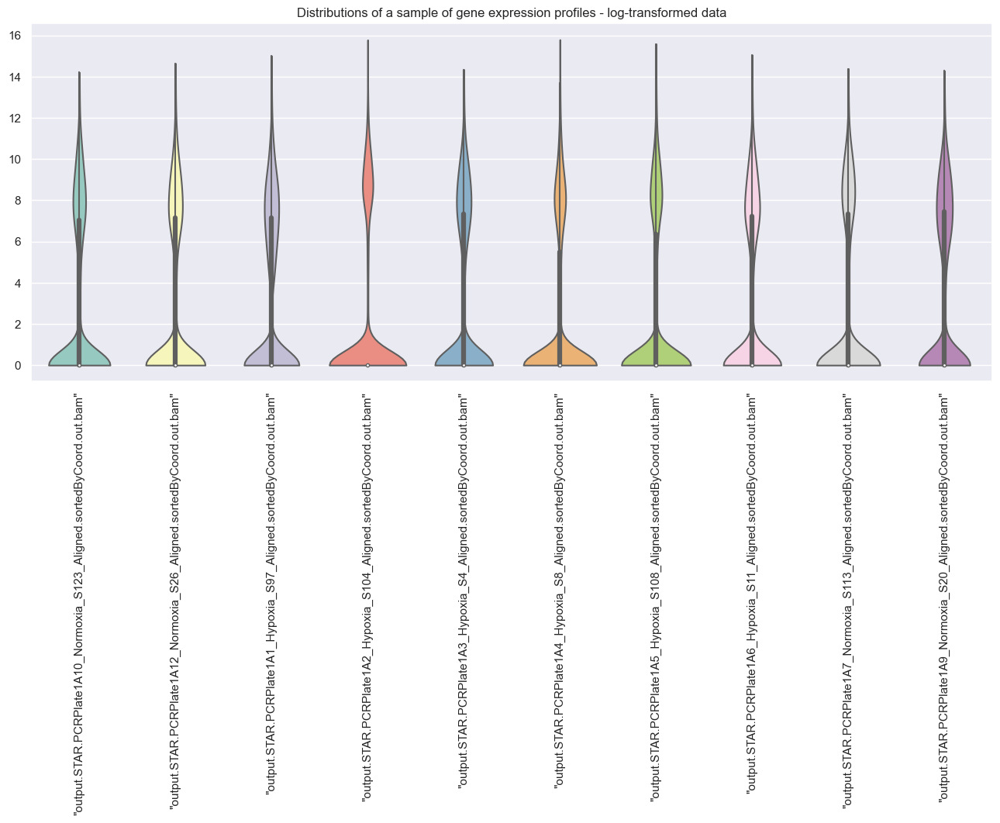

In [ ]:
df_log_small = df_log.iloc[:10, :].T
plt.figure(figsize=(16, 6))
sns.violinplot(data=df_log_small, palette='Set3', cut=0)
plt.xticks(rotation=90)
plt.title("Distributions of a sample of gene expression profiles - log-transformed data")
plt.show()

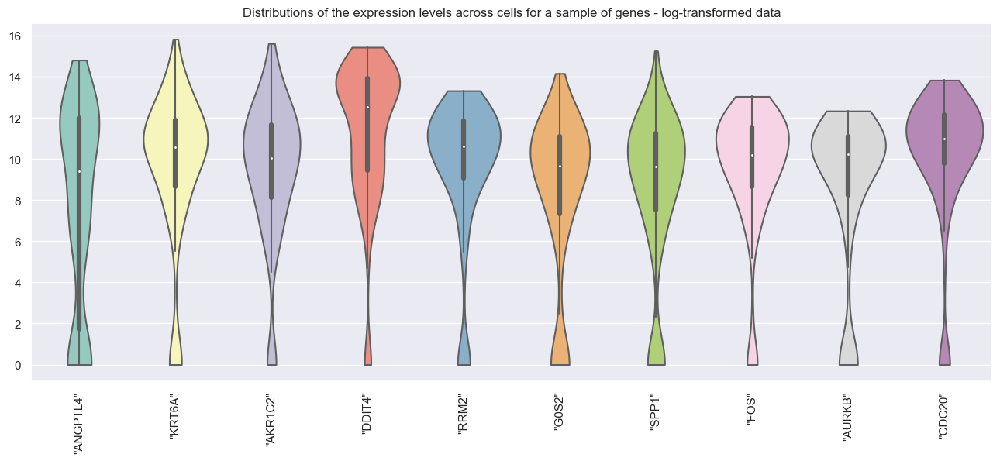

In [ ]:
df_log_small = df_log.iloc[:, :10]
plt.figure(figsize=(16, 6))
sns.violinplot(data=df_log_small, palette='Set3', cut=0)
plt.xticks(rotation=90)
plt.title("Distributions of the expression levels across cells for a sample of genes - log-transformed data")
plt.show()

### Correlation

Now that the quality control and basic EDA has been carried out, we can explore the data structure. In this section we will investigate the correlations between cells and then between genes. To accentuate the patterns we want to find in the correlation matrices, we will use the non-logged data throughout the following section (the logged data does not make certain distinctions as clear).

#### Correlations between cells

In this section we will look for correlations between cells. We expect that correlation between the gene expression of single cells will tend to be quite high, especially now that the data has been filtered. For this reason, we will be especially interested in seeing how the correlation coefficients between cells are affected by their condition as hypoxic and normoxic. 

In [ ]:
cells_corr = df.T.corr()
cells_corr

,"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A9_Normoxia_S20_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
"""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""",1.000000,0.695320,0.497843,0.361612,0.566884,0.378757,0.610798,0.557311,0.704910,0.683414,...,0.676146,0.677754,0.538549,0.572909,0.752558,0.677254,0.577747,0.445224,0.507231,0.901815
"""output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam""",0.695320,1.000000,0.469060,0.318466,0.488881,0.400041,0.563767,0.596802,0.598379,0.569527,...,0.619898,0.577767,0.495899,0.580273,0.639196,0.559117,0.524513,0.413639,0.413172,0.699606
"""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""",0.497843,0.469060,1.000000,0.770395,0.813311,0.530188,0.740668,0.862729,0.609107,0.637830,...,0.527871,0.786296,0.832422,0.816353,0.744365,0.677822,0.650992,0.820577,0.735977,0.568892
"""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""",0.361612,0.318466,0.770395,1.000000,0.699944,0.265738,0.552815,0.589992,0.429566,0.665981,...,0.324703,0.661983,0.756122,0.761975,0.568753,0.698071,0.673415,0.894320,0.832287,0.380684
"""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""",0.566884,0.488881,0.813311,0.699944,1.000000,0.396557,0.596635,0.736261,0.636062,0.789535,...,0.511602,0.701662,0.673686,0.803835,0.775775,0.754429,0.726550,0.822178,0.735345,0.600937
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""",0.677254,0.559117,0.677822,0.698071,0.754429,0.264108,0.548425,0.592777,0.671110,0.829921,...,0.561322,0.685289,0.676454,0.737799,0.797289,1.000000,0.810914,0.765368,0.845011,0.677902
"""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""",0.577747,0.524513,0.650992,0.673415,0.726550,0.215536,0.470392,0.544172,0.582095,0.782486,...,0.452567,0.621800,0.582972,0.691838,0.725054,0.810914,1.000000,0.762836,0.810089,0.552411
"""output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam""",0.445224,0.413639,0.820577,0.894320,0.822178,0.339661,0.602241,0.678395,0.512714,0.737751,...,0.388716,0.697651,0.753397,0.828504,0.659898,0.765368,0.762836,1.000000,0.852554,0.446969
"""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""",0.507231,0.413172,0.735977,0.832287,0.735345,0.248587,0.519894,0.574145,0.576168,0.785570,...,0.452430,0.667504,0.727812,0.737479,0.705993,0.845011,0.810089,0.852554,1.000000,0.525773


In [ ]:
cells_hypo = pd.DataFrame(cells_corr.index[y["Condition"]==1][:])
cells_norm = pd.DataFrame(cells_corr.index[y["Condition"]==0][:])
cells_heat = cells_corr.loc[pd.concat([cells_hypo, cells_norm],  axis=0)[0], pd.concat([cells_hypo, cells_norm],  axis=0)[0]]
cells_heat.head()

,"""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1B2_Hypoxia_S1_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1B3_Hypoxia_S5_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1B4_Hypoxia_S105_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1B5_Hypoxia_S109_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate4F12_Normoxia_S242_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4F7_Normoxia_S203_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4F9_Normoxia_S235_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G10_Normoxia_S209_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam"""
"""output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam""",1.000000,0.770395,0.813311,0.530188,0.740668,0.862729,0.793242,0.834430,0.594005,0.703510,...,0.600021,0.693671,0.618431,0.442937,0.527871,0.744365,0.677822,0.650992,0.735977,0.568892
"""output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam""",0.770395,1.000000,0.699944,0.265738,0.552815,0.589992,0.802962,0.774032,0.284039,0.396117,...,0.445985,0.662008,0.490716,0.338917,0.324703,0.568753,0.698071,0.673415,0.832287,0.380684
"""output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam""",0.813311,0.699944,1.000000,0.396557,0.596635,0.736261,0.790940,0.803781,0.460562,0.526402,...,0.588229,0.746619,0.675929,0.515397,0.511602,0.775775,0.754429,0.726550,0.735345,0.600937
"""output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam""",0.530188,0.265738,0.396557,1.000000,0.693680,0.648724,0.297769,0.415503,0.649443,0.723971,...,0.462600,0.386059,0.430855,0.317800,0.582530,0.450973,0.264108,0.215536,0.248587,0.468385
"""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""",0.740668,0.552815,0.596635,0.693680,1.000000,0.829306,0.469409,0.608599,0.668793,0.874571,...,0.714767,0.628700,0.666067,0.530954,0.664852,0.691648,0.548425,0.470392,0.519894,0.703124


We'll now plot the full correlation matrix. We will order the cells by choosing all hypoxic cells first, then all normoxic cells.

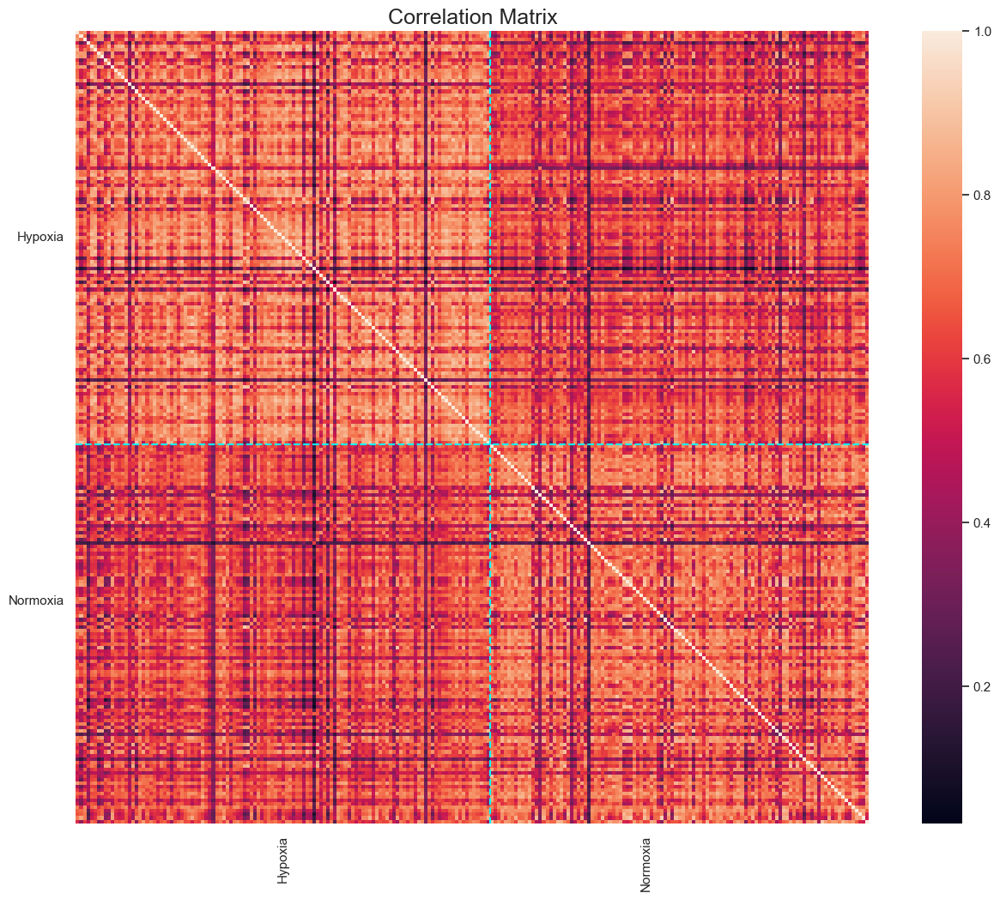

In [ ]:
f, ax = plt.subplots(figsize=(16, 12))
sns.heatmap(cells_heat, vmax=1,
            cbar=True, square=True, fmt='.2f', annot_kws={'size': 10})
plt.yticks([59.5, 164], ["Hypoxia", "Normoxia"])
plt.plot([0,y.shape[0]], [y["Condition"].value_counts()[True], y["Condition"].value_counts()[True]], color='cyan', 
              linestyle='dashed')
plt.plot([y["Condition"].value_counts()[True],y["Condition"].value_counts()[True]], [0, y.shape[0]], color='cyan', 
              linestyle='dashed')
plt.xticks([59.5, 164], ["Hypoxia", "Normoxia"])
plt.title("Correlation Matrix", fontsize=18);

The above heatmap implies that hypoxic and normoxic cells tend to have a higher correlation among cells of  the same state compared to their correlations with cells of the opposite state. This could be because some genes are expressed at high levels only in cells of one respective state, thus causing this correlation between their gene expressions. We also see that some cells are consistently uncorrelated with any other cells. In order to better see the individual correlations, we focus on the correlations of a randomly chosen subset of 40 cells, half being hypoxic. 

In [ ]:
np.random.seed(42)
msk=np.random.choice(np.arange(y["Condition"].value_counts().min()), 20, replace=False)
#msk = np.random.randint(0, y["Condition"].value_counts().min(), size=20)
cells_hypo = pd.DataFrame(cells_corr.index[y["Condition"]==1][msk])
cells_norm = pd.DataFrame(cells_corr.index[y["Condition"]==0][msk])
cells_heat = cells_corr.loc[pd.concat([cells_hypo, cells_norm],  axis=0)[0], pd.concat([cells_hypo, cells_norm],  axis=0)[0]]
cells_heat.head()

,"""output.STAR.PCRPlate3E1_Hypoxia_S162_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1B6_Hypoxia_S12_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate3F2_Hypoxia_S66_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate3A3_Hypoxia_S69_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate3B3_Hypoxia_S70_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate2A1_Hypoxia_S129_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate2D5_Hypoxia_S41_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate3H3_Hypoxia_S172_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.PCRPlate3G9_Normoxia_S185_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate3H10_Normoxia_S192_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate3H7_Normoxia_S81_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate1E7_Normoxia_S116_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate3E12_Normoxia_S217_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate3A11_Normoxia_S89_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate3F10_Normoxia_S190_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam""","""output.STAR.PCRPlate2E11_Normoxia_S57_Aligned.sortedByCoord.out.bam"""
"""output.STAR.PCRPlate3E1_Hypoxia_S162_Aligned.sortedByCoord.out.bam""",1.000000,0.406109,0.810434,0.564187,0.727923,0.501806,0.774373,0.701640,0.703789,0.704090,...,0.602282,0.385031,0.524887,0.795579,0.438260,0.415130,0.384206,0.495104,0.403858,0.468226
"""output.STAR.PCRPlate1B6_Hypoxia_S12_Aligned.sortedByCoord.out.bam""",0.406109,1.000000,0.566117,0.857610,0.638572,0.119943,0.657446,0.690872,0.731803,0.629894,...,0.613372,0.749425,0.499092,0.409935,0.792184,0.691331,0.721513,0.708429,0.826191,0.617634
"""output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam""",0.810434,0.566117,1.000000,0.703196,0.862309,0.355081,0.852088,0.818854,0.843212,0.815220,...,0.668363,0.501741,0.610798,0.720060,0.551085,0.490519,0.461000,0.621484,0.519894,0.586366
"""output.STAR.PCRPlate3F2_Hypoxia_S66_Aligned.sortedByCoord.out.bam""",0.564187,0.857610,0.703196,1.000000,0.726974,0.228955,0.747776,0.777114,0.818758,0.716556,...,0.585354,0.758358,0.553826,0.539734,0.737094,0.653059,0.625789,0.701503,0.864565,0.592791
"""output.STAR.PCRPlate3A3_Hypoxia_S69_Aligned.sortedByCoord.out.bam""",0.727923,0.638572,0.862309,0.726974,1.000000,0.320498,0.843093,0.854801,0.854696,0.809075,...,0.676704,0.523661,0.609966,0.683903,0.595660,0.550884,0.535925,0.650613,0.505849,0.628013


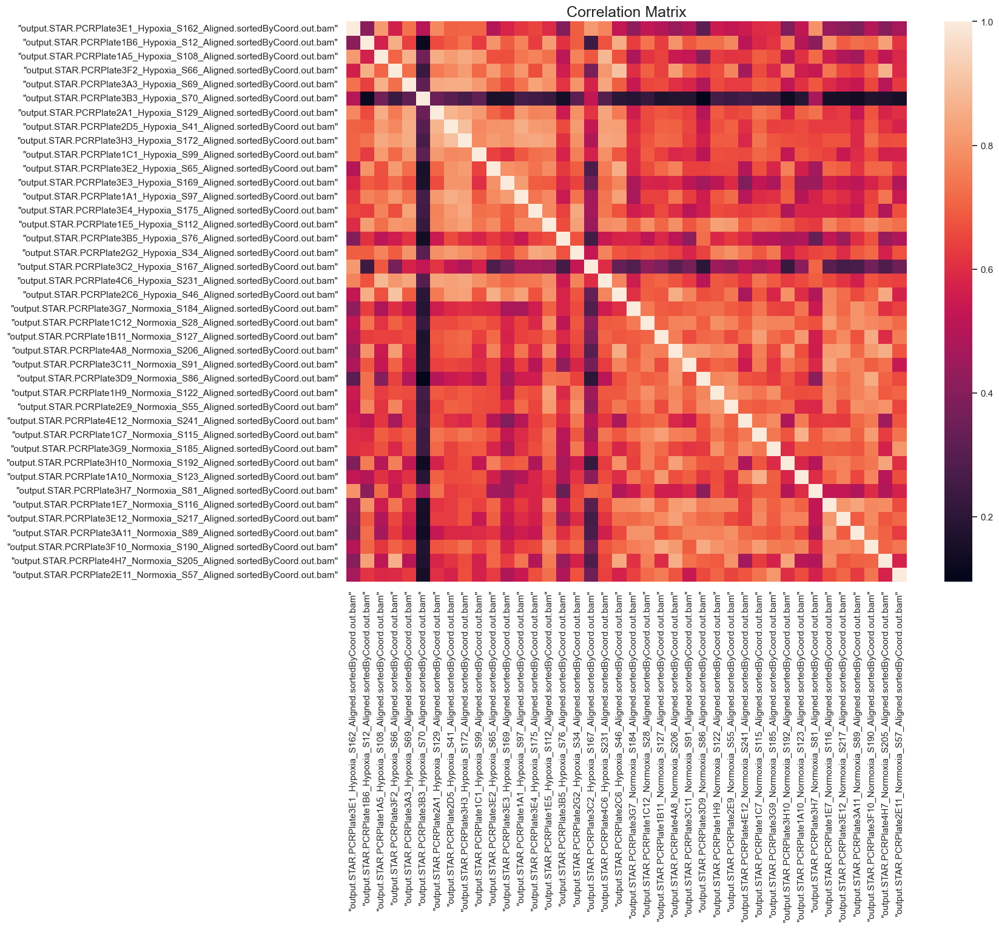

In [ ]:
f, ax = plt.subplots(figsize=(16, 12))

sns.heatmap(cells_heat, vmax=1,
            cbar=True, square=True, fmt='.2f', annot_kws={'size': 10})
plt.yticks([i+0.5 for i in range(cells_heat.columns.shape[0])], list(cells_heat.columns))
plt.xticks([i+0.5 for i in range(cells_heat.columns.shape[0])], list(cells_heat.columns))
plt.title("Correlation Matrix", fontsize=18);

The enhanced heatmap reinforces our initial observations, since the top left and bottom right corners are clearly "lighter", and therefore more correlated, than other regions. We also identified a cell (cell S70) that is consistently uncorrelated with other cells and another (cell S167) which is also tends to be quite uncorrelated. We will explore the gene expression of these cells and compare them to other more "regularly" correlated cells to identify any differences. 

In [ ]:
violin_hypo = df.loc[cells_heat.index[:20],:]

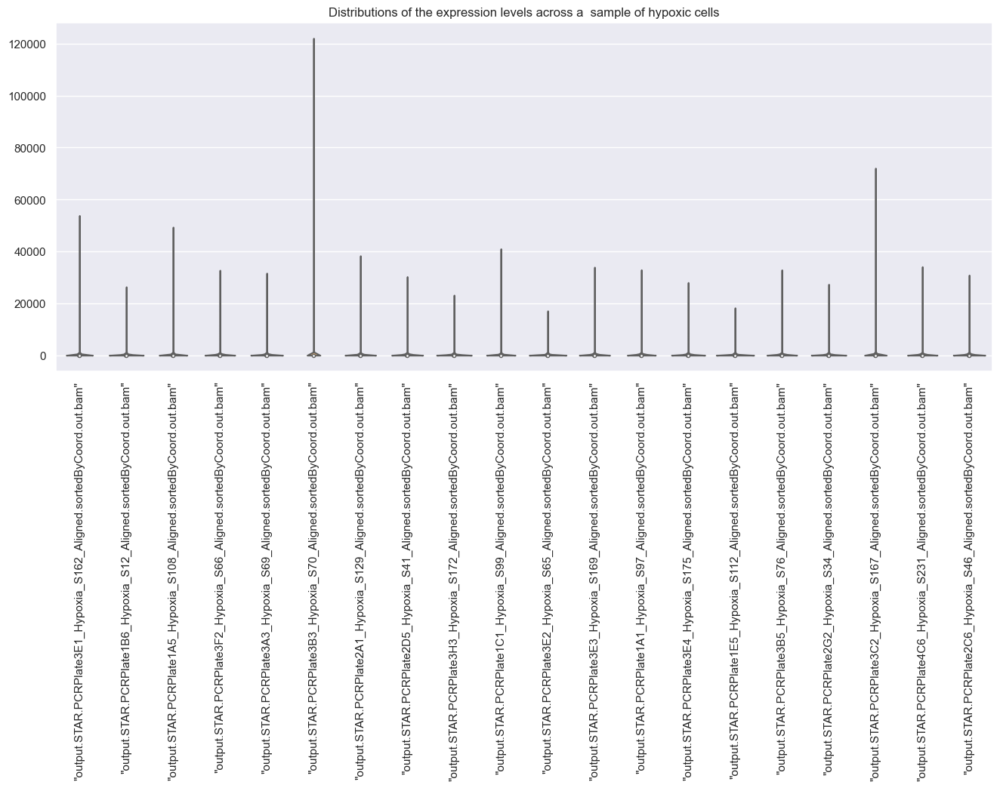

In [ ]:
plt.figure(figsize=(16, 6))
sns.violinplot(data=violin_hypo.T, palette='Set3', cut=0)
plt.xticks(rotation=90)
plt.title("Distributions of the expression levels across a  sample of hypoxic cells")
plt.show()

The two uncorrelated cells are actually very easy to spot, as they have higher values than any other cell. Therefore we infer that these unusually high counts are the cause of this low correlation, since the standard deviation of these cells will tend to be higher than for other cells.

#### Correlations between genes

Now we move to the correlations between genes. Additionally, we will also compute the correlation coefficients between the state of Hypoxia itself and every gene. Our hope is that the genes with the highest correlation coefficients will help us to classify cells.

In [ ]:
df_corr = pd.concat([df, pd.DataFrame(y)], axis=1)
genes_corr = df_corr.corr()
genes_corr

,"""ANGPTL4""","""KRT6A""","""AKR1C2""","""DDIT4""","""RRM2""","""G0S2""","""SPP1""","""FOS""","""AURKB""","""CDC20""",...,"""SMBD1P""","""KDM5A""","""PRXL2B""","""CFAP44""","""TM9SF2""","""SDC3""","""LINC00381""","""POGK""","""ZNF783""",Condition
"""ANGPTL4""",1.000000,-0.177025,-0.185830,0.609280,-0.073108,0.229055,-0.097429,0.399223,-0.180900,-0.083628,...,-0.042498,0.074914,0.023584,0.195711,-0.023173,0.183174,0.038992,-0.086116,0.256867,0.592560
"""KRT6A""",-0.177025,1.000000,0.285992,-0.174813,-0.128216,-0.211225,-0.026480,-0.174261,-0.195044,-0.138063,...,0.040214,-0.042812,0.051897,-0.010617,-0.001668,-0.118013,-0.015453,-0.117988,-0.038883,-0.060620
"""AKR1C2""",-0.185830,0.285992,1.000000,-0.232221,-0.004750,-0.087468,0.376008,-0.241592,-0.064137,-0.096281,...,-0.071849,-0.162484,-0.026367,-0.080630,-0.036975,-0.117035,-0.021039,-0.114395,-0.123300,-0.223170
"""DDIT4""",0.609280,-0.174813,-0.232221,1.000000,-0.083245,0.236535,-0.154639,0.472457,-0.119295,-0.259455,...,-0.070958,0.069895,-0.042060,0.199098,0.114611,0.193669,0.038098,-0.162494,0.183674,0.759969
"""RRM2""",-0.073108,-0.128216,-0.004750,-0.083245,1.000000,0.061126,0.044452,-0.059693,0.490829,-0.180474,...,-0.092696,-0.168507,0.010670,-0.113553,-0.131009,0.059599,0.015689,0.009642,-0.159751,-0.125193
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"""SDC3""",0.183174,-0.118013,-0.117035,0.193669,0.059599,0.226317,-0.059556,0.126160,-0.077090,-0.077482,...,-0.046891,0.008926,0.193550,0.024718,-0.076477,1.000000,0.174756,0.000165,0.148639,0.164650
"""LINC00381""",0.038992,-0.015453,-0.021039,0.038098,0.015689,-0.044195,0.032750,-0.056774,0.018479,-0.007929,...,-0.022950,-0.012665,0.021893,-0.019554,0.071862,0.174756,1.000000,0.150311,-0.006830,0.081820
"""POGK""",-0.086116,-0.117988,-0.114395,-0.162494,0.009642,-0.039023,-0.078473,-0.170680,0.065753,0.033320,...,-0.020157,-0.006270,0.102267,-0.062874,0.015919,0.000165,0.150311,1.000000,-0.120337,-0.159093
"""ZNF783""",0.256867,-0.038883,-0.123300,0.183674,-0.159751,0.020122,-0.045597,0.057230,-0.033386,0.111774,...,-0.072778,0.080232,0.069052,0.271587,0.108384,0.148639,-0.006830,-0.120337,1.000000,0.108188


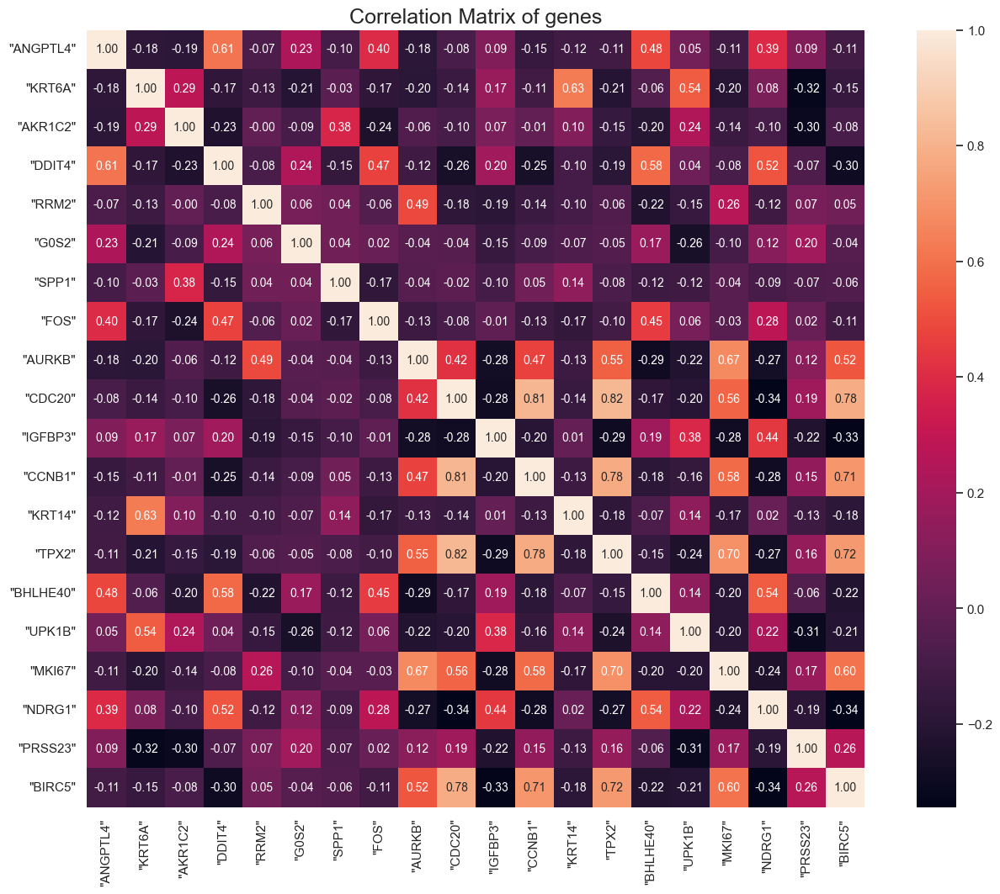

In [ ]:
f, ax = plt.subplots(figsize=(16, 12))
sns.heatmap(genes_corr.iloc[:20,:20], vmax=1,
            cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10})
plt.yticks([i+0.5 for i in range(20)], genes_corr.index[:20])
plt.xticks([i+0.5 for i in range(20)], genes_corr.index[:20])
plt.title("Correlation Matrix of genes", fontsize=18);

Clearly, it is hard to find trends in the correlations between randomly sampled genes. Therefore, we will want the correlations of genes among which we expect to have some sort of relationship. Let's first look at the mitochondrial genes left after the filtering.  

In [ ]:
mito_genes_2 = np.array(genes_corr.columns[genes_corr.columns.str.find("MT-")!=-1])
correct = []
for i, name in enumerate(mito_genes_2):
  if name[1] == "M":
    correct.append(i)
mito_genes_2 = mito_genes_2[correct]
print(mito_genes_2)

['"MT-ATP6"' '"MT-ATP8"']


In [ ]:
genes_corr.loc[mito_genes_2, mito_genes_2]

,"""MT-ATP6""","""MT-ATP8"""
"""MT-ATP6""",1.000000,0.919655
"""MT-ATP8""",0.919655,1.000000


Unfortunately, we only kept two mitochondrial genes during the filtering. Nevertheless, we see that they are very correlated as we would expect. Next, we'll turn our attention to the correlations between genes and the state of hypoxia. We'll sort the genes based on their correlation with hypoxia, choose the first 20 and plot the heatmap of their correlation matrix.

In [ ]:
hypoxia_corr = pd.Series.sort_values((genes_corr["Condition"]), ascending=False)
hypoxia_corr
important_genes = list(hypoxia_corr.index[:20])

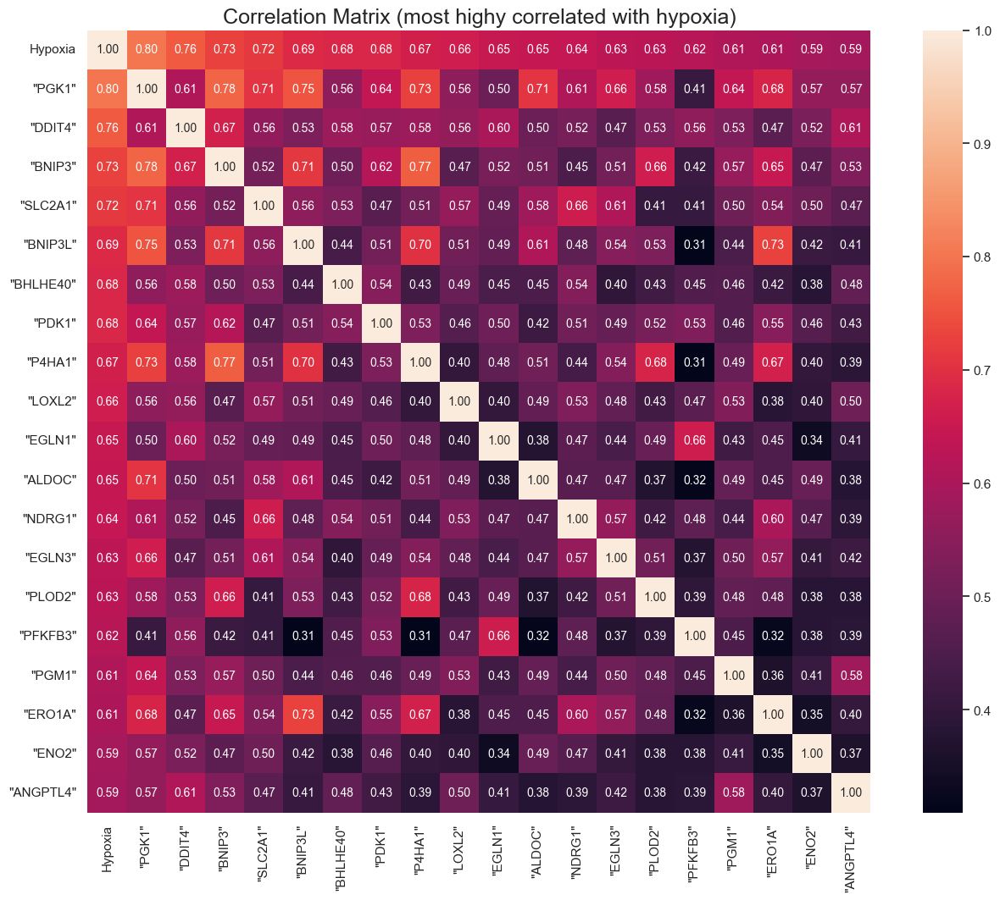

In [ ]:
f, ax = plt.subplots(figsize=(16, 12))
important_genes = list(hypoxia_corr.index[:20])
sns.heatmap(genes_corr.loc[important_genes, important_genes], vmax=1,
            cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10})
plt.yticks([i+0.5 for i in range(20)], ['Hypoxia'] + important_genes[1:])
plt.xticks([i+0.5 for i in range(20)], ['Hypoxia'] + important_genes[1:])
plt.title("Correlation Matrix (most highy correlated with hypoxia)", fontsize=18);

We see from the correlation matrix that, as expected, genes which are highly correlated with hypoxia also tend to be correlated among each other. As the genes become less correlated with hypoxia, their correlations tend to decrease as well. 

We now plot a heatmap described as follows. Every entry describes the ratio counts/max_counts, where 'counts' is the number of times the gene appears in that cell, and max_counts is the maximum count the gene attains along all cells.
On the left we have hypoxic cells, on the right normoxic ones. As expected, the twenty genes mostly correlated with the state "Hypoxia", tend to appear more on Hypoxic cells.

In [ ]:
visual_hypo = (df[(y["Condition"]==1)]/df[(y["Condition"]==1)].max(axis=0)).T
visual_norm = (df[(y["Condition"]==0)]/df[(y["Condition"]==0)].max(axis=0)).T
visual = pd.concat([visual_hypo, visual_norm], axis = 1)
visual_hypo.shape

(5000, 119)

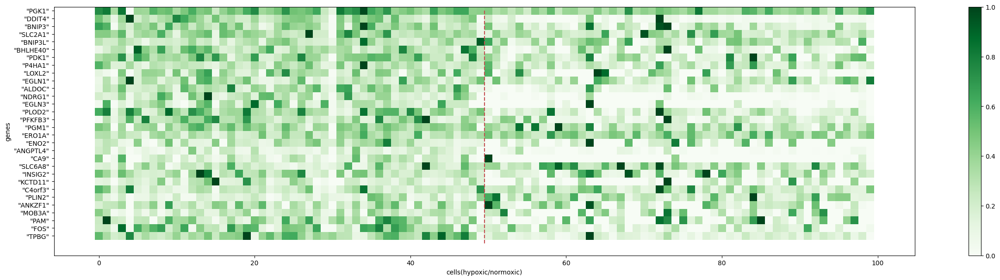

In [ ]:
plt.style.use('default')

fig = plt.figure(figsize=(30, 7))

plt.imshow(visual.loc[list(hypoxia_corr.index[1:31]), visual.columns[y["Condition"].value_counts()[True]-49:y["Condition"].value_counts()[True]+51]], cmap='Greens')
plt.colorbar()

plt.axis('equal')
plt.xlabel('cells(hypoxic/normoxic)')
plt.yticks(np.arange(30), hypoxia_corr.index[1:31])
plt.plot([49.5, 49.5], [0, 30], "--r") 
plt.ylabel("genes");

Now we'll plot a series of boxplots showing the count distribution of the nine genes most highly correlated with hypoxia over normoxic and hypoxic cells.

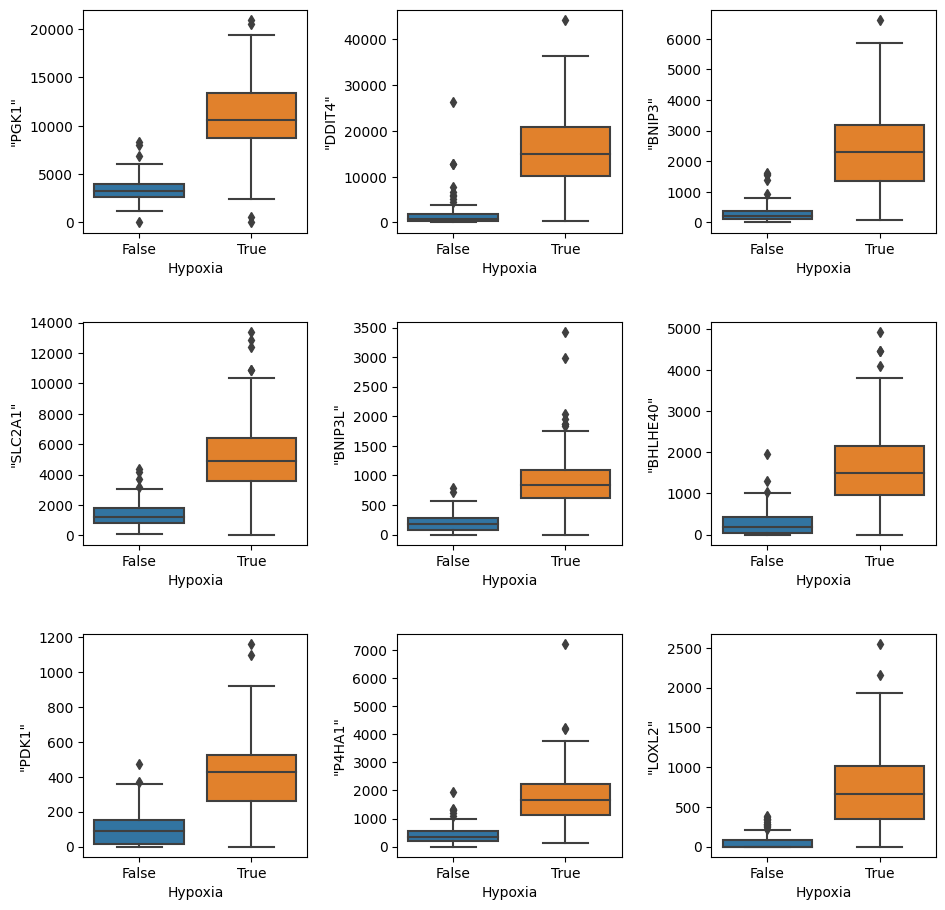

In [ ]:
fig, ax = plt.subplots(3, 3, figsize=(11, 11))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
def find_subplot(i):
  j = i
  r = j//3
  c = j - r*3
  return (r, c)
for i in range(0, 9):
  row, col = find_subplot(i)
  gene = hypoxia_corr.index[i+1]
  sns.boxplot(ax=ax[row, col], x=y["Condition"], y=df[gene])
  ax[row, col].set_xlabel("Hypoxia")

The boxplots and the heatmap show that whenever these genes appear in high quanitity, the cell tends to be hypoxic. Therefore, these genes seem to be good indicators of whether a cell is hypoxic or not. This is a positive result since we would indeed like to use as few genes as possible in order to accurately classify cells, avoiding high dimensional data.  

Now we plot the cells according to their counts of the two most highly correlated genes and then using the three most highly correlated genes, identifying normoxia and hypoxia with different colors.

Text(0, 0.5, 'BNIP3')

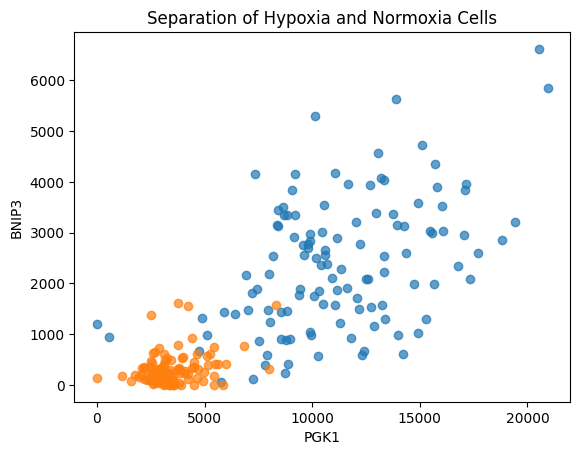

In [ ]:
hypo_ind = np.where(df_corr.loc[:, "Condition"] == 1)
norm_ind = np.where(df_corr.loc[:, "Condition"] == 0)

pg_hypo = df_corr.iloc[hypo_ind].loc[:, '"PGK1"']
bn_hypo = df_corr.iloc[hypo_ind].loc[:, '"BNIP3"']
dd_hypo = df_corr.iloc[hypo_ind].loc[:, '"DDIT4"']

pg_norm = df_corr.iloc[norm_ind].loc[:, '"PGK1"']
bn_norm = df_corr.iloc[norm_ind].loc[:, '"BNIP3"']
dd_norm = df_corr.iloc[norm_ind].loc[:, '"DDIT4"']

plt.scatter(pg_hypo, bn_hypo, alpha=0.7)
plt.scatter(pg_norm, bn_norm, alpha=0.7)
plt.title("Separation of Hypoxia and Normoxia Cells")
plt.xlabel("PGK1")
plt.ylabel("BNIP3")

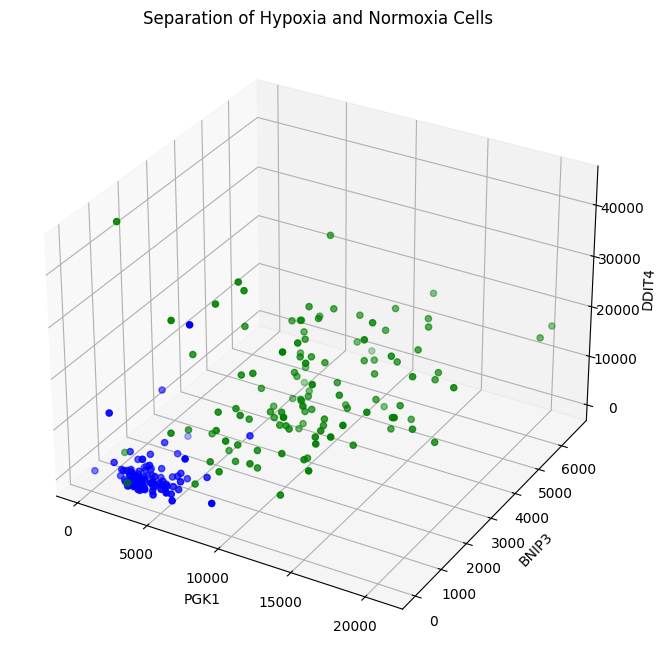

In [ ]:
# Import libraries
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
 
 
 
# Creating figure
fig = plt.figure(figsize = (12, 8))
ax = plt.axes(projection ="3d")
 
# Creating plot
ax.scatter3D(pg_hypo, bn_hypo, dd_hypo, color = "green")
ax.scatter3D(pg_norm, bn_norm, dd_norm, color = "blue")
ax.set_xlabel('PGK1')
ax.set_ylabel('BNIP3')
ax.set_zlabel('DDIT4')
plt.title("Separation of Hypoxia and Normoxia Cells")
 
# show plot
plt.show()

As with the earlier plots, we see that higher counts of these few genes efficitiently distinguish hypoxic cells. This stimulates us to further reduce the dimensionality of our data.

# Unsupervised Analysis

Now that the Exploratory Data Analysis has been carried out, we turn to the Unsupervised Analysis. This will be developed partly here, and partly in the Classification section. More in detail, here we will use Principal Component Analysis and different clustering algorithms to look for relevant subgroups among cells and among genes. Then, we will use Sparse PCA to find interpretable principal components for the various clusters, and we will use tSNE and various plots to visualize the results of the clustering. In the classification part, instead, we will use PCA, clustering and an autoencoder to try different approaches to feature extraction.

Here, we carry out the analysis for the MCF7 SmartSeq dataset. To avoid being repetitive, a summary of the results for the other datasets can be found in the Appendix.

In [ ]:
df, y = format_file(mcf_smart)
df = df.apply(lambda x: np.log2(1+x))
df.head()

,"""CYP1B1""","""CYP1B1-AS1""","""CYP1A1""","""NDRG1""","""DDIT4""","""PFKFB3""","""HK2""","""AREG""","""MYBL2""","""ADM""",...,"""CD27-AS1""","""DNAI7""","""MAFG""","""LZTR1""","""BCO2""","""GRIK5""","""SLC25A27""","""DENND5A""","""CDK5R1""","""FAM13A-AS1"""
"""output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam""",8.426265,7.139551,0.0,0.000000,8.596190,6.247928,0.000000,0.000000,8.897845,0.0,...,6.0,0.0,4.169925,5.906891,0.0,0.0,0.0,5.700440,0.0,0.0
"""output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam""",7.044394,5.906891,0.0,1.000000,8.179909,5.426265,0.000000,9.743151,10.632086,0.0,...,0.0,0.0,1.000000,4.700440,0.0,0.0,0.0,5.129283,0.0,0.0
"""output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam""",8.823367,7.672425,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,9.599913,0.0,...,4.0,0.0,4.584963,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0
"""output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam""",4.807355,3.000000,0.0,0.000000,8.174926,7.748193,4.000000,7.924813,10.219169,0.0,...,1.0,0.0,2.000000,3.459432,0.0,0.0,0.0,2.321928,0.0,0.0
"""output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam""",12.506308,11.382624,0.0,9.355351,11.279030,10.647458,9.548822,8.771489,0.000000,0.0,...,0.0,0.0,6.000000,0.000000,0.0,0.0,0.0,5.930737,0.0,0.0


## KMeans

### Cells

As anticipated, our final aim in this section is to perform clustering. However, most clustering methods are heavily reliant on some notion of distance. Because of the phenomenon known in the literature as the 'Curse of Dimensionality', distances tend to be less meaningful in high dimensional spaces, leading to all kind of counterintuitive effects. For this reason, as a preprocessing step, we perform Principal Component Analysis to reduce the dimensionality of the data, and then cluster the reduced data.

As is customary, we center and scale the data before performing PCA. Indeed, this algorithm tries to find the directions in the feature space that explain the most variance. If the various features had different scales, PCA would be biased towards picking directions that agree with the axes corresponding to the features with biggest values on average, possibly missing important patterns in the data.

In [ ]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X = sc.fit_transform(df)

In [ ]:
X.mean(axis=0)

array([ 2.82440737e-16, -1.59872116e-17,  1.42108547e-17, ...,
       -2.94875235e-16, -2.13162821e-17,  7.10542736e-18])

In [ ]:
X.std(axis=0)

array([1., 1., 1., ..., 1., 1., 1.])

We now perform PCA on the standardized data. We plot the cumulative explained variance as well as a histogram showing the explained variance of the most important components.

In [ ]:
from sklearn.decomposition import PCA

def do_pca(df, n_components=None, do_plot=True, do_out=False):
    pca = PCA(n_components=n_components)
    reduced_arr = pca.fit_transform(df)
    components = pca.components_
    cumsum_pca = np.cumsum(pca.explained_variance_ratio_)
    
    if do_out:
        print(cumsum_pca)
    if do_plot:
        plt.figure(figsize=(16, 4))
        plt.plot(cumsum_pca, linewidth=3)
        plt.xlabel("Dimensions")
        plt.ylabel("Explained Variance")
        plt.title("Explained Variance vs Number of Principal Components")
        plt.grid(True)
        plt.show()
    
    var = pca.explained_variance_ratio_[0:20]
    labels = ["PC"+str(i+1) for i in range(20)]
    plt.figure(figsize=(16,4))
    plt.bar(labels, var)
    plt.xlabel('Pricipal Components')
    plt.ylabel('Proportion of Variance Explained')
    plt.show()
    
    return reduced_arr, pca

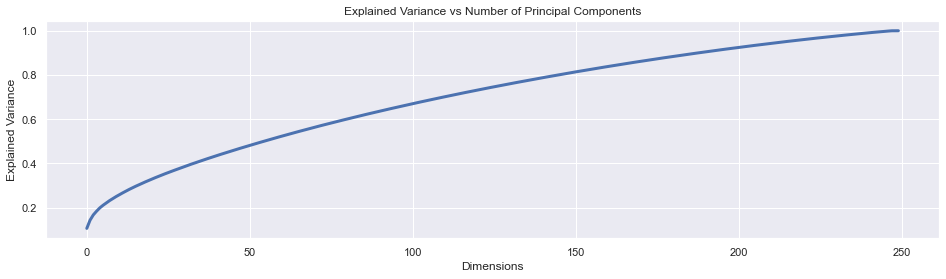

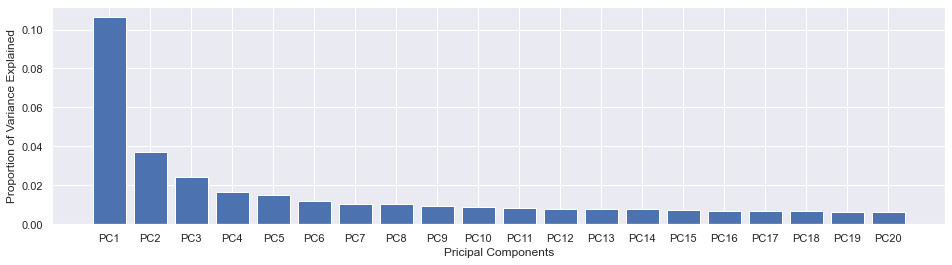

In [ ]:
red, pca = do_pca(X)

Often, to determine the optimal number of components, the helbow heuristic is used. However, here it is hard to point to a elbow in the cumulative explained variance plot. In fact, already after the first three-four components are selected the histogram shows that the increase in the cumulative variance becomes more or less constant. To proceed with the clustering, we make the common choice of 95 percent explained variance, since this already reduces the number of features by almost 15 times and does not miss almost any information.

In [ ]:
pca = PCA(n_components=0.95)
red = pca.fit_transform(X)

In [ ]:
red.shape

(250, 215)

We compute the reconstruction error.

In [ ]:
from sklearn.metrics import mean_squared_error as mse

mse(pca.inverse_transform(red), X)

0.04988596732616943

To get a very rough feeling for what the data looks like, let's plot the data in 3d, using the first 3 PCs as features.

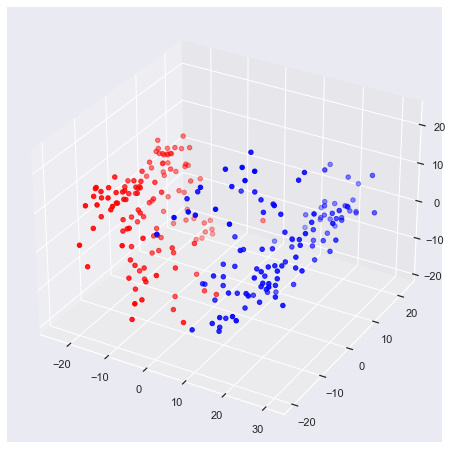

In [ ]:
from mpl_toolkits import mplot3d

fig = plt.figure(figsize = (12, 8))
ax = plt.axes(projection ="3d")

hypo = red[(y == True), :3]
normo = red[(y == False), :3]

ax.scatter3D(hypo[:, 0], hypo[:, 1], hypo[:, 2], color='blue')
ax.scatter3D(normo[:, 0], normo[:, 1], normo[:, 2], color='red')

plt.show()

Already this simple rotation and projection of the coordinate system to 3 dimensions separated the hypoxia and normoxia classes reasonably well. As anticipated, this will be pursued in the Classification section.

Now that the data has been reduced, we can proceed with the clustering. The first approach we will try is KMeans clustering. This method is equivalent to applying coordinate descent to minimize the inertia, that is, the sum of the squared distances of the points from their cluster's centroid. As such, it only is capable of finding a local optimum, therefore often many initializations of the centroids are needed to obtain good results.

The loss function KMeans finds a local minimum of is an upper bound to an expression strictly related to intra cluster similarity: KMeans finds clusters that are 'ball-like', with convex shapes. To select the optimal number of clusters, we will combine two apporaches. First, we will plot the inertia as a function of the number of clusters, and see whether a elbow is detectable. Second, we will use the so called silhouette scores, which measure for each number of clusters how similar points within the same cluster are compared to points in different clusters.

In [ ]:
from sklearn.cluster import KMeans

kmeans_per_k = [KMeans(n_clusters=k, n_init=100, random_state=42).fit(red) for k in range(1, 21)]

In [ ]:
inertias = [model.inertia_ for model in kmeans_per_k]

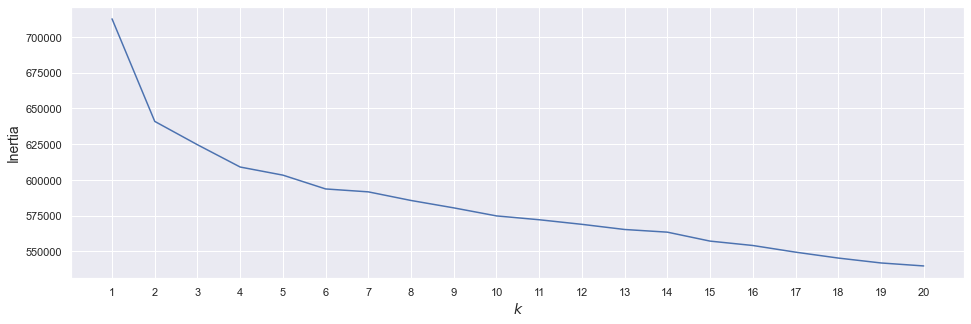

In [ ]:
plt.figure(figsize=(16, 5))
plt.plot(range(1, 21), inertias)
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Inertia", fontsize=14)
plt.xticks(np.arange(1, 21))
plt.show()

Both $k = 2$ and $k = 4$ seem promising. Let's now try with silhouette scores.

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_scores = [silhouette_score(X, model.labels_) for model in kmeans_per_k[1:]]

The following plots the silhouette scores against the number of clusters. The silhouette score of a clustering is the mean silhouette coefficient over all the data points. If $a$ is the mean intra-cluster distance for a data point, and $b$ the mean nearest-cluster distance, then the silhouette coefficient of that datapoint is defined as $\frac{b - a}{max(a, b)}$.

This coefficient varies in the range $[-1, 1]$: a coefficient close to 1 indicates that the data point is well inside its own cluster, and far away from the other clusters. A coefficient around 0 means that the data point lies in the proximity of the boundary between its cluster and the closest one to it. Finally, a coefficient close to -1 indicates that the data point has probably been assigned to the wrong cluster.

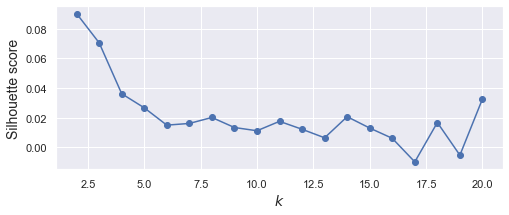

In [ ]:
plt.figure(figsize=(8, 3))
plt.plot(np.arange(2, 21), silhouette_scores, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Silhouette score", fontsize=14)
plt.show()

The following, instead, gives a more accurate depiction of the silhouette coefficients. It is called silhouette diagram. The 'chunks' each represent a cluster, with horizontal colored lines representing the silhouette coefficient of the data points in the cluster. The red line indicated the average silhouette score.

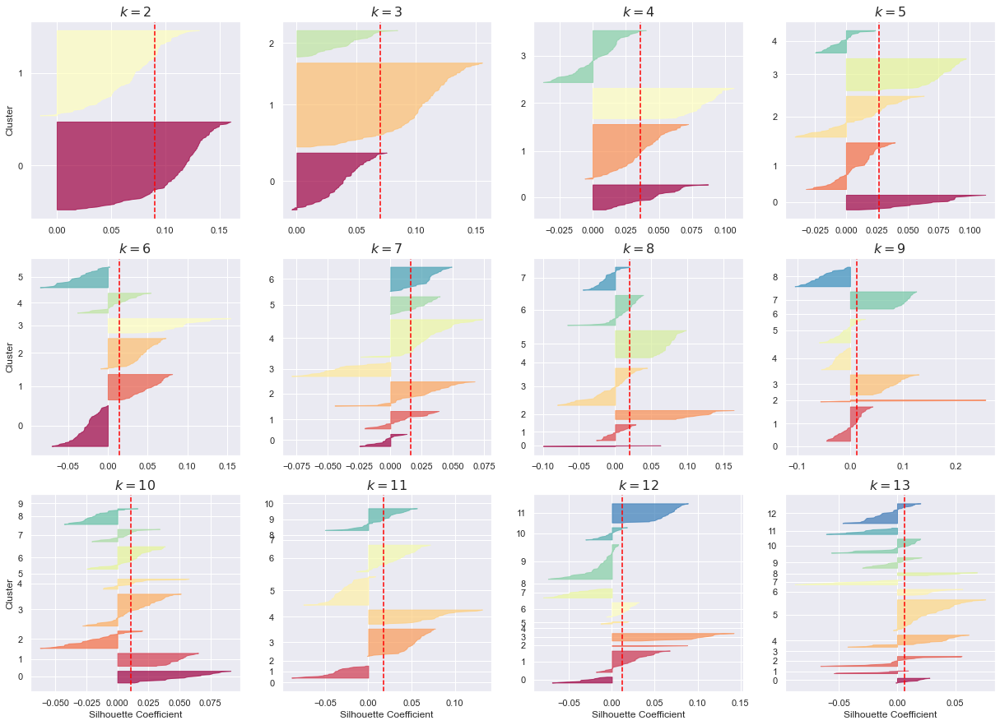

In [ ]:
import matplotlib as mpl
from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter

plt.figure(figsize=(21, 15))

for k in np.arange(2, 14):
    plt.subplot(3, 4, k - 1)
    
    y_pred = kmeans_per_k[k - 1].labels_
    silhouette_coefficients = silhouette_samples(X, y_pred)

    padding = len(X) // 30
    pos = padding
    ticks = []
    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()

        color = mpl.cm.Spectral(i / k)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))
    if k in (2, 6, 10):
        plt.ylabel("Cluster")
    
    if k in (10, 11, 12, 13):
        plt.xlabel("Silhouette Coefficient")
    
    plt.axvline(x=silhouette_scores[k - 2], color="red", linestyle="--")
    plt.title("$k={}$".format(k), fontsize=16)

plt.show()

From the observation of the silhouette diagram, the most promising values of $k$ seem to be 2 and 3. In fact, for both of them all the clusters cross the average red line, and none of the clusters has negative coefficient values. For $k = 4$, which looked like a elbow in the inertia plot, the first cluster has some small silhouette coefficients, with half of them negative, which is not encouraging. For $k > 4$, the situation is even worse. This could be because the data does not contain more than 2/3 well defined clusters, or it could also be that there are more clusters but KMeans, which is only well suited for convex-shaped clusters, cannot find them. To check this, later we will perform clustering with an agglomerative method, that is capable of finding potential non-convex-shaped clusters.

Let's now try to visualize the kmeans clustering for $k = 2, 3, 4$, since these are the values that seemed most appropriate judjging from our heuristic analysis. The following function uses tSNE, a nonlinear dimensionality reduction technique, to reduce the dimensionality of the data to 2. tSNE constructs a probability distribution over pairs of high dimensional points in such a way that similar points are assigned a higher probability than distant points. Then, it tries to minimize the Kullback-Leibler divergence between this distribution and a yet to be found distribution built in a similar way in the lower dimensional space. The resulting optimization problem is non-covex. While the algorithm tends to preserve the local structure of the data, meaning that similar points remain close to each other in the low-dimensional space, the global structure is highly dependent on the hyperparameters and not robust. Also, since tSNE performs a nonlinear trnasformation of the data, it is hard to interpret what the axes represent. To speed up computations and reduce noise, we feed to tSNE the data reduced with PCA.

In [ ]:
from sklearn.manifold import TSNE
from collections import Counter

def plot_clusters(df, labels, init='random', lrs=[10, 50, 200], perps=[1, 5, 15, 25, 35], big=False, legend=None, alpha=0.7):
    clors = ['black', 'blue', 'red', 'grey', 'yellow', 'orange', 'green', 'fuchsia', 'cyan', 'brown']
    m = len(lrs)
    n = len(perps)
    n_clusters = len(set(labels))
    if legend is None:
        legend = [str(z) for z in range(n_clusters)]
    
    if big:
        figsize = (7, 7)
    else:
        figsize = (3*len(perps), 2*len(lrs))
    fig, ax = plt.subplots(nrows=m, ncols=n, figsize=figsize)
    for i in range(m):
        for j in range(n):
            tsne = TSNE(n_components=2, init=init, learning_rate=lrs[i], perplexity=perps[j], random_state=42)
            df_tsne = tsne.fit_transform(df)
            clusters = [df_tsne[labels == i] for i in range(n_clusters)]
            if m == 1 and n == 1:
                for z in range(n_clusters):
                    ax.scatter(clusters[z][:, 0], clusters[z][:, 1], alpha=alpha, label=legend[z], c=clors[z])
                continue
            elif m == 1:
                ind = j
            elif n == 1:
                ind = i
            else:
                ind = (i, j)
            for z in range(n_clusters):
                ax[ind].scatter(clusters[z][:, 0], clusters[z][:, 1], alpha=alpha, label=legend[z], c=clors[z])
    plt.legend(loc=(1.04, 0))
    print("Size of clusters: ", [ x[1] for x in Counter(labels).most_common()])

In [ ]:
kmeans_cells = {}
kmeans_cells_labels = {}
kmeans_cells[2] = KMeans(n_clusters=2, n_init=300, max_iter=500)
kmeans_cells_labels[2] = kmeans_cells[2].fit_predict(red)

Size of clusters:  [127, 123]


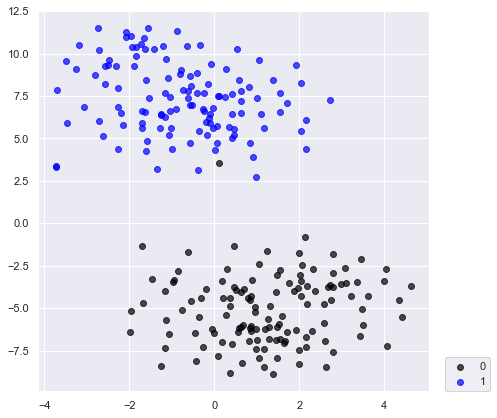

In [ ]:
plot_clusters(red, kmeans_cells_labels[2], lrs=[10], perps=[20], big=True)

The two clusters seem to be very well separated, with only one point from cluster 0 being projected inside cluster 1. To interpret what the clusters represent, we make a similar plot, but using hypoxia/normoxia condition as labels. Since a seed has been set for tSNE, the appearence of the projected data will be the same, and a comparison can be made. Note: for some reason, the colors are switched.

Size of clusters:  [126, 124]


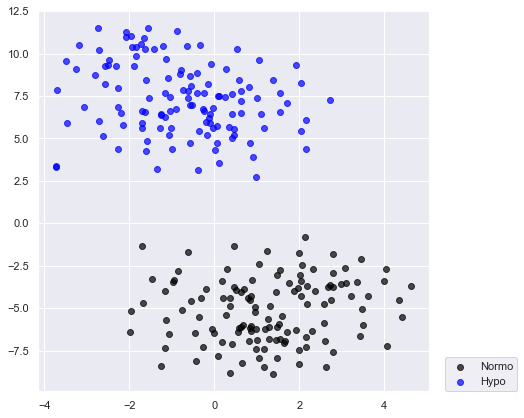

In [ ]:
plot_clusters(red, y, lrs=[10], perps=[20], big=True, legend=['Normo', 'Hypo'])

Visually, we see that the two clusters that have been found coincide almost perfectly with hypoxic and normoxic cells. This result is encouraging, especially in view of the classification task.

In [ ]:
y[kmeans_cells_labels[2] == 0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False])

In [ ]:
y[kmeans_cells_labels[2] == 1]

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True])

Only one cell is misplaced, as the graph suggested. Now, we plot the results of the kmeans clustering for $k = 3, 4$.

In [ ]:
kmeans_cells[3] = KMeans(n_clusters=3, n_init=300, max_iter=500)
kmeans_cells_labels[3] = kmeans_cells[3].fit_predict(red)

Size of clusters:  [123, 85, 42]


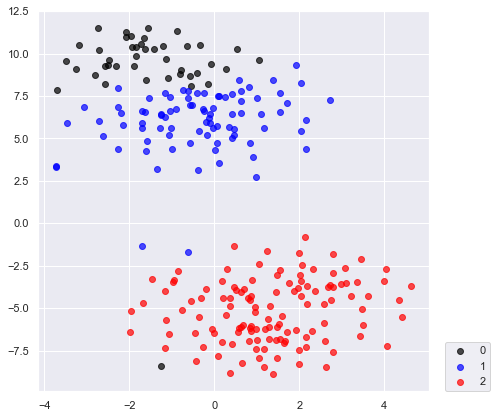

In [ ]:
plot_clusters(red, kmeans_cells_labels[3], lrs=[10], perps=[20], big=True)

In [ ]:
kmeans_cells[4] = KMeans(n_clusters=4, n_init=300, max_iter=500)
kmeans_cells_labels[4] = kmeans_cells[4].fit_predict(red)

Size of clusters:  [83, 77, 50, 40]


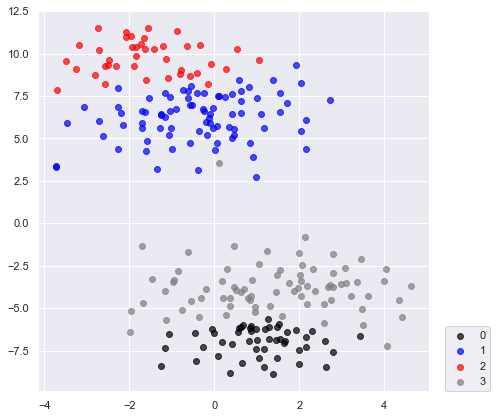

In [ ]:
plot_clusters(red, kmeans_cells_labels[4], lrs=[10], perps=[20], big=True)

Increasing the number of clusters has subdivided further the Hypoxia and Normoxia clusters in two subclusters each. Furthermore, from the progression of the graphs as $k = 2, 3, 4$, we see that the same choices that are made for smaller $k$ seem to be confirmed with a bigger $k$: the clustering seems to be robust, which might indicate that it's a good clustering. With $k = 5, 6$, which were discouraged by the silhouette diagrams, the clustering is not as clean, as the following plot shows.

In [ ]:
kmeans_cells[5] = KMeans(n_clusters=5, n_init=300, max_iter=500)
kmeans_cells_labels[5] = kmeans_cells[5].fit_predict(red)

Size of clusters:  [80, 52, 47, 42, 29]


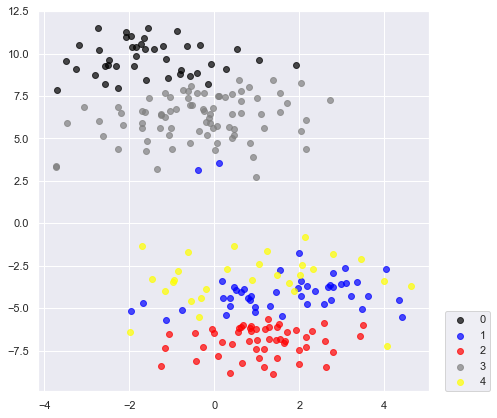

In [ ]:
plot_clusters(red, kmeans_cells_labels[5], lrs=[10], perps=[20], big=True)

To have an idea of what the hypoxia and normoxia subclusters could represent, we now plot a heatmap showing the most expressed genes in each of the clusters. The order of the indeces is permuted to have the two hypoxia subclusters and the two normoxia subclusters side by side.

In [ ]:
clusters = {}

for i in [0, 3, 1, 2]:
    clusters[i] = df[kmeans_cells_labels[4] == i]

In [ ]:
mean_gene_expressions = np.array([clusters[i].mean() for i in range(4)])

In [ ]:
mean_gene_expressions = pd.DataFrame(mean_gene_expressions, index=[0, 3, 1, 2], columns=df.columns)

In [ ]:
mean_gene_expressions.shape

(4, 3000)

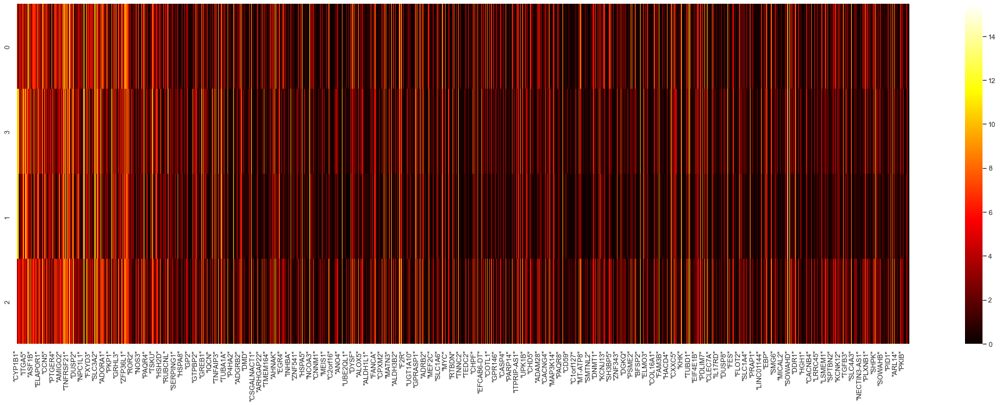

In [ ]:
fig = plt.figure(figsize=(32, 10))
ax = sns.heatmap(mean_gene_expressions, vmin=0, cmap='hot')
plt.show()

The first two rows represent the two Normoxia subclusters, while the last two represent the two Hypoxia subclusters. The colormap shows the mean expression of each gene in the various clusters. In this form, admittedly, it is hard to see any patterns. For this reason, later in the report, we plot a similar graph but sorting the genes in such a way that similar genes are close to each other. This will be done using the results of hierarchical clustering, since the full tree structure it provides is well suited for ordering the genes according to their similarity.

To get a more informative heatmap without resorting to the gene cluster, we can leave out the genes that are not very expressed in any of the clusters:

In [ ]:
threshold = 10

msk = ((mean_gene_expressions.iloc[0] > threshold) | (mean_gene_expressions.iloc[1] > threshold) | 
       (mean_gene_expressions.iloc[2] > threshold) | (mean_gene_expressions.iloc[3] > threshold))
mean_gene_expressions_small = pd.DataFrame(mean_gene_expressions.loc[:, msk], index=[0, 3, 1, 2], columns=df.columns[msk])

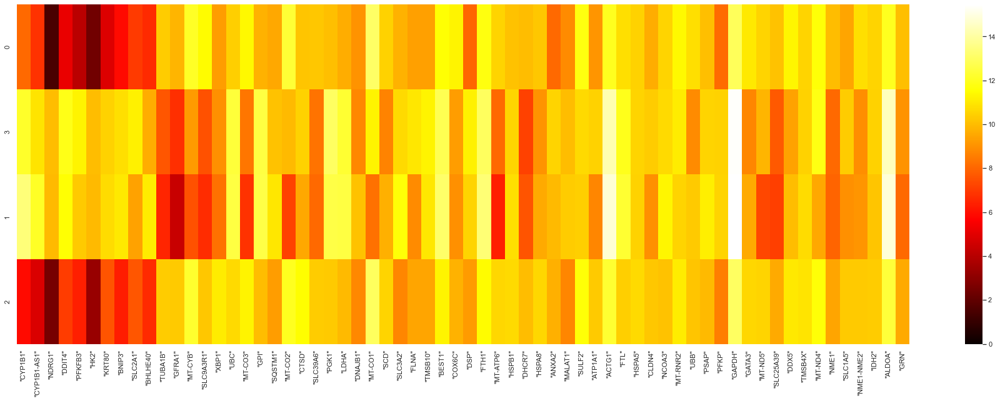

In [ ]:
fig = plt.figure(figsize=(32, 10))
ax = sns.heatmap(mean_gene_expressions_small, vmin=0, cmap='hot')
plt.show()

Now, we perform Sparse PCA on each of the four clusters, and we plot in a heatmap the genes that appear in the first PCs of each cluster's decomposition. Sparse PCA solves the same optimization problem that PCA solves to maximize variance, but adding a constraint that the $l_0$ norm of the direction should be bounded by some $k$. This way, the PCs are sparse, and hence more easily interpretable. The sklearn implementation solves an optimization problem regularized with Lasso penalty, whose parameter can be tweaked tom regulate the level of sparsity. We choose it so that the representation as a heatmap is viable. Since our purpose here is to visualize the differences in gene expression among clusters, SparsePCA seems more appropriate than vanilla PCA. Since the running time of Sparse PCA is very long, we use a faster but less accurate version of it called Minibatch Sparse PCA.

In [ ]:
from sklearn.decomposition import MiniBatchSparsePCA, SparsePCA

pcas = {}
for i in [0, 3, 1, 2]:
    pcas[i] = MiniBatchSparsePCA(n_components=10, alpha=6)
    pcas[i].fit(clusters[i])

In [ ]:
(pcas[0].components_ == 0).sum(axis=1)

array([2999, 2998, 2997, 2981, 2996, 2825, 2997, 2929, 2984, 2983])

In [ ]:
mean_components = np.array([pcas[i].components_.mean(axis=0) for i in range(4)])

In [ ]:
mean_components = pd.DataFrame(mean_components, index=[0, 3, 1, 2], columns=df.columns)

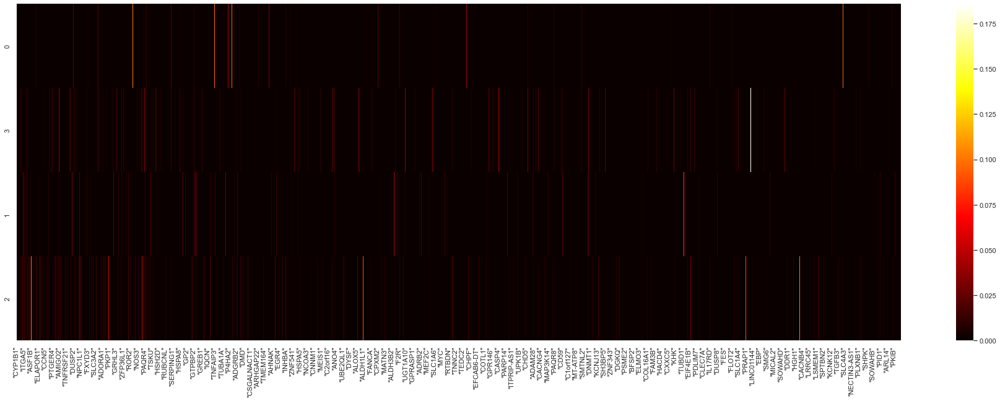

In [ ]:
fig = plt.figure(figsize=(32, 10))
ax = sns.heatmap(mean_components, vmin=0, cmap='hot')
plt.show()

In [ ]:
threshold = 0.025

msk = ((mean_components.iloc[0] > threshold) | (mean_components.iloc[1] > threshold) | (mean_components.iloc[2] > threshold) | (mean_components.iloc[3] > threshold))
mean_components_small = pd.DataFrame(mean_components.loc[:, msk], index=[0, 3, 1, 2], columns=df.columns[msk])

In [ ]:
mean_components_small

,"""CYP1A1""","""DDIT4""","""IGFBP3""","""ITGA5""","""FOS""","""LOXL2""","""HSPA6""","""TIMP3""","""JAG1""","""ELAPOR1""",...,"""NFKBIZ""","""LAMA3""","""ARMC6""","""TGFBR2""","""EPHB3""","""RAI2""","""ARHGEF10L""","""ABCB6""","""NPHP4""","""SNED1"""
0,0.000000,0.025021,0.000000,0.000000,0.000000,0.000000,0.000000,-0.011620,0.000000,-0.013546,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.095892
3,0.047884,0.000000,0.092827,0.000000,0.019004,0.031651,0.000000,0.027480,0.032104,0.000000,...,0.070448,0.025218,0.000000,0.012726,-0.002717,0.185917,0.001567,0.030903,0.0,0.000000
1,-0.040400,0.000000,0.005671,0.025958,0.027913,-0.003784,-0.014967,-0.032599,0.003088,0.069419,...,0.000000,-0.007473,0.079805,-0.024761,0.000000,0.000000,0.031944,-0.009102,0.0,0.000000
2,0.000000,-0.004765,0.000000,0.003712,0.000000,0.010442,0.098607,0.000000,0.000000,0.008570,...,0.000000,0.000000,0.000000,0.025726,0.087324,0.000000,0.000000,0.000000,0.1,0.001611


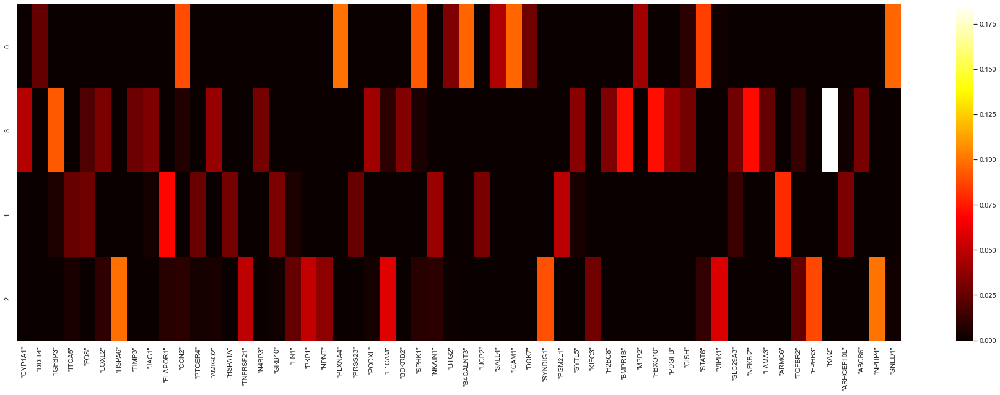

In [ ]:
fig = plt.figure(figsize=(32, 10))
ax = sns.heatmap(mean_components_small, vmin=0, cmap='hot')
plt.show()

This plots visualizes the averages of the first 10 sparse PCs for the four clusters. Therefore, it can be understood as representing the directions along which the data vary the most in the various clusters. Having used Sparse PCA instead of vanilla PCA, we automatically selected components that explain much variance but have few nonzero values. This way, we avoided having to, for visualization purposes, artificially filter out too many of the coordinates of the components. This heatmap, together with the one representing the most frequent genes, provides an overview of the characteristics of each cluster, showing which genes are highly expressed and which genes vary a lot in each of them.

### Genes

Now we repeat the procedure, but this time we cluster genes instead of cells.

In [ ]:
df = df.T
df.shape

(3000, 250)

In [ ]:
from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
X_T = sc.fit_transform(df)

In [ ]:
X_T.mean(axis=0)[:10]

array([-1.85118587e-15, -2.14680126e-15, -2.23968992e-15,  7.86704035e-16,
       -2.67571150e-15, -2.30548913e-15,  3.12320540e-15, -1.84367336e-15,
       -1.20999507e-15,  8.10351786e-16])

In [ ]:
X_T.std(axis=0)[:10]

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

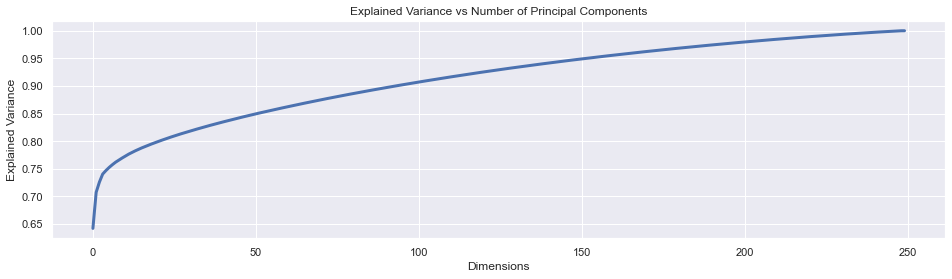

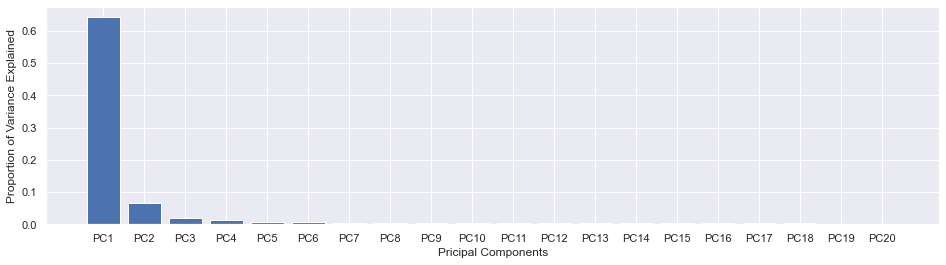

In [ ]:
redd, pca = do_pca(X_T)

Unlike in the case of cells, here most of the variance is explained by the first few PCs. There is a clear elbow in the graph around 5 components.

In [ ]:
pca = PCA(n_components=5)
red_T = pca.fit_transform(X_T)

In [ ]:
red_T.shape

(3000, 5)

We compute the reconstruction error.

In [ ]:
from sklearn.metrics import mean_squared_error as mse

mse(pca.inverse_transform(red_T), X_T)

0.25308050673183663

To get a very rough feeling for what the data looks like, let's plot the data in 3d, using the first 3 PCs as features.

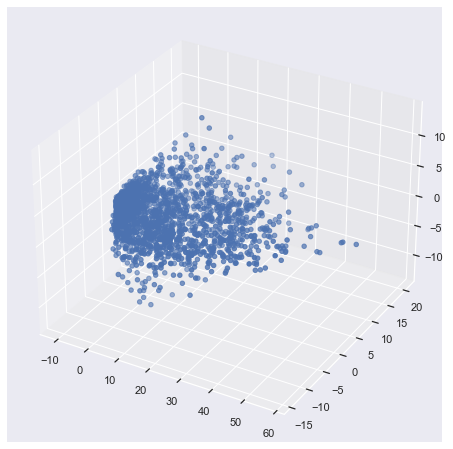

In [ ]:
from mpl_toolkits import mplot3d

fig = plt.figure(figsize = (12, 8))
ax = plt.axes(projection ="3d")

ax.scatter3D(red_T[:, 0], red_T[:, 1], red_T[:, 2])

plt.show()

We use KMeans to cluster the genes.

In [ ]:
from sklearn.cluster import KMeans

kmeans_per_k = [KMeans(n_clusters=k, n_init=100, random_state=42).fit(red_T) for k in range(1, 21)]

In [ ]:
inertias = [model.inertia_ for model in kmeans_per_k]

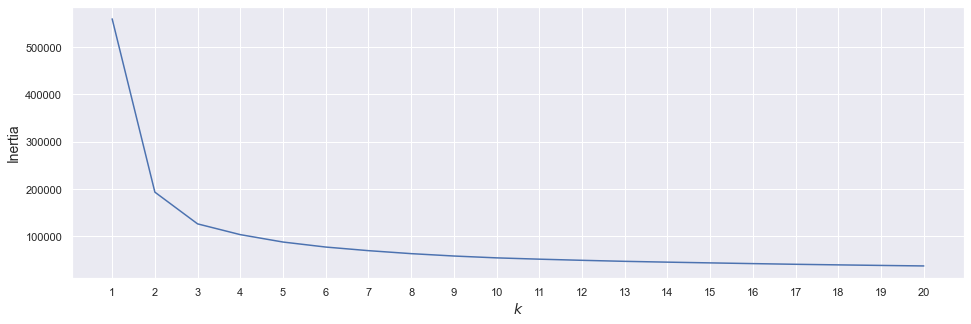

In [ ]:
plt.figure(figsize=(16, 5))
plt.plot(range(1, 21), inertias)
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Inertia", fontsize=14)
plt.xticks(np.arange(1, 21))
plt.show()

$k = 2$ and $k = 3$ seem the most promising, there seems to ba a elbow for $k = 3$. Let's now try with silhouette scores.

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_scores = [silhouette_score(X_T, model.labels_) for model in kmeans_per_k[1:]]

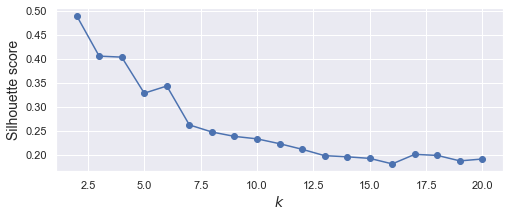

In [ ]:
plt.figure(figsize=(8, 3))
plt.plot(np.arange(2, 21), silhouette_scores, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Silhouette score", fontsize=14)
plt.show()

$k = 2, 3, 4$ are the best from this prespective. We now plot the silhouette diagrams for a more complete view.

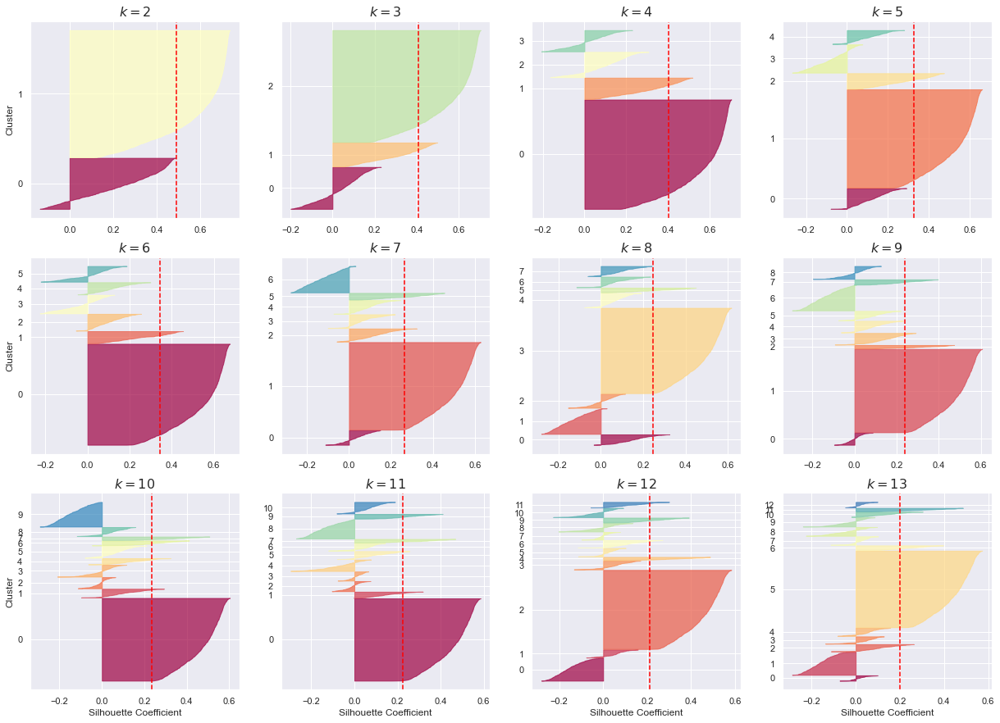

In [ ]:
import matplotlib as mpl
from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter

plt.figure(figsize=(21, 15))

for k in np.arange(2, 14):
    plt.subplot(3, 4, k - 1)
    
    y_pred = kmeans_per_k[k - 1].labels_
    silhouette_coefficients = silhouette_samples(X_T, y_pred)

    padding = len(X) // 30
    pos = padding
    ticks = []
    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()

        color = mpl.cm.Spectral(i / k)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))
    if k in (2, 6, 10):
        plt.ylabel("Cluster")
    
    if k in (10, 11, 12, 13):
        plt.xlabel("Silhouette Coefficient")
    
    plt.axvline(x=silhouette_scores[k - 2], color="red", linestyle="--")
    plt.title("$k={}$".format(k), fontsize=16)

plt.show()

$k = 2$ seems the cleanest. Also, we notice that for all values of $k$ there is much bigger cluster tha the rest, with very high silhouette coefficients. It's possible that that big cluster is the same more or less for all values of $k$, indicating that it is very well separated from the others. It could be a cluster of sparse genes, since we know from EDA they are so abundant. To find out more, let's visualize the clusters for a few choices of $k$.

In [ ]:
kmeans_genes = {}
kmeans_genes_labels = {}

In [ ]:
kmeans_genes[2] = KMeans(n_clusters=2, n_init=300, max_iter=500)
kmeans_genes_labels[2] = kmeans_genes[2].fit_predict(red)

Size of clusters:  [2141, 859]


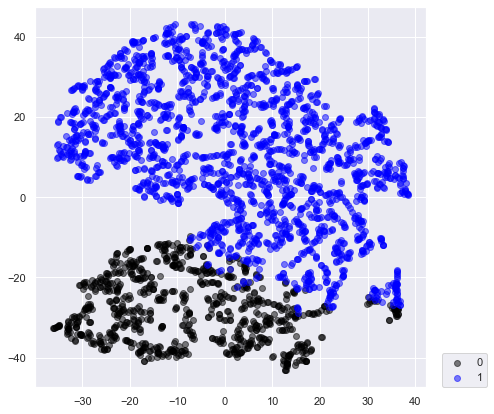

In [ ]:
plot_clusters(red_T, kmeans_genes_labels[2], lrs=[10], perps=[20], big=True, alpha=0.5)

In [ ]:
kmeans_genes[3] = KMeans(n_clusters=3, n_init=300, max_iter=500)
kmeans_genes_labels[3] = kmeans_genes[3].fit_predict(red)

Size of clusters:  [1889, 715, 396]


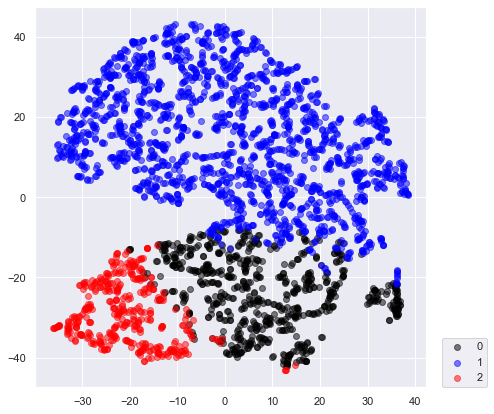

In [ ]:
plot_clusters(red_T, kmeans_genes_labels[3], lrs=[10], perps=[20], big=True, alpha=0.5)

In [ ]:
kmeans_genes[6] = KMeans(n_clusters=6, n_init=300, max_iter=500)
kmeans_genes_labels[6] = kmeans_genes[6].fit_predict(red)

Size of clusters:  [1717, 317, 286, 266, 208, 206]


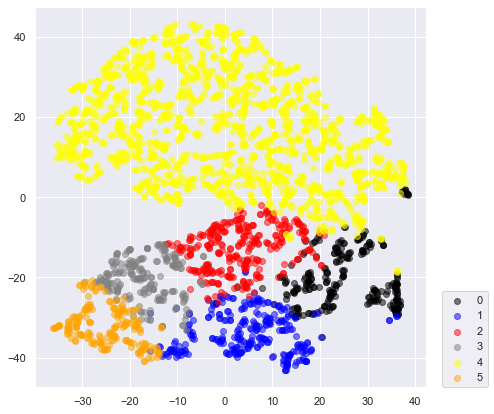

In [ ]:
plot_clusters(red_T, kmeans_genes_labels[6], lrs=[10], perps=[20], big=True, alpha=0.5)

In [ ]:
kmeans_genes[10] = KMeans(n_clusters=10, n_init=300, max_iter=500)
kmeans_genes_labels[10] = kmeans_genes[10].fit_predict(red)

Size of clusters:  [1422, 425, 203, 201, 198, 153, 152, 102, 82, 62]


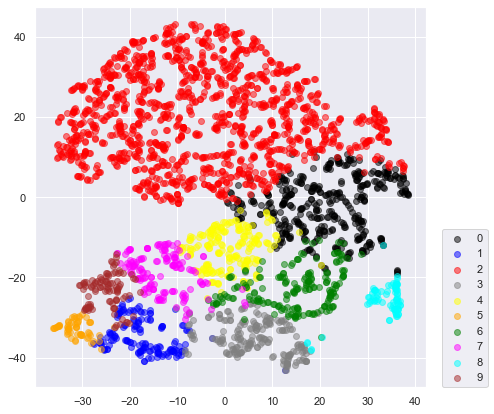

In [ ]:
plot_clusters(red_T, kmeans_genes_labels[10], lrs=[10], perps=[20], big=True, alpha=0.5)

To check whether our hypothesis that the big cluster represents sparse genes, we plot the sparsity level of the genes in the big clusters for different values of $k$. We find out that, indeed, the clustering is consistently isolating the sparse genes across the different values of $k$. As for the smaller clusters, one could consult some database containing information about metabolic pathways to understand what kind of processes the genes in each cluster are involved in, and so what each cluster represents. In our report, we will investigate more the structure of gene clusters, together with that of cell clusters, using agglomerative clustering.

In [ ]:
df.head()

,"""output.STAR.2_B3_Norm_S57_Aligned.sortedByCoord.out.bam""","""output.STAR.2_B4_Norm_S58_Aligned.sortedByCoord.out.bam""","""output.STAR.2_B5_Norm_S59_Aligned.sortedByCoord.out.bam""","""output.STAR.2_B6_Norm_S60_Aligned.sortedByCoord.out.bam""","""output.STAR.2_B7_Hypo_S79_Aligned.sortedByCoord.out.bam""","""output.STAR.2_B9_Hypo_S81_Aligned.sortedByCoord.out.bam""","""output.STAR.2_C10_Hypo_S130_Aligned.sortedByCoord.out.bam""","""output.STAR.2_C11_Hypo_S131_Aligned.sortedByCoord.out.bam""","""output.STAR.2_C1_Norm_S103_Aligned.sortedByCoord.out.bam""","""output.STAR.2_C2_Norm_S104_Aligned.sortedByCoord.out.bam""",...,"""output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam""","""output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam"""
"""CYP1B1""",8.426265,7.044394,8.823367,4.807355,12.506308,11.907642,13.177420,14.394999,9.985842,5.754888,...,12.945992,12.139871,7.330917,8.459432,8.357552,7.622052,8.980140,15.077066,14.289515,12.539644
"""CYP1B1-AS1""",7.139551,5.906891,7.672425,3.000000,11.382624,10.612868,11.916999,13.153869,8.845490,4.523562,...,11.832890,10.991522,6.247928,7.118941,7.033423,6.686501,7.900867,13.743783,12.935902,11.209453
"""CYP1A1""",0.000000,0.000000,0.000000,0.000000,0.000000,6.321928,7.900867,8.794416,0.000000,0.000000,...,6.442943,10.692616,0.000000,0.000000,0.000000,1.000000,0.000000,13.460840,9.139551,9.030667
"""NDRG1""",0.000000,1.000000,0.000000,0.000000,9.355351,10.303781,11.363587,9.079485,0.000000,3.807355,...,8.912889,10.040290,0.000000,0.000000,5.781360,7.930737,5.977280,10.303781,9.854868,10.619303
"""DDIT4""",8.596190,8.179909,0.000000,8.174926,11.279030,11.342630,10.370687,10.997885,5.209453,7.679480,...,11.850578,11.235416,9.645658,1.000000,7.569856,8.060696,8.707359,12.055621,13.636398,11.152285


In [ ]:
df[kmeans_genes_labels[3] == 0].shape

(715, 250)

In [ ]:
sparsity_3 = (df[kmeans_genes_labels[3] == 0] == 0).sum(axis=1) / df.shape[1]

<AxesSubplot:>

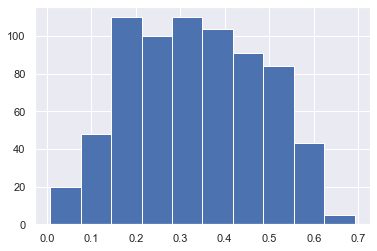

In [ ]:
sparsity_3.hist()

In [ ]:
df[kmeans_genes_labels[6] == 0].shape

(266, 250)

In [ ]:
sparsity_6 = (df[kmeans_genes_labels[6] == 0] == 0).sum(axis=1) / df.shape[1]

<AxesSubplot:>

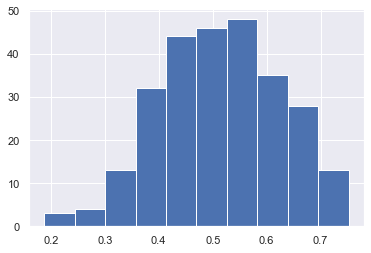

In [ ]:
sparsity_6.hist()

In [ ]:
df[kmeans_genes_labels[10] == 0].shape

(425, 250)

In [ ]:
sparsity_10 = (df[kmeans_genes_labels[10] == 0] == 0).sum(axis=1) / df.shape[1]

<AxesSubplot:>

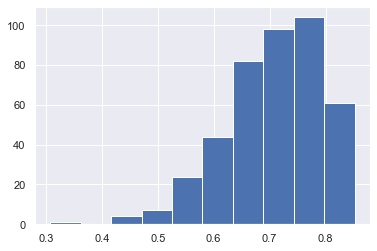

In [ ]:
sparsity_10.hist()

## Agglomerative Clustering

Now we try an agglomerative linkage-based approach to clustering cells, using different linkage criteria including Ward, complete, average and single linkage. Single linkage, in particular, is capable of finding non-convex shaped clusters, which Kmeans has trouble doing. Therefore, an agglomerative linkage based approach to clustering will allow us to check whether we have missed some important patterns in the data clustering with kmeans. Like for KMeans, and for the same reasons, we use the PCA reduced data to perform the clustering.
Since the SmartSeq dataset is not too big, we are going to visualize the results of the clustering using dendograms, and compare the results.

In [ ]:
red.shape

(250, 215)

In [ ]:
from sklearn.cluster import AgglomerativeClustering

linkages = [
    'ward',
    "complete",
    "average",
    "single"
]

from scipy.cluster.hierarchy import dendrogram

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    fig, ax = plt.subplots(figsize=(16, 10))
    # Plot the corresponding dendrogram
    ax = dendrogram(linkage_matrix)

def cluster_hierarchical(dataf, do_plots=True, n_clusters=None):
    for link in linkages:
        ac = AgglomerativeClustering(n_clusters=(None if do_plots else n_clusters), linkage=link, distance_threshold=(0 if do_plots else None))
        ac.fit(dataf)
        if do_plots:
            plot_dendrogram(ac)
            plt.title(link)
            plt.show()

from pandas.core.common import random_state
from sklearn.manifold import TSNE
from collections import Counter




def agglomerative(df, n_clusters, plot_hier=True, plot_tsne=True, lrs=[10,100], perps=[30, 50], big=False):
    ac = AgglomerativeClustering(n_clusters=n_clusters, linkage="ward", distance_threshold=None)
    ac.fit(df)
  
    if plot_hier:
        ach = AgglomerativeClustering(n_clusters=None, linkage="ward", distance_threshold=0)
        ach.fit(df)
        plot_dendrogram(ach)
    if plot_tsne:

        plot_clusters(df, ac.labels_, lrs=lrs, perps=perps, big=big)

        plt.show()
    return ac.labels_

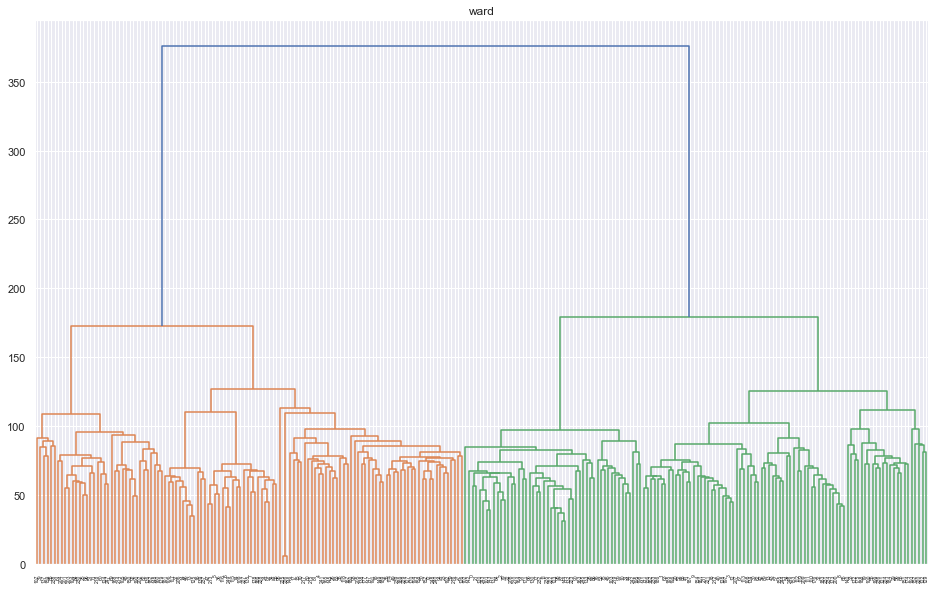

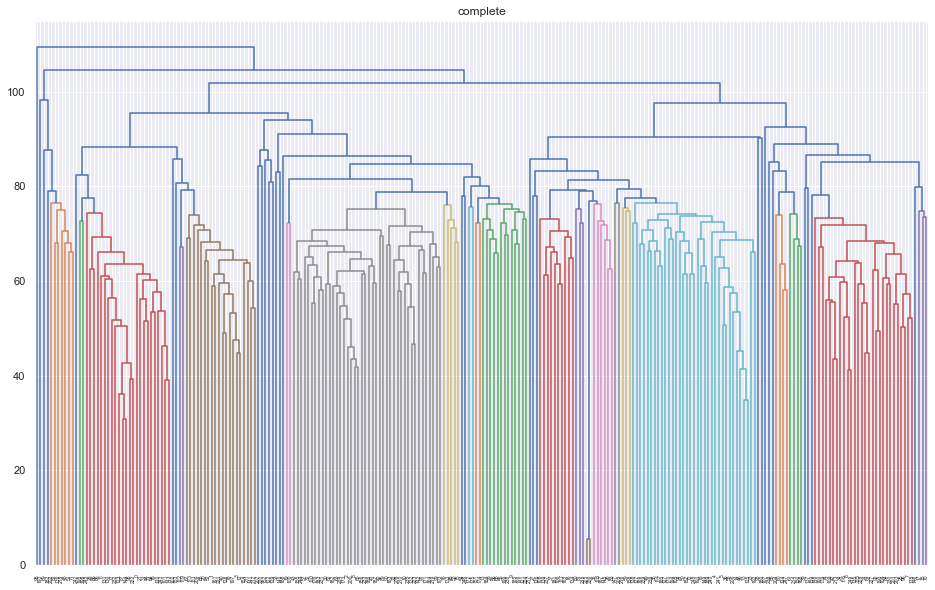

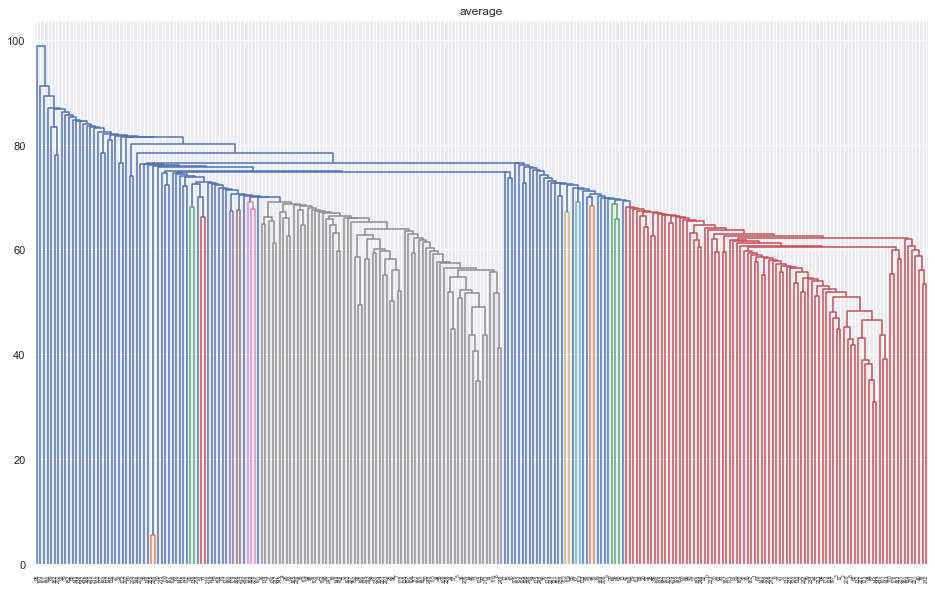

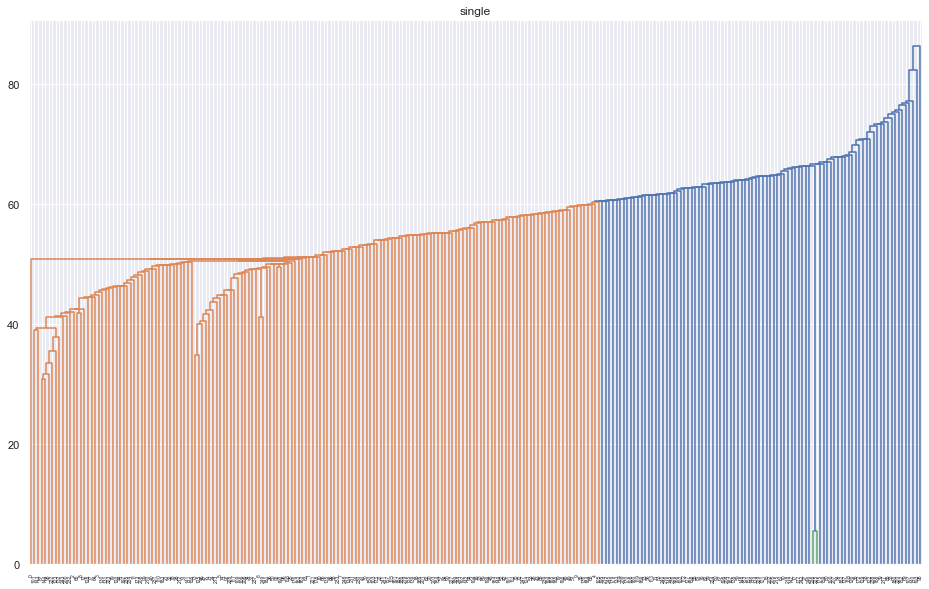

In [ ]:
cluster_hierarchical(red, do_plots=True, n_clusters=None)

The single linkage clustering did not pick up any clusters, but rather it merged the cells together in a single block one at a time. This could be regarded as evidence that the natural clusters in the data do not have non-convex shapes. In support of this conclusion, complete and ward linkage, which both favor clusters with high intra-cluster similarity and convex shapes, seem to have found some clusters, which are visible in the respective dendrograms. Especially those found by Ward seem particularly clean. As for average linkage, like single linkage, its dendrogram fails to show clear clusters.

To make a comparison with the KMeans clusters, we plot the clustering found by Ward's linkage cutting the dendrogram atvarious heights.

Size of clusters:  [130, 120]


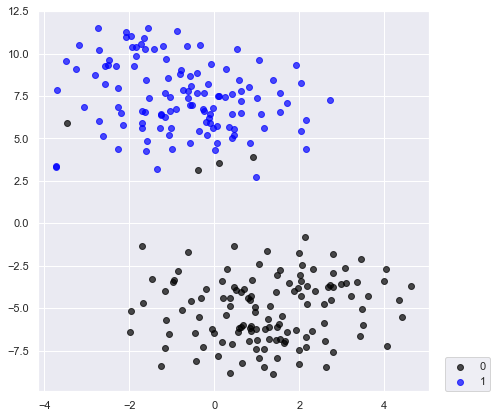

In [ ]:
ward_cells_labels = {}
ward_cells_labels[2] = agglomerative(red, 2, plot_hier=False, plot_tsne=True, lrs=[10], perps=[20], big=True)

Comparing this graph to the kmeans case, this is almost exactly the same clustering. In order to quantify the difference between two clusterings of the same data, we have defined a metric, inspired by the earth mover distance, that counts the minimum number of elements that must change cluster to transform the first clustering into the second. The outputs of the functions are: number of cells that are in different clusters, percentage of such cells, map from the clusters of the first to that of the second clustering.

In [ ]:
from itertools import permutations
import math

def cluster_distance(lab1, lab2):
    n_clust = len(set(lab1))
    indices = [n for n in range(n_clust)]

    min_dist = math.inf
    min_perm = None
    for perm in permutations(indices):
        dist = 0
        for a,b in zip(lab1, lab2):
            if perm[a] != b:
                dist += 1
        if dist < min_dist:
            min_dist = dist
            min_perm = perm

    return min_dist, min_dist/len(lab1), min_perm

In [ ]:
cluster_distance(kmeans_cells_labels[2], ward_cells_labels[2])

(3, 0.012, (0, 1))

The distance is extremely small, as observed: the two methods pretty much agree on the clustering.

Size of clusters:  [84, 80, 50, 36]


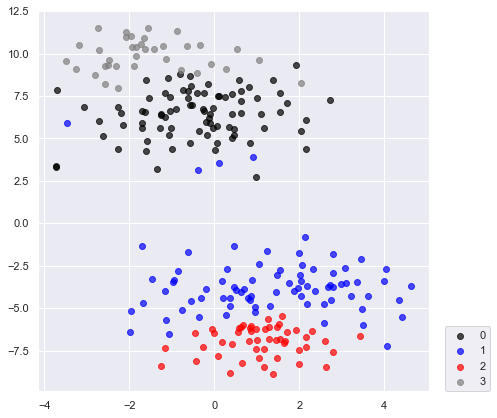

In [ ]:
ward_cells_labels[4] = agglomerative(red, 4, plot_hier=False, plot_tsne=True, lrs=[10], perps=[20], big=True)

In [ ]:
cluster_distance(kmeans_cells_labels[4], ward_cells_labels[4])

(13, 0.052, (2, 0, 3, 1))

Even for $k = 4$, the two clusterings methos seem to agree to a high degree.

___

### Visualization via heatmaps

In order to discover some structure in our data, we will use agglomerative clustering with ward linkage (we showed above that this was the linkage that performed best) to cluster both genes and cells and reorder our dataset so that genes that are clustered together are close together (and the same for cells) in a manner like this:

<div>
<img src="https://upload.wikimedia.org/wikipedia/commons/4/48/Heatmap.png" width="300"/>
</div>


In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
df, y = format_file(mcf_smart)

In [ ]:
cluster_cells = AgglomerativeClustering().fit(df)

The following function implements the reordering of the genes and cells.

In [ ]:
def generate_order(children):
  n_samples = children.shape[0] + 1
  order = []
  def dfs(root):
    if root[0] >= n_samples:
      dfs(children[root[0]-n_samples])
    else:
      order.append(root[0])
    
    if root[1] >= n_samples:
      dfs(children[root[1]-n_samples])
    else:
      order.append(root[1])
  
  dfs(children[-1])
  return order


In [ ]:
order_cells = generate_order(cluster_cells.children_)

In [ ]:
cluster_genes =  AgglomerativeClustering().fit(df.T)

In [ ]:
order_genes =  generate_order(cluster_genes.children_)
len(order_genes)

3000

In [ ]:
ordered_df = df.iloc[order_cells, order_genes]

In [ ]:
visual = ordered_df / np.array(ordered_df.max(axis=0)).reshape(1, -1)
visual # this normalization is convenient for visualization

,"""GAPDH""","""ACTG1""","""ALDOA""","""BEST1""","""FTH1""","""CYP1B1""","""CYP1A1""","""GPI""","""PGK1""","""UBC""",...,"""TUBA1B""","""HSPA8""","""UBB""","""MT-CO1""","""CTSD""","""MT-RNR2""","""MT-ND4""","""SULF2""","""MT-CYB""","""MT-CO2"""
"""output.STAR.3_C5_Norm_S113_Aligned.sortedByCoord.out.bam""",0.046785,0.027048,0.022277,0.041452,0.042628,0.000000,0.000000,0.044750,0.040122,0.033783,...,0.279623,0.242626,0.259852,0.910255,0.012792,0.580721,0.426571,0.174003,1.000000,0.982833
"""output.STAR.2_E4_Norm_S202_Aligned.sortedByCoord.out.bam""",0.062237,0.020522,0.059305,0.077467,0.080782,0.006959,0.000307,0.057428,0.059901,0.053593,...,0.040395,0.088490,0.241796,0.937250,0.127876,0.333062,0.518801,0.143475,0.684321,1.000000
"""output.STAR.3_A1_Norm_S13_Aligned.sortedByCoord.out.bam""",0.085035,0.023390,0.025469,0.062316,0.064755,0.011868,0.000000,0.047134,0.038992,0.105529,...,0.016308,0.122903,0.178992,0.991511,0.080455,0.547079,0.345845,0.422814,0.659832,0.742412
"""output.STAR.2_E6_Norm_S204_Aligned.sortedByCoord.out.bam""",0.153855,0.049137,0.094396,0.042003,0.043298,0.000000,0.000000,0.113068,0.330470,0.073591,...,0.016457,0.059861,0.115246,0.642546,0.024694,0.213915,0.349921,0.116838,0.423344,0.615027
"""output.STAR.2_G3_Norm_S297_Aligned.sortedByCoord.out.bam""",0.176308,0.066128,0.128768,0.055439,0.053855,0.007612,0.000000,0.063279,0.217959,0.101198,...,0.027080,0.171053,0.236772,0.813682,0.144464,0.388487,0.524652,0.113984,0.693885,0.703350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"""output.STAR.3_H8_Hypo_S374_Aligned.sortedByCoord.out.bam""",0.859720,0.353048,0.475975,0.106689,0.108684,0.131919,0.041981,0.753603,0.426876,0.386901,...,0.016008,1.000000,0.147590,0.065894,0.194555,0.137317,0.237773,0.079651,0.016519,0.043125
"""output.STAR.3_B9_Hypo_S87_Aligned.sortedByCoord.out.bam""",0.766196,0.447702,0.463466,0.033623,0.034940,0.005742,0.000000,0.506664,0.417269,0.128992,...,0.005386,0.026605,0.084158,0.106230,0.047186,0.168770,0.255785,0.092796,0.030575,0.062034
"""output.STAR.4_D10_Hypo_S190_Aligned.sortedByCoord.out.bam""",0.854104,0.390139,0.405403,0.181024,0.183633,0.077467,0.000000,0.835085,0.711686,0.102629,...,0.011670,0.020243,0.160936,0.037910,0.029661,0.057665,0.118525,0.115973,0.016012,0.028114
"""output.STAR.3_E11_Hypo_S233_Aligned.sortedByCoord.out.bam""",0.919372,0.493130,0.298230,0.048837,0.049322,0.116155,0.004956,0.262867,0.748079,0.445277,...,0.076152,0.304511,0.168315,0.087230,0.033925,0.102809,0.298383,0.051976,0.046080,0.067756


The image plotted below is quite large and streched vertically in order to show all gene clusters. Additionally every cell is included. A more compact version can be found in the cell following this plot. A big chunk of genes, in the upper half of the heatmap, show very low levels of expression. This is probably the same big sparse cluster of genes we identified using kmeans clustering, as also the size is appropriate.
Please note that not all genes are labeled in order to avoid the y-axis being cluttered with text. 

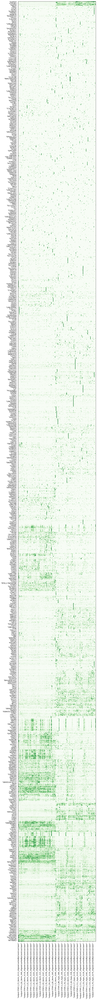

In [ ]:
plt.style.use('default')

fig = plt.figure(figsize=(20, 100))

plt.imshow(visual.iloc[:, :].T, cmap='Greens')
plt.yticks(np.arange(1, 3000, 5), list(visual.columns)[::5])
plt.xticks(np.arange(0, 250, 10), visual.index[::10])
plt.xticks(rotation=90);

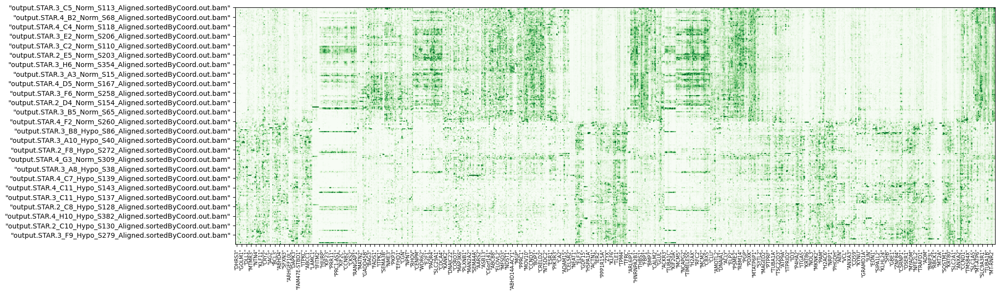

In [ ]:
plt.style.use('default')

fig = plt.figure(figsize=(20, 50))

plt.imshow(visual.iloc[:, 2200:], cmap='Greens')
plt.xticks(np.arange(1, 800, 5), list(visual.columns)[2200::5])
plt.xticks(rotation=90, fontsize=7)
plt.yticks(np.arange(0, 250, 10), visual.index[::10]);

# Classification



## SmartSeq
![picture](https://github.com/sevdari/AI-Lab-Public/blob/main/mindmap6.png?raw=true)

Given that in most datasets we have an abundance of genes and few cells, trying to embrace the whole complexity of our datasets may lead to overfitting. Other issues that may arise from this approach include multicollinearity, longer training times etc. To avoid these issues we want to concentrate the information using various techniques (as shown above) in an attempt to reduce the signal-to-noise ratio. Ideally, we want to feed to our models the most compact representation of our data, while preserving as much information as possible. By doing so, the performance of our models may increase considerably. 

In [ ]:
X_train_full, y_train_full = format_file(mcf_smart)
X_train_full.shape, y_train_full.shape

((250, 3000), (250,))

In [ ]:
# Making sure the data is balanced
np.sum(y_train_full)/y_train_full.shape[0]

0.496

Due to the large number of methods that we will try, it is wise to have a validation set to compare performance across models. 

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_valid, y_train, y_valid = train_test_split(X_train_full, y_train_full,
                                                      test_size=0.1)
X_train.shape, y_train.shape, X_valid.shape, y_valid.shape # sanity check

((225, 3000), (225,), (25, 3000), (25,))

**Choosing the loss:** \\
Choosing the right loss is quite important, as it will be the metric upon which we will base most of our decisions. Choosing accuracy as a loss is a bit naive, as it does not take into account the confidence levels reported by the models. Ideally, we would want models that predict well with a high degree of confidence in their predictions. This is encapsulated by the negative log loss defined as: 

$\mathcal{L}(y, p) = -(y \log(p) + (1-y) \log(1-p))$

for a single prediction.


### Feature Importance with Random Forests
In this section, we employ Random Forests' Built-in "Feature Importance" method for the purpose of feature selection. This method uses the mean gini impurity reduction that arises due to the use of each feature across all decision trees. The greater the mean reduction in gini impurity, the more relevant is the feature said to be. This is a reasonable heuristic to use, as we are choosing the features which reduce the uncertainity of the classification the most. However, as most things in ML, it is susceptible to some pitfalls such as:


*   It has a preference for numerical features over categorical ones.
*   If two or more features are highly correlated, it may fail to highlight the importance of one of them. 

Due to the nature of the datasets, we can ignore the first issue. The second issue, while still being very important, may also be neglected if our sole goal is to make accurate predictions. If two genes are highly correlated one of them will include a lot information regarding the second one. However, if we want to identify the genes responsible for a certain condition, this issue should be taken into consideration. 






---


In the next cell, we define an Extra Trees classifier with 10000 decision trees. By default the number of features considered for each split is $\sqrt{n}$ where $n$ is the total number of features. Additionally, we introduce further stochasticity by sampling the data points used. This is set manually below. This type of stochasticity is important, given the greedy approach of Decision Trees. 


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
et_clf = ExtraTreesClassifier(n_estimators=10000, n_jobs=-1, bootstrap=True, 
                               max_samples=0.8)
et_clf.fit(X_train, y_train)

ExtraTreesClassifier(bootstrap=True, max_samples=0.8, n_estimators=10000,
                     n_jobs=-1)

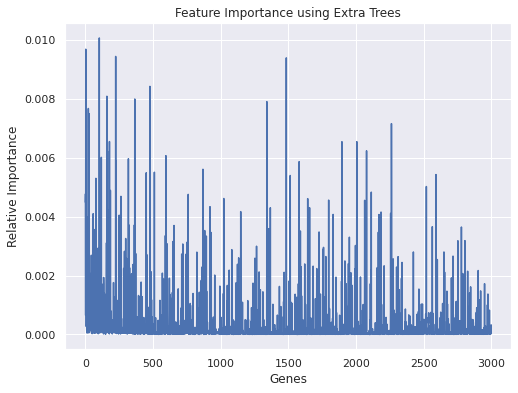

In [ ]:
# Plotting the results of Feature Importance
fig = plt.figure(figsize=(8, 6))
plt.plot(et_clf.feature_importances_)
plt.ylabel('Relative Importance')
plt.xlabel('Genes')
plt.title('Feature Importance using Extra Trees');

In [ ]:
# Sorting genes by importance
x = et_clf.feature_importances_

dct = {i:x[i] for i in range(len(x))}
sorted_values = sorted(dct.items(), key=lambda x: x[1], reverse=True)

important_genes = [X_train.columns[t[0]] for t in sorted_values]
print('Top 5 genes:', important_genes[:5])

# Sanity check
top_gene = important_genes[0]
ind = list(X_train.columns).index(top_gene)
dct[ind] # check this value with the graph above

Top 5 genes: ['"MT-CYB"', '"NDRG1"', '"PGK1"', '"GAPDH"', '"FAM162A"']


0.010084003877023413

#### Building Classifiers
In this subsection, our aim is to build a number of binary classifiers that are able to distinguish between cells in hypoxia and normoxia. By constructing an ensemble of classifiers the overall error might be reduced, especially if the predictions of the classifers are not intercorrelated. Since the training process for each of the classifiers is different, the predictions may not be correlated. \\
Independence of predictions may be further enhanced by feeding a different subset of the data to each classifier. This step does not seem reasonable in our particular case, as it would result in a major loss in information due to the small size of the dataset. 

In [ ]:
# for ensembling purposes we create the following dictionaries
best_estimators = {}
features_chosen = {}

<h4> Method for Choosing Best Classifiers </h4>

Method for choosing the Best Classifier for each model: 

![picture](https://raw.githubusercontent.com/sevdari/AI-Lab-Public/main/Method%20for%20Choosing%20Classifiers.png)

The functions below implement the diagram above. The first two functions are functions that are called internally by the main function which is called:

```
choose_best_clf()
```

You can skip the cell below without any major loss in information. It is concernced with technical details.


In [ ]:
#@title
from sklearn.model_selection import RandomizedSearchCV
import math

def _plot_scores(scores, n_total, model_name, xlabel="Features"):
  """ 
  Plots the accuracy scores of different estimators.
  This method is intended to be called from choose_best_clf.
  """
  fig = plt.figure(figsize=(10, 6))
  sns.lineplot(x=np.arange(5, n_total, 5), y=scores)
  plt.xticks(np.arange(5, n_total, 10))
  plt.xlabel(xlabel)
  plt.ylabel('Neg Loss of Best Estimator')
  plt.title(f'Choosing the Best Estimator for {model_name}');


def _custom_cv(X_train_cv, y_train, estimator, params, cv, n_iter, verbose=0):
  """
  Runs Cross Validation with the given parameters and 
  returns the best estimator.
  This method is intended to be called from choose_best_clf.
  """
  clf = RandomizedSearchCV(estimator, params, cv=cv, 
                      scoring="neg_log_loss", verbose=0, 
                      n_iter=n_iter)
  clf.fit(X_train_cv, y_train)

  if verbose != 0:
    print(f'Features: {X_train_cv.shape[1]},',
            f'Best params: {clf.best_params_},',
            f'best score: {round(clf.best_score_, 4)}')
  
  return clf


def choose_best_clf(estimator, params, cv=5, verbose=0,
                           model_name = 'Model Name', n_total = 100,
                           n_iter=None, xlabel='Features'):
  
  """
  Selects the best classifier and the optimal number of features.
  """

  if n_iter is None:
    n_iter = np.prod(list(map(len, params.values())))
    print('Falling back to GridSearch. Number of iterations', n_iter)

  best_clf, best_params, best_score = None, None, -math.inf
  scores = []

  for n_features in range(5, n_total, 5):

    # Choose the appropiate data subset
    X_train_cv = X_train.loc[:, important_genes[:n_features]]
    assert X_train_cv.shape[0] == y_train.shape[0], 'Dimensions should match'
    assert X_train_cv.shape[1] == n_features, f'X should have {n_features} columns'

    # Fitting
    clf = _custom_cv(X_train_cv, y_train, estimator, params, cv,
                     n_iter)
    scores.append(clf.best_score_)

    # Storing
    if clf.best_score_ > best_score:
      best_clf, best_score = clf.best_estimator_, clf.best_score_
      best_params = clf.best_params_
      best_params['n'] = n_features
  

  print('Best Classifiers parameters:', best_params)

  # Plot the scores
  try:
    _plot_scores(scores, n_total, model_name, xlabel)
  except:
    print('Plotting failed')

  return best_clf, best_params['n']



<h4> SVM </h4>

Best Classifiers parameters: {'C': 10.269427547376669, 'kernel': 'rbf', 'n': 20}


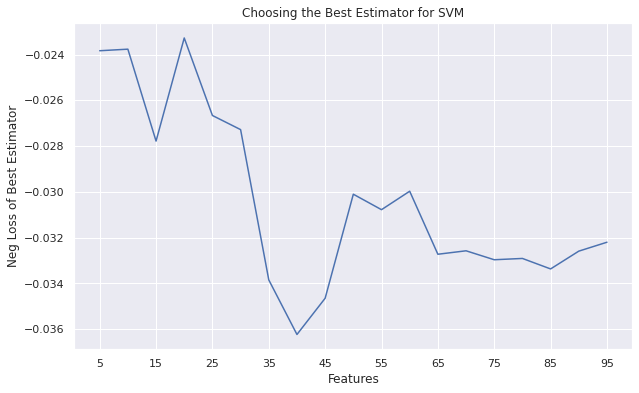

In [ ]:
from sklearn.svm import SVC
from scipy.stats import expon

# Estimator and Parameters
estimator = SVC(probability=True)
params = {'kernel':['rbf', 'sigmoid', 'poly', 'linear'], 'C':expon(scale=3)}

# Choosing the best one
best_svm, n = choose_best_clf(estimator, params,
                          model_name='SVM', n_iter=50)

# Storing
best_estimators['svm'] = best_svm
features_chosen['svm'] = n

The rbf kernel is chosen as part of the best parameters. This kernel is quite robust and it one of the most prefered kernels used in practice. Additionally SVM seems to work best with only the 20 most important genes indentified previously by Extra Trees. SVM suffers to a lesser degree from the Curse of Dimensionality than other methods and this might be an indiciator that the 15 most important genes encode a lot of information.


<h4> Extra Trees </h4>


Best Classifiers parameters: {'n_estimators': 30, 'max_leaf_nodes': 60, 'n': 10}


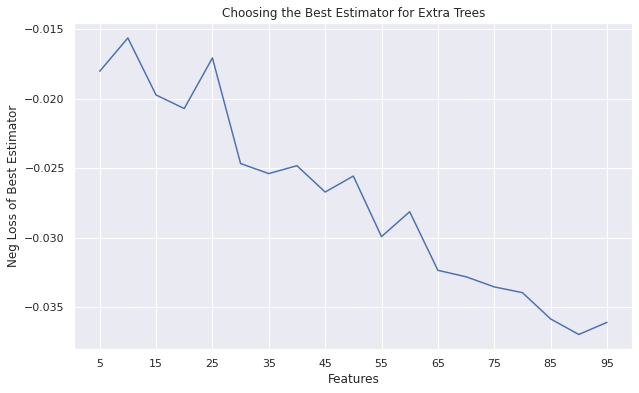

In [ ]:
#@title
from sklearn.ensemble import ExtraTreesClassifier

# Estimator and Parameters
estimator = ExtraTreesClassifier(bootstrap=True, max_samples=0.8)
params = {'n_estimators':[20, 30, 50, 100, 200], 
              'max_leaf_nodes': np.arange(20, 100, 10)}

# Choosing the best classifier
best_rf, n = choose_best_clf(estimator, params, model_name='Extra Trees',
                n_iter=10, cv=5)

# Storing
best_estimators['Extra Trees'] = best_rf
features_chosen['Extra Trees'] = n

This graph is quite interesting. It seems that the more features we add, the worse the ET performs. However, this is reasonable as the features were sorted in order of importance by an ET as well. The high performance of the ET is a further indicator that the data is not linear. 

<h4> Logistic Regression </h4>

Falling back to GridSearch. Number of iterations 2
Best Classifiers parameters: {'penalty': 'l2', 'n': 20}


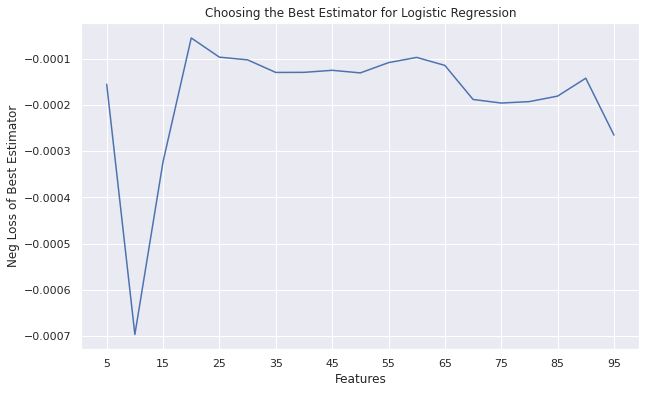

In [ ]:
#@title
from sklearn.linear_model import LogisticRegression

estimator = LogisticRegression(solver='liblinear', max_iter=1000)
params = {'penalty': ['l2', 'l1']}

best_lr, n = choose_best_clf(estimator, params, cv=5, n_total=100, 
                model_name='Logistic Regression')

best_estimators['Logistic'] = best_lr
features_chosen['Logistic'] = n

The logistic regression's performance is impressive. It uses l2 regularization and a small number of features. Its performance decreases with the number of features. 

<h4> KNN </h4>

Best Classifiers parameters: {'weights': 'distance', 'n_neighbors': 16, 'n': 90}


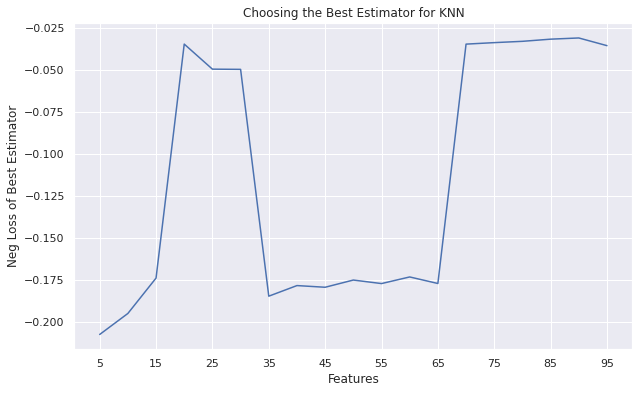

In [ ]:
#@title
from sklearn.neighbors import KNeighborsClassifier

estimator = KNeighborsClassifier()
# We start from thre
params = {'n_neighbors': np.arange(3, 20), 
          'weights': ['uniform', 'distance']}

best_knn, n = choose_best_clf(estimator, params, cv=5, n_total=100, n_iter=5, 
                model_name='KNN')

best_estimators['KNN'] = best_knn
features_chosen['KNN'] = n

It is odd to see that KNN chooses a rather high number of features. From our understanding, the notion of distance gets distorted in a high dimensional space. However, this does not seem to be a flaw, as the model performs in a consistent matter after reaching a high number of features (> 65). The chosen number of components is quite large, but this is to be expected as we are enforcing a probabilistic prediction from the KNN and KNN has no better alternative than to just return the fraction of the dominant class in the cluster of neighbours. Assigning weights to the neighbours according to the distances seems to help.

#### Creating the Ensemble

![picture](https://en.meming.world/images/en/thumb/2/26/Oh_Yeah%2C_It%27s_All_Coming_Together.jpg/300px-Oh_Yeah%2C_It%27s_All_Coming_Together.jpg)



Validating every model individually and then the ensemble:

In [ ]:
#@title
from sklearn.metrics import accuracy_score
from sklearn.metrics import log_loss

def evaluate_test_set(estimator):
  n_features = features_chosen[estimator]
  genes_chosen = important_genes[:n_features]
  # select the appropriate data split
  test_data = X_valid.loc[:, genes_chosen]
  # make predictions
  predictions = best_estimators[estimator].predict(test_data)
  proba = best_estimators[estimator].predict_proba(test_data)
  return accuracy_score(predictions, y_valid), log_loss(y_valid, proba)

print('On the Validation set:')
for estimator in best_estimators.keys():
  acc, loss = evaluate_test_set(estimator)
  print(f'   {estimator} has {acc} accuracy and {round(-loss, 4)} loss')

On the Validation set:
   svm has 1.0 accuracy and -0.0529 loss
   Extra Trees has 0.96 accuracy and -0.0833 loss
   Logistic has 0.96 accuracy and -0.1483 loss
   KNN has 0.96 accuracy and -1.3816 loss


Below we build the Ensemble Class and we endow it with two important modules that are demonstrated in what follows. 

In [ ]:
class Ensemble:
  
  def __init__(self, best_estimators, features_chosen, important_genes, name=''):
    self.models = best_estimators
    self.features = features_chosen
    self.genes = important_genes
    self.count = len(best_estimators)
    self.name = name
  
  def _choose_genes(self, estimator):
    n_features = self.features[estimator]
    return self.genes[:n_features]
  
  def _make_predictions(self, estimator, data):
    genes_chosen = self._choose_genes(estimator)
    # select the appropriate data split
    test_data = data.loc[:, genes_chosen]
    return self.models[estimator].predict_proba(test_data)[:, 1]
  
  
  def __call__(self, data):
      preds = {}
      for estimator in self.models.keys():
        preds[estimator+self.name] = self._make_predictions(estimator, data)
      preds = pd.DataFrame(preds)
      return preds
  
  def soft_vote(self, data, proba=True):
    preds = self(data).sum(axis=1)/self.count
    return preds if proba else np.round(preds)
      

In [ ]:
# FI stands for Feature Importance
ensemble_fi = Ensemble(best_estimators, features_chosen, important_genes, '_FI')
ensemble_fi(X_valid).head() # make predictions

,svm_FI,Extra Trees_FI,Logistic_FI,KNN_FI
0,0.438712,0.633333,9.752433e-01,1.0
1,0.000832,0.000000,3.772032e-12,0.0
2,0.003826,0.000000,9.554025e-09,0.0
3,0.006998,0.400000,3.218201e-09,0.0
4,1.000000,1.000000,1.000000e+00,1.0


In [ ]:
ensemble_fi.soft_vote(X_valid) # soft voting
# ensemble_fI.soft_vote(X_valid, proba=False) for actual predictions

0     0.761822
1     0.000208
2     0.000957
3     0.101750
4     1.000000
5     0.000161
6     0.000328
7     0.998196
8     0.000019
9     0.997280
10    1.000000
11    0.994221
12    0.000208
13    0.226369
14    0.000069
15    0.001800
16    1.000000
17    0.000002
18    0.999999
19    0.999997
20    0.000468
21    0.009997
22    0.000176
23    0.999997
24    0.995595
dtype: float64

In [ ]:
ensemble_fi.soft_vote(X_valid, proba=False) == y_valid

0     False
1      True
2      True
3      True
4      True
5      True
6      True
7      True
8      True
9      True
10     True
11     True
12     True
13     True
14     True
15     True
16     True
17     True
18     True
19     True
20     True
21     True
22     True
23     True
24     True
dtype: bool

Note: The other two sections are similar to the current section. We have tried to keep them brief, omitting most of the code in hidden cells (with an option to show the code, of course). One may also jump ahead to "Ensembling the Ensembles", without a major loss in information. 

### PCA for Dimensionality Reduction

#### Some Useful Functions

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin

class Logger(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass
    def fit(self, df):
        return self
    def transform(self, df):
        return df.apply(lambda x: np.log2(1+x))

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

class Pca(BaseEstimator, TransformerMixin):
    def __init__(self, n_components=None, do_plot=True):
        self.do_plot = do_plot
        if n_components is not None:
            self.pca = PCA(n_components)
        else:
            self.pca = PCA()
    
    def fit(self, df):
        self.pca.fit(df)
        cumsum = np.cumsum(self.pca.explained_variance_ratio_)
        if self.do_plot:
            plt.figure(figsize=(16, 4))
            plt.plot(cumsum, linewidth=3)
            plt.xlabel("Dimensions")
            plt.ylabel("Explained Variance")
            plt.title("Explained Variance vs number of components")
            plt.grid(True)
            plt.show()
            
            var = self.pca.explained_variance_ratio_[0:20]
            labels = ["PC"+str(i+1) for i in range(20)]
            plt.figure(figsize=(16,4))
            plt.bar(labels, var)
            plt.xlabel('Pricipal Components')
            plt.ylabel('Proportion of Variance Explained')
            plt.show()
        return self
    def transform(self, df):
        return self.pca.transform(df)

def make_pca_pipe(n_components=None, do_plot=True):
    pca_pipe = Pipeline([('log', Logger()), ('scaler', StandardScaler(with_std=True)), ('pca', Pca(n_components=n_components, do_plot=do_plot))])
    return pca_pipe

In [ ]:
from sklearn.svm import SVC
from scipy.stats import expon
from sklearn.model_selection import RandomizedSearchCV
import math

def pca_cv(X, y, n_comps, parameters, estimator, n_iter=10, cv=5, verbose=1,
           random_state=42, model_name='Model Name'):
    best_clf, best_params, best_score = None, None, - math.inf
    scores = []
    
    for n in range(5, n_comps, 5):
        X_train_red = X[:, :n]
        clf = RandomizedSearchCV(estimator, parameters, n_iter=n_iter, cv=cv, verbose=verbose,
                                 scoring='neg_log_loss', random_state=random_state)
        clf.fit(X_train_red, y)

        scores.append(clf.best_score_)
        if clf.best_score_ > best_score:
            best_clf, best_score = clf.best_estimator_, clf.best_score_
            best_params = clf.best_params_
            best_params['n'] = n
    
    _plot_scores(scores, n_comps, model_name, "Number of Principal Components")
    return best_clf, best_params, best_score

#### Fiting the PCA

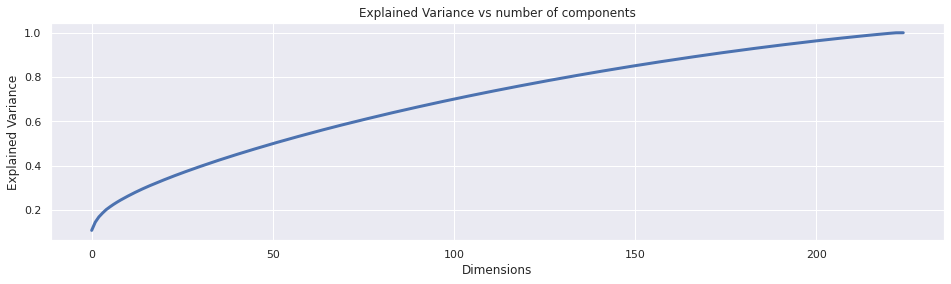

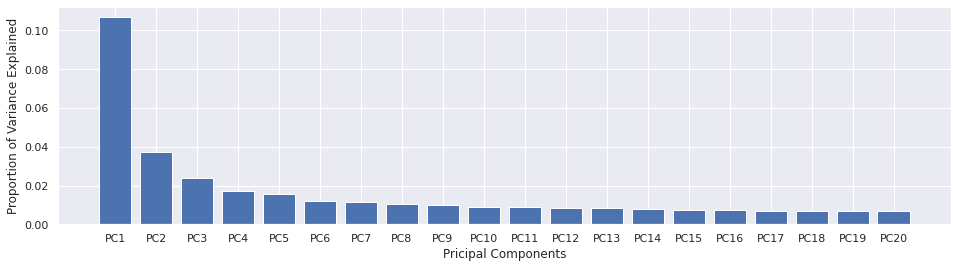

1.0

In [ ]:
pca_pipe = make_pca_pipe()
red = pca_pipe.fit_transform(X_train)

pca_pipe['pca'].pca.explained_variance_ratio_.sum()

Note: The PCA pipeline logs and standardizes the data before fitting it, in order to have a similar scale throughout the genes. A more detailed explanation may be found in the unsupervised analysis. \\

It is odd that 200 features explain almost all the variance in the data. This might be an indicator that most of the data is redunant. 

#### Building Classifiers

In [ ]:
best_estimators_pca = {}
comp_chosen = {}

<h4> SVM </h4>

best parameters: {'C': 0.16959629191460518, 'kernel': 'linear', 'n': 35}, best_score : -0.014549946452476138


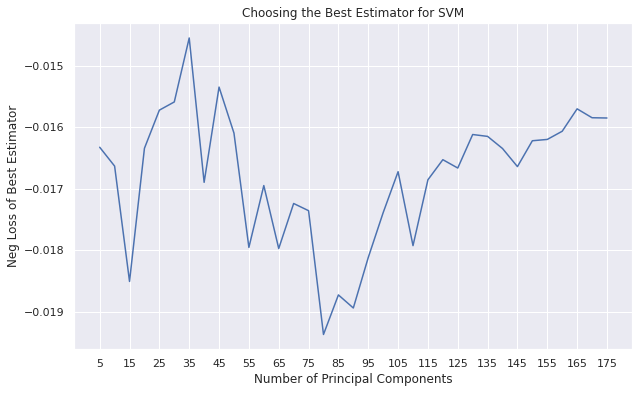

In [ ]:
#@title
n_comps = 180

parameters = {'kernel':['rbf', 'poly', 'linear'], 'C':expon()}
estimator = SVC(probability=True)

best_clf, best_params, best_score = pca_cv(red, y_train, n_comps, parameters,
                                           estimator, n_iter=20, verbose=0, cv=5,
                                           model_name='SVM')

best_estimators_pca['svm'] = best_clf
comp_chosen['svm'] = best_params['n']
print(f"best parameters: {best_params}, best_score : {best_score}")


The kernel chosen is linear. We saw in the EDA that some genes were quite good at separating the two conditions, so it is not unreasonable to show the linear kernel be selected by the CV procedure. 

<h4> Extra Trees </h4>

best parameters: {'n_estimators': 150, 'max_leaf_nodes': 30, 'n': 5}, best_score : -0.052605239888562784


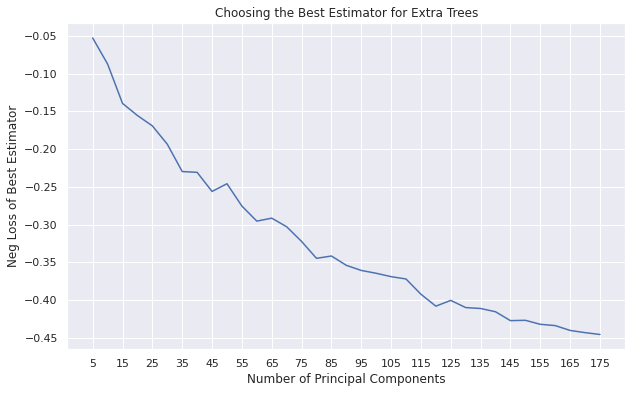

In [ ]:
#@title
from sklearn.ensemble import ExtraTreesClassifier

n_comps = 180

parameters = {'n_estimators': np.arange(100, 200, 10), 'max_leaf_nodes': np.arange(10, 40, 5)}
estimator = ExtraTreesClassifier(bootstrap=True, max_samples=0.8)

best_clf, best_params, best_score = pca_cv(red, y_train, n_comps, parameters,
                                           estimator, n_iter=20, verbose=0, cv=5,
                                           model_name='Extra Trees')

best_estimators_pca['Extra Trees'] = best_clf
comp_chosen['Extra Trees'] = best_params['n']
print(f"best parameters: {best_params}, best_score : {best_score}")

The Extra Trees seems to continue to prefer condensed information.

<h4> Logistic Regression </h4>

best parameters: {'penalty': 'l2', 'n': 35}, best_score : -0.0012361154443924142


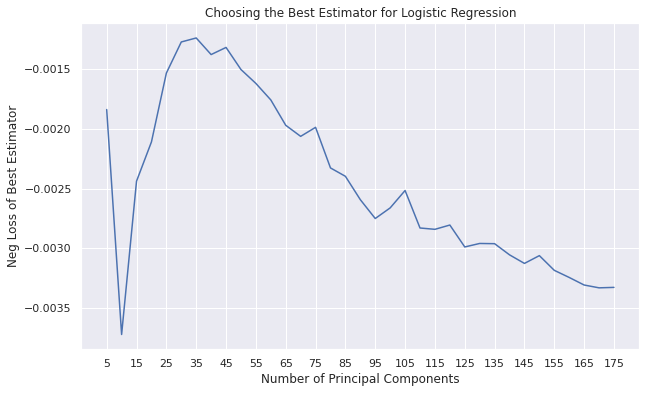

In [ ]:
#@title
from sklearn.linear_model import LogisticRegression

estimator = LogisticRegression(solver='liblinear')
parameters = {'penalty': ['l2', 'l1']}

n_comps = 180

best_clf, best_params, best_score = pca_cv(red, y_train, n_comps, parameters,
                                           estimator, n_iter=2, verbose=0, cv=5,
                                           model_name='Logistic Regression')

best_estimators_pca['Logistic'] = best_clf
comp_chosen['Logistic'] = best_params['n']
print(f"best parameters: {best_params}, best_score : {best_score}")

Logistic Regression is quite similar to before.

<h4> KNN </h4>

best parameters: {'weights': 'uniform', 'n_neighbors': 19, 'n': 5}, best_score : -0.7024657885797214


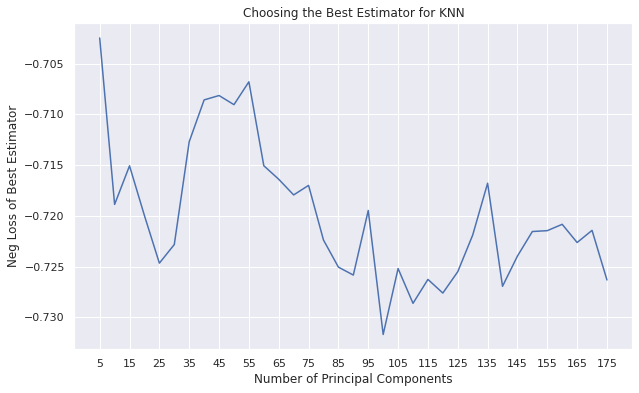

In [ ]:
#@title
from sklearn.neighbors import KNeighborsClassifier

n_comps = 180

parameters = {'n_neighbors': np.arange(3, 20, 1), 
              'weights': ['uniform', 'distance']}
estimator = KNeighborsClassifier()

best_clf, best_params, best_score = pca_cv(red, y_train, n_comps, parameters,
                                           estimator, n_iter=20, verbose=0, cv=5,
                                           model_name='KNN')

best_estimators_pca['KNN'] = best_clf
comp_chosen['KNN'] = best_params['n']
print(f"best parameters: {best_params}, best_score : {best_score}")

The number of components chosen is relatively low, which is in line with what we would expect. 

#### Building the Ensemble

In [ ]:
#@title
from sklearn.metrics import accuracy_score
from sklearn.metrics import log_loss

X_valid_red = pca_pipe.transform(X_valid)

def evaluate_test_set(estimator):
  n_comps = comp_chosen[estimator]
  # select the appropriate data split
  test_data = X_valid_red[:, :n_comps]
  # make predictions
  predictions = best_estimators_pca[estimator].predict(test_data)
  proba = best_estimators_pca[estimator].predict_proba(test_data)
  return accuracy_score(predictions, y_valid), log_loss(y_valid, proba)

print('On the Validation set:')
for estimator in best_estimators_pca.keys():
  acc, loss = evaluate_test_set(estimator)
  print(f'   {estimator} has {acc} accuracy and {round(-loss, 4)} loss')

On the Validation set:
   svm has 1.0 accuracy and -0.031 loss
   Extra Trees has 0.96 accuracy and -0.0634 loss
   Logistic has 1.0 accuracy and -0.0158 loss
   KNN has 0.96 accuracy and -1.3816 loss


<h5> The Ensemble implementation </h5>

In [ ]:
#@title
class Ensemble_PCA:
  
  def __init__(self, best_estimators, comp_chosen, pca, name=''):
    self.models = best_estimators
    self.comp = comp_chosen
    self.count = len(best_estimators)
    self.name = name
    self.pca = pca
  
  
  def _make_predictions(self, estimator, data):
    comp_chosen = self.comp[estimator]
    # select the appropriate data split
    test_data = data[:, :comp_chosen]
    return self.models[estimator].predict_proba(test_data)[:, 1]
  
  def __call__(self, data):
    test_data = self.pca.transform(data)
    preds = {}
    for estimator in self.models.keys():
      preds[estimator+self.name] = self._make_predictions(estimator, test_data)
    preds = pd.DataFrame(preds)
    return preds
  
  def soft_vote(self, data, proba=True):
    preds = self(data).sum(axis=1)/self.count
    return preds if proba else np.round(preds)

In [ ]:
ensemble_pca = Ensemble_PCA(best_estimators_pca, comp_chosen, pca_pipe, 'PCA')
ensemble_pca(X_valid)

,svmPCA,Extra TreesPCA,LogisticPCA,KNNPCA
0,0.306251,0.524040,0.232952,1.0
1,0.003605,0.054667,0.000029,0.0
2,0.003049,0.007353,0.000038,0.0
3,0.242471,0.140833,0.116777,0.0
4,0.999997,0.947226,0.999995,1.0
5,0.005230,0.026667,0.000091,0.0
6,0.001972,0.054000,0.000011,0.0
7,0.994672,0.972667,0.999806,1.0
8,0.002381,0.020000,0.000032,0.0
9,0.992882,0.980000,0.999385,1.0


In [ ]:
ensemble_pca.soft_vote(X_valid, proba=False) == y_valid

0     False
1      True
2      True
3      True
4      True
5      True
6      True
7      True
8      True
9      True
10     True
11     True
12     True
13     True
14     True
15     True
16     True
17     True
18     True
19     True
20     True
21     True
22     True
23     True
24     True
dtype: bool

### Clustering For Feature Extraction
We have shown that clustering is a successful unsurpervised learning algorithm. In this section, we show that clustering can also be used as a preprocessing step for performing dimensionality reduction of our data. More specifically we will use KMeans Clustering to do the following: \\
We select an arbitrary $k$ and we find $k$ centroids in the 3000-dimensional space of the encoded data of the cells. Then for each cell we compute its distance to each one of the centroids, and these distances become the new features for each cell. So if we have 10 clusters, we go from 3000 features to 10 features for each cell. A substantial decrease in the number of features. We do not which is the best $k$ to use, so we determine $k$ using cross validation for each model. (the value $k$ is free to vary across models).


![picture](https://github.com/sevdari/AI-Lab-Public/blob/main/clustering%20preprocessing.png?raw=true)


In [ ]:
X_train.shape, y_train.shape, X_valid.shape, y_valid.shape # sanity check

((225, 3000), (225,), (25, 3000), (25,))

In [ ]:
best_estimators_km = {}
cluster_chosen = {}

<h4> Function for choosing the best classifier and best clustering</h4>

Similar function to the sections above for choosing the best classifiers:

In [ ]:
#@title
from sklearn.cluster import KMeans

def cv_kmeans(estimator, params, n_iter=20, cv=5, n_total=100, 
                    model_name='Model Name'):

  best_clf, best_params, best_score = None, None, -math.inf
  best_cluster = None
  scores = []

  for n_clusters in range(5, n_total, 5):

    k_means = KMeans(n_clusters=n_clusters)
    X_train_k = k_means.fit_transform(X_train)
    clf = _custom_cv(X_train_k, y_train, estimator, params, cv, n_iter)

    scores.append(clf.best_score_)

    # Storing
    if clf.best_score_ > best_score:
      best_clf, best_score = clf.best_estimator_, clf.best_score_
      best_params = clf.best_params_
      best_params['n'] = n_clusters
      best_cluster = k_means
    
  print('Best Classifiers parameters:', best_params)

  # Plot the scores
  try:
    _plot_scores(scores, n_total, model_name, 'Number of Clusters')
  except:
    print('Plotting failed')

  return best_clf, best_cluster
  

#### Building Classifiers

<h4> SVM</h4>

Best Classifiers parameters: {'C': 3.6793853071446567, 'kernel': 'rbf', 'n': 5}


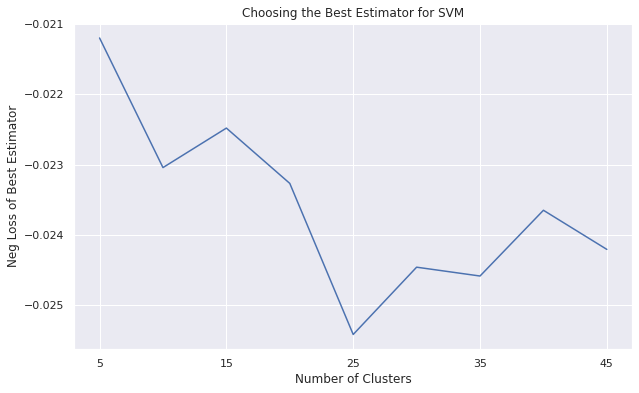

In [ ]:
#@title
from sklearn.svm import SVC
from scipy.stats import expon

# Estimator and Parameters
estimator = SVC(probability=True)
params = {'kernel':['rbf', 'sigmoid', 'poly'], 'C':expon(scale=3)}

# Choosing the best one
best_svm, cluster = cv_kmeans(estimator, params,
                          model_name='SVM', n_iter=50, n_total=50)

# Storing
best_estimators_km['svm'] = best_svm
cluster_chosen['svm'] = cluster

<h4> Extra Trees</h4>

Best Classifiers parameters: {'n_estimators': 20, 'max_leaf_nodes': 50, 'n': 25}


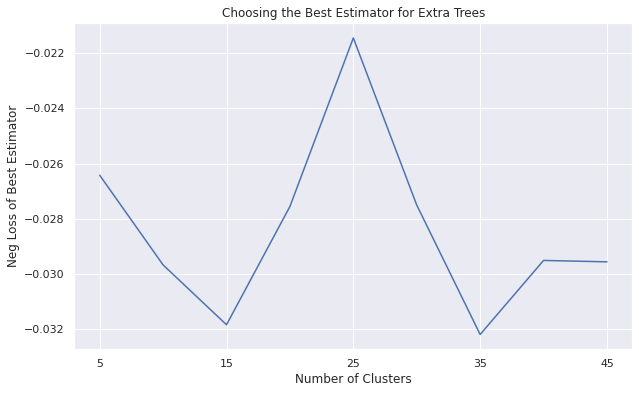

In [ ]:
#@title
from sklearn.ensemble import ExtraTreesClassifier

# Estimator and Parameters
estimator = ExtraTreesClassifier(bootstrap=True, max_samples=0.8)
params = {'n_estimators':[20, 30, 50, 100, 200], 
              'max_leaf_nodes': np.arange(20, 100, 10)}

# Choosing the best classifier
best_rf, cluster = cv_kmeans(estimator, params, model_name='Extra Trees',
                n_iter=10, cv=5, n_total=50)

# Storing
best_estimators_km['Extra Trees'] = best_rf
cluster_chosen['Extra Trees'] = cluster

<h4>Logistic Regression </h4>

Best Classifiers parameters: {'penalty': 'l1', 'n': 15}


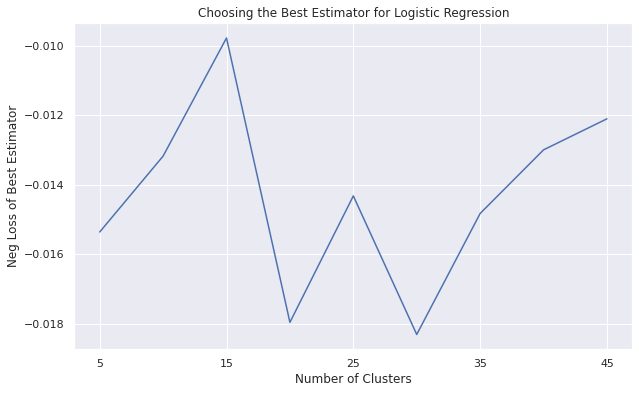

In [ ]:
#@title
from sklearn.linear_model import LogisticRegression

estimator = LogisticRegression(solver='liblinear', max_iter=1000)
params = {'penalty': ['l2', 'l1']}

best_lr, cluster = cv_kmeans(estimator, params, cv=5, n_total=50, 
                model_name='Logistic Regression', n_iter=2)

best_estimators_km['Logistic'] = best_lr
cluster_chosen['Logistic'] = cluster

<h4> KNN</h4>

Best Classifiers parameters: {'n_neighbors': 1, 'n': 5}


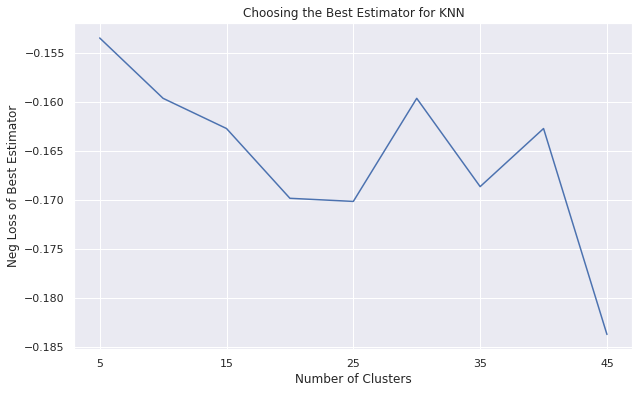

In [ ]:
#@title
from sklearn.neighbors import KNeighborsClassifier

estimator = KNeighborsClassifier()
params = {'n_neighbors': np.arange(1, 20)}

best_knn, cluster = cv_kmeans(estimator, params, cv=5, n_total=50, n_iter=10, 
                model_name='KNN')

best_estimators_km['KNN'] = best_knn
cluster_chosen['KNN'] = cluster

#### Creating the Ensemble

The Ensemble Class: 

In [ ]:
#@title
class Ensemble_KM:
  
  def __init__(self, best_estimators, clusters,  name=''):
    self.models = best_estimators
    self.clusters = clusters
    self.count = len(best_estimators)
    self.name = name
  
  def _make_predictions(self, estimator, data):
    k_means = self.clusters[estimator]
    # select the appropriate data split
    test_data = k_means.transform(data)
    return self.models[estimator].predict_proba(test_data)[:, 1]
  
  
  def __call__(self, data):
      preds = {}
      for estimator in self.models.keys():
        preds[estimator+self.name] = self._make_predictions(estimator, data)
      preds = pd.DataFrame(preds)
      return preds
  
  def soft_vote(self, data, proba=True):
    preds = self(data).sum(axis=1)/self.count
    return preds if proba else np.round(preds)
      

In [ ]:
ensemble_km = Ensemble_KM(best_estimators_km, cluster_chosen, name='_KM')
valid_preds = ensemble_km(X_valid)
valid_preds.head()

,svm_KM,Extra Trees_KM,Logistic_KM,KNN_KM
0,0.783278,0.7,9.999261e-01,0.0
1,0.004769,0.0,6.416736e-13,0.0
2,0.004042,0.0,6.593632e-14,0.0
3,0.064055,0.2,1.316317e-01,0.0
4,0.968163,1.0,1.000000e+00,1.0


In [ ]:
#@title
from sklearn.metrics import accuracy_score
from sklearn.metrics import log_loss
print('On the Validation set: ')
for estimator in best_estimators_km.keys():
  pred = valid_preds[estimator + '_KM']
  acc = accuracy_score(np.round(pred), y_valid)
  loss = log_loss(y_valid, pred)
  print(f'{estimator} has {acc} accuracy and {loss} loss')

svm has 0.96 accuracy and 0.07055306228241048 loss
Extra Trees has 0.96 accuracy and 0.06974060673202366 loss
Logistic has 0.96 accuracy and 0.3861528697756345 loss
KNN has 1.0 accuracy and 9.992007221626415e-16 loss


Although these models perform well, their performance is much worse than the previous models trained using PCA and Feature Importance. 

In [ ]:
ensemble_km.soft_vote(X_valid, proba=False) == y_valid

0     False
1      True
2      True
3      True
4      True
5      True
6      True
7      True
8      True
9      True
10     True
11     True
12     True
13     True
14     True
15     True
16     True
17     True
18     True
19     True
20     True
21     True
22     True
23     True
24     True
dtype: bool

### Raw Data
We could also try to build models by feeding them the whole raw data. With no notion of order of importance, no condensed information, we expect the models to overfit. 

In [ ]:
#@title 
from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import accuracy_score
from sklearn.metrics import log_loss

# Estimator and Parameters
estimator = SVC(probability=True)
params = {'kernel':['rbf', 'sigmoid', 'poly', 'linear'], 'C':expon(scale=3)}

clf = RandomizedSearchCV(estimator, params, random_state=0,
                         scoring='neg_log_loss', n_iter=20)

clf.fit(X_train, y_train)
model = clf.best_estimator_
preds = model.predict_proba(X_valid)[:, 1]
acc = accuracy_score(np.round(preds), y_valid)
loss = log_loss(y_valid, preds)
print(f'On Training, SVM has {clf.best_score_} loss')
print(f'On the validation set, SVM has {acc} accuracy, {-loss} loss')

On Training, SVM has -0.022219948768907417 loss
On the validation set, SVM has 0.96 accuracy, -0.04688859190400792 loss


In [ ]:
#@title 
from sklearn.ensemble import ExtraTreesClassifier

# Estimator and Parameters
estimator = ExtraTreesClassifier(bootstrap=True, max_samples=0.8)
params = {'n_estimators':[20, 30, 50, 100, 200], 
              'max_leaf_nodes': np.arange(20, 100, 10)}

clf = RandomizedSearchCV(estimator, params, random_state=0,
                         scoring='neg_log_loss', n_iter=20)

clf.fit(X_train, y_train)
clf.best_score_
model = clf.best_estimator_
preds = model.predict_proba(X_valid)[:, 1]
acc = accuracy_score(np.round(preds), y_valid)
loss = log_loss(y_valid, preds)
print(f'On Training, Extra Trees has {clf.best_score_} loss')
print(f'On the valdiation set, Extra Trees has {acc} accuracy, {-loss} loss')

On Training, Extra Trees has -0.09971171949035966 loss
On the valdiation set, Extra Trees has 0.96 accuracy, -0.1357037805755803 loss


In [ ]:
#@title
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV

logistic = LogisticRegression(solver='liblinear', max_iter=1000)
params = {'penalty':['l2', 'l1']}
clf = RandomizedSearchCV(logistic, params, random_state=0,
                         scoring='neg_log_loss', n_iter=2)
clf.fit(X_train, y_train)
model = clf.best_estimator_
preds = model.predict_proba(X_valid)[:, 1]
acc = accuracy_score(np.round(preds), y_valid)
loss = log_loss(y_valid, preds)
print(f'On Training, Logistic Regression has {clf.best_score_} loss')
print(f'On the Validation, set Logistic Regression has {acc} accuracy, {-loss} loss')

On Training, Extra Trees has -0.0005413270955057579 loss
On the Validation, set Logistic Regression has 1.0 accuracy, -0.0012767002657859865 loss


Although there is no strong tendency for the models to overfit, the models on the raw data perform substantially worse than the models trained on PCA or Feature Importance for example. This observation justifies our previous work and discussions. 

### Ensembling the Ensembles and Generating the Final Predictions

In [ ]:
# read the test file
X_test, _ = format_file(mcf_smart_test)
X_test.shape

(63, 3000)

Checking that the format of the train and test file are the same.

In [ ]:
X_test.head()

,"""CYP1B1""","""CYP1B1-AS1""","""CYP1A1""","""NDRG1""","""DDIT4""","""PFKFB3""","""HK2""","""AREG""","""MYBL2""","""ADM""",...,"""CD27-AS1""","""DNAI7""","""MAFG""","""LZTR1""","""BCO2""","""GRIK5""","""SLC25A27""","""DENND5A""","""CDK5R1""","""FAM13A-AS1"""
"""1""",492,253,0,1157,6805,5447,2662,2448,0,58,...,0,0,193,0,0,0,0,285,0,1
"""2""",7199,3245,7181,1857,20731,4374,5490,0,0,2150,...,0,0,187,0,0,0,0,55,0,0
"""3""",12,11,1,5,147,301,9,647,1890,1,...,0,0,28,0,0,0,0,1,0,0
"""4""",373,187,0,0,43,37,0,0,580,0,...,21,0,131,0,0,0,0,3,0,0
"""5""",31,13,0,0,0,44,8,0,554,0,...,43,0,30,0,0,0,0,1,0,0


In [ ]:
X_train.head()

,"""CYP1B1""","""CYP1B1-AS1""","""CYP1A1""","""NDRG1""","""DDIT4""","""PFKFB3""","""HK2""","""AREG""","""MYBL2""","""ADM""",...,"""CD27-AS1""","""DNAI7""","""MAFG""","""LZTR1""","""BCO2""","""GRIK5""","""SLC25A27""","""DENND5A""","""CDK5R1""","""FAM13A-AS1"""
"""output.STAR.3_B3_Norm_S63_Aligned.sortedByCoord.out.bam""",52,29,0,2,112,39,0,62,3108,0,...,0,0,3,0,0,0,0,0,0,0
"""output.STAR.4_E11_Hypo_S239_Aligned.sortedByCoord.out.bam""",10101,4533,462,1950,2608,2748,312,3496,0,0,...,0,0,51,96,0,0,0,63,0,0
"""output.STAR.4_C1_Norm_S115_Aligned.sortedByCoord.out.bam""",677,272,0,0,118,110,35,12,942,0,...,71,0,56,0,0,0,0,14,0,0
"""output.STAR.3_B7_Hypo_S85_Aligned.sortedByCoord.out.bam""",12647,5175,61,608,4343,1175,1410,39,1,1946,...,24,0,17,0,0,0,0,101,0,22
"""output.STAR.4_E2_Norm_S212_Aligned.sortedByCoord.out.bam""",345,112,0,0,0,0,0,0,497,0,...,15,0,16,19,0,0,0,63,1,0


In [ ]:
np.sum(X_train.columns == X_test.columns)

3000

We will omit the ensemble that used clustering for feature extraction and we will keep the first two ensembles. This choice is justified by the performance that the models had on the validation set. After ensembling we do a soft vote over everything. 

In [ ]:
ensembles = [ensemble_fi, ensemble_pca] 
preds = []

In [ ]:
for ensemble in ensembles:
  preds.append(ensemble(X_test))

In [ ]:
final_preds = pd.concat(preds, axis=1)
final_preds

,svm_FI,Extra Trees_FI,Logistic_FI,KNN_FI,svmPCA,Extra TreesPCA,LogisticPCA,KNNPCA
0,0.994674,1.0,1.000000e+00,1.0,0.999988,0.992667,0.999987,1.0
1,0.996656,1.0,1.000000e+00,1.0,0.997383,0.993333,0.999979,1.0
2,0.073105,0.0,9.270332e-05,0.0,0.006290,0.004299,0.000162,0.0
3,0.099674,0.1,5.370298e-04,0.0,0.003727,0.026667,0.000031,0.0
4,0.001059,0.0,1.528218e-10,0.0,0.003201,0.006667,0.000009,0.0
...,...,...,...,...,...,...,...,...
58,0.892147,0.9,9.999999e-01,1.0,0.993430,0.973333,0.999815,1.0
59,0.995239,1.0,1.000000e+00,1.0,0.999998,0.973333,0.999996,1.0
60,0.999994,1.0,1.000000e+00,1.0,0.990794,0.968485,0.999621,1.0
61,0.010627,0.0,1.069954e-07,0.0,0.005285,0.023869,0.000072,0.0


In [ ]:
np.round(final_preds.sum(axis=1)/12) # final predictions

0     1.0
1     1.0
2     0.0
3     0.0
4     0.0
     ... 
58    1.0
59    1.0
60    1.0
61    0.0
62    0.0
Length: 63, dtype: float64

<h4> Error Analysis</h4>

<div>
<img src="https://github.com/sevdari/AI-Lab-Public/blob/main/meme%20error%20analysis.jpg?raw=true" width="300"/>
</div>

Using these methods we got an accuracy of 100% on both datasets (HCC Smart and MCF7 Smart). There were no misclassifications.

## HCC DropSeq

#### Autoencoder
Since the number of features is very high (3000 pre-filtered genes), we try to reduce the dimensionality of the data using an autoencoder. We perform cross-validation to choose the number of layers, the number of neurons per layer, the dimension of the encoded data and whether to use dropout or not. 

![picture](https://github.com/sevdari/AI-Lab-Public/blob/main/autoencoder.png?raw=true)

Since everything was cross-validated, this whole procedure took several hours to run. The final encoded files were saved in a csv format for future use. 

##### The Autoencoder implementation
Warning: This implementation contains lots of code. We tried to make it as simple as possible. 

In [ ]:
import tensorflow as tf
from tensorflow import keras

A convenient function for building autoencoders

In [ ]:
from keras.layers import Dense, Input, Dropout
from keras.models import Model

def build_autoencoder(dimension, n_layers, n_neurons, input_shape, drop_rate=0):
    input_ = Input(shape=input_shape)
    last = input_
    
    for _ in range(n_layers):
        new = Dense(n_neurons, activation='relu')(last)
        drop = Dropout(rate=drop_rate)(new)
        last = drop
    
    reduced = Dense(dimension, activation='relu')(last)
    last = reduced
    
    for _ in range(n_layers):
        new = Dense(n_neurons, activation='relu')(last)
        drop = Dropout(rate=drop_rate)(new)
        last = drop
    
    output = Dense(input_shape)(last)
    
    return Model(inputs=[input_], outputs=[output])

A convenient function for optimizing a given autoencoder.

In [ ]:
def try_autoencoder(dimension, split, n_layers, n_neurons, drop_rate):
    X_train, X_valid, y_train, y_valid = split
    model = build_autoencoder(dimension, n_layers, n_neurons, X_train.shape[1], drop_rate)
    model.compile(optimizer='adam', loss='mse')

    checkpoint_cb = keras.callbacks.ModelCheckpoint("autoencoder.h5", save_best_only=True)

    early_stopping_cb = keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True)

    history = model.fit(X_train, y_train, epochs=200,
                      validation_data=(X_valid, y_valid),
                      callbacks=[checkpoint_cb, early_stopping_cb],
                      verbose=1)
  
  
    model = keras.models.load_model('autoencoder.h5')
    loss = model.evaluate(X_valid, y_valid, verbose=0)
    print('Loss', loss)
    return model, loss, history

In [ ]:
from sklearn.model_selection import train_test_split
from copy import copy

def make_split_autoencoder(data, validation_split=0.2):
    X_train, X_test = train_test_split(data, test_size=validation_split)
    return X_train, X_test, copy(X_train), copy(X_test)

The autoencoder Cross Validation function:

In [ ]:
import math

def autoencoder_cv(data, dimension, validation_split=0.2):
    print('Parameters: Layers, Neurons, Drop Rate')
    best_model, best_loss, best_params, best_history = None, math.inf, None, None
    split = make_split_autoencoder(data, validation_split)
    for n_layers in [1, 2]:
        for n_neurons in [100, 300, 1000]:
            for drop_rate in [0, 0.25]:
                print('Parameters:', n_layers, n_neurons, drop_rate)
                model, loss, history = try_autoencoder(dimension, split, n_layers, n_neurons, drop_rate)
                if loss < best_loss:
                    best_model = model
                    best_loss = loss
                    best_params = n_layers, n_neurons, drop_rate
                    best_history = history

    print('Best Loss: ', best_loss)
    print('Best params: ', best_params)
    return best_model, best_loss, best_params, best_history

In [ ]:
df, y = format_file(hcc_drop)
df = df.apply(lambda x: np.log2(1+x))
df.head()

,"""H1-5""","""MALAT1""","""MT-RNR2""","""ARVCF""","""BCYRN1""","""ATXN7L2""","""IGFBP3""","""H1-3""","""CTIF""","""RNF123""",...,"""IL6R""","""OVCH1-AS1""","""ZBTB38""","""GTF3A""","""LTBP4""","""PCDHGA10""","""MON1B""","""PATZ1""","""TRMT5""","""BRCC3"""
"""AAAAAACCCGGC_Normoxia""",1.584963,2.000000,0.0,0.0,0.0,0.0,0.0,1.584963,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""AAAACCGGATGC_Normoxia""",1.584963,2.000000,0.0,0.0,1.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""AAAACGAGCTAG_Normoxia""",2.584963,1.584963,0.0,0.0,1.0,0.0,1.0,2.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""AAAACTTCCCCG_Normoxia""",1.000000,2.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
"""AAAAGCCTACCC_Normoxia""",0.000000,3.700440,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
X = pd.read_csv("DropSeq/HCC1806_Filtered_Normalised_3000_Data_train.txt", delimiter="\ ", engine='python', index_col=0).T
X.shape

(14682, 3000)

Running the Cross Validation for the Autoencoder and getting the best parameters.

In [ ]:
best_model, best_loss, best_params, best_history = autoencoder_cv(X, dimension=200)

Parameters: Layers, Neurons, Drop Rate
Parameters: 1 100 0
Epoch 1/200
368/368 [==============================] - 5s 12ms/step - loss: 0.0500 - val_loss: 0.0420
Epoch 2/200
368/368 [==============================] - 5s 14ms/step - loss: 0.0381 - val_loss: 0.0360
Epoch 3/200
368/368 [==============================] - 5s 13ms/step - loss: 0.0333 - val_loss: 0.0326
Epoch 4/200
368/368 [==============================] - 5s 12ms/step - loss: 0.0305 - val_loss: 0.0304
Epoch 5/200
368/368 [==============================] - 4s 12ms/step - loss: 0.0287 - val_loss: 0.0292
Epoch 6/200
368/368 [==============================] - 5s 13ms/step - loss: 0.0276 - val_loss: 0.0285
Epoch 7/200
368/368 [==============================] - 5s 13ms/step - loss: 0.0269 - val_loss: 0.0322
Epoch 8/200
368/368 [==============================] - 5s 13ms/step - loss: 0.0267 - val_loss: 0.0273
Epoch 9/200
368/368 [==============================] - 5s 14ms/step - loss: 0.0260 - val_loss: 0.0273
Epoch 10/200
368/368 [=

In [ ]:
best_params

(1, 300, 0)

In [ ]:
best_loss

0.021646840497851372

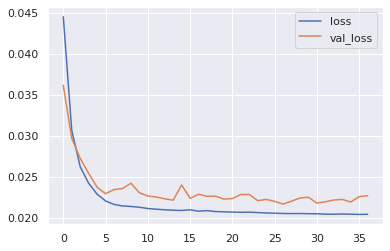

In [ ]:
curves2 = pd.DataFrame(best_history.history)
curves2.plot()

In [ ]:
# Saving the best model
best_model.save('autoencoder', save_format="h5")

In [ ]:
best_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 3000)]            0         
                                                                 
 dense_8 (Dense)             (None, 300)               900300    
                                                                 
 dropout_4 (Dropout)         (None, 300)               0         
                                                                 
 dense_9 (Dense)             (None, 200)               60200     
                                                                 
 dense_10 (Dense)            (None, 300)               60300     
                                                                 
 dropout_5 (Dropout)         (None, 300)               0         
                                                                 
 dense_11 (Dense)            (None, 3000)              9030

In [ ]:
# Building the encoder
encoder = keras.models.Sequential([
    best_model.get_layer(index=0),
    best_model.get_layer(index=1),
    best_model.get_layer(index=2),
    best_model.get_layer(index=3),
])

In [ ]:
encoder.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 300)               900300    
                                                                 
 dropout_4 (Dropout)         (None, 300)               0         
                                                                 
 dense_9 (Dense)             (None, 200)               60200     
                                                                 
Total params: 960,500
Trainable params: 960,500
Non-trainable params: 0
_________________________________________________________________


Encoding the Train and Test Data and saving them to CSV files so that we dont have to rerun the code.

In [ ]:
HCC_Drop_reduced = encoder.predict(X)
HCC_Drop_reduced.shape

(14682, 200)

In [ ]:
df_HCC_Drop_reduced=pd.DataFrame(HCC_Drop_reduced)
df_HCC_Drop_reduced.index = X.index
df_HCC_Drop_reduced.to_csv('HCC_Reduced.csv', index=False)

In [ ]:
Test = pd.read_csv("DropSeq/HCC1806_Filtered_Normalised_3000_Data_test_anonim.txt", delimiter="\ ", engine='python', index_col=0).T
Test.shape

(3671, 3000)

In [ ]:
HCC_Drop_Test_reduced = encoder.predict(Test)
HCC_Drop_Test_reduced.shape

(3671, 200)

In [ ]:
df_HCC_Drop_Test_reduced=pd.DataFrame(HCC_Drop_Test_reduced)
df_HCC_Drop_Test_reduced.to_csv('HCC_Test_Reduced.csv', index=False)

#### DNNs


<h4> Heuristics for choosing a Wide and Deep Model</h4>

![picture](https://github.com/sevdari/AI-Lab-Public/raw/main/NN%20AI%20Lab.png)

A Neural Network is powerful, because it makes use of sequential learning rather than parallel learning. By doing so, it is able to discover deep patterns in the data that a model that uses parallel learning cannot capture. However, simply ignoring the low level patterns can be costly, as they may be good indicators in some scenarios. This can be implemented in a Neural Network by a wide connection from the input layer to a hidden layer/ the output layers. We provide two heuristics on why choosing a Wide and Deep NN might be a clever choice in our particular case:


*   In DropSeq, the number of samples is quite large. In most cases, this is a necessary condition for the successful training of a NN. 
*   In the EDA, we noticed that there were a few genes that were highly correlated with the Hypoxia Condition. Combination of these genes provided a somewhat clear separtion of the 2 conditions (see graph below).

![picture](https://github.com/sevdari/AI-Lab-Public/blob/main/sep%203.jpg?raw=true)



<h4> Note on the Training of DNNs </h4>

We use three datasets which are fed to the model: raw data, scaled data and data encoded with the previously mentioned autoencoder. We use many forms of regularization such as: dropout, batch normalization, early stopping. The best models are saved through callbacks. Below you may find very efficient functions for creating and optimizing DNNs. Even though our initial intention was to build a cross validation function which would choose the parameters of the DNNs automatically, we quickly realized that this would not be possible given our limited computing capacity. So we had to tweak the parameters manually using a convenient function one can find below. After many runs, we selected the best parameters (considering the datasets and the regularization techniques as hyperparameters as well) among the ones we tried, and used those to build the final model which made the predictions. 

In [ ]:
# importing the necessary libraries
import tensorflow as tf
from tensorflow import keras

In [ ]:
# Reading the raw data
df, y = format_file(hcc_drop)

In [ ]:
df.shape, y.shape

((14682, 3000), (14682,))

In [ ]:
# Making a validation set
from sklearn.model_selection import train_test_split
X_train, X_valid, y_train, y_valid = train_test_split(df, y, test_size=0.15, 
                                                              random_state=42)

In [ ]:
X_train.shape, y_train.shape

((12479, 3000), (12479,))

Scaling the Inputs

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [ ]:
X_train_scaled = scaler.fit_transform(X_train)
X_train_scaled.shape

(12479, 3000)

In [ ]:
X_valid_scaled = scaler.transform(X_valid)

Getting the encoded data

In [ ]:
df_red = pd.read_csv(hcc_red) # red stands for reduced
df_red.shape

(14682, 200)

In [ ]:
X_auto_train, X_auto_valid, _ , _ = train_test_split(df_red, y, test_size=0.15, 
                                                              random_state=42)

Note that the random state is the same as above and we do not need to  redefine y_train and y_valid.

Convenient Function for building models.

In [ ]:
from functools import partial
# to avoid repeating code
RegularizedDense = partial(keras.layers.Dense,
                           activation='elu',
                           kernel_initializer='he_normal')

def build_model(n_layers, n_neurons, input_shape, drop_rate=0):
  input_ = keras.layers.Input(shape=input_shape)

  last = RegularizedDense(n_neurons)(input_)
  last = keras.layers.Dropout(rate=drop_rate)(last)
  
  for _ in range(n_layers - 1):
    last = RegularizedDense(n_neurons)(last)
    last = keras.layers.Dropout(rate=drop_rate)(last)

  concat = keras.layers.concatenate([input_, last])
  output = keras.layers.Dense(1, activation='sigmoid')(concat)
  return keras.models.Model(inputs=[input_], outputs=[output])

Convenient Function for optimizing models.

In [ ]:
def try_model(train_data, valid_data, 
              n_layers, n_neurons, drop_rate):
  model = build_model(n_layers, n_neurons, train_data.shape[1], drop_rate)
  model.compile(optimizer='adam', loss='binary_crossentropy', 
                metrics=['accuracy'])
  checkpoint_cb = keras.callbacks.ModelCheckpoint("nn.h5",
                                                save_best_only=True)

  early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, 
                                                  restore_best_weights=True)

  history = model.fit(train_data, y_train, epochs=100,
                      validation_data=(valid_data, y_valid),
                      callbacks=[checkpoint_cb, early_stopping_cb],
                      verbose=1)
  
  
  model = keras.models.load_model('nn.h5')
  loss, acc = model.evaluate(valid_data, y_valid, verbose=0)
  print('Loss', loss, 'Accuracy', acc)
  return model, loss, history

In [ ]:
# Manual CV, DNNs take a lot of time to train. 
models = []
for train_data, valid_data in [[X_train, X_valid], [X_train_scaled, X_valid_scaled], 
                               [X_auto_train, X_auto_valid]]:
    models.append(try_model(train_data, valid_data, 20, 300, 0.5))

Epoch 1/100
390/390 [==============================] - 18s 38ms/step - loss: 5.7506 - accuracy: 0.6323 - val_loss: 0.2385 - val_accuracy: 0.9274
Epoch 2/100
390/390 [==============================] - 14s 36ms/step - loss: 0.2772 - accuracy: 0.8894 - val_loss: 0.1802 - val_accuracy: 0.9460
Epoch 3/100
390/390 [==============================] - 14s 36ms/step - loss: 0.1683 - accuracy: 0.9419 - val_loss: 0.1583 - val_accuracy: 0.9528
Epoch 4/100
390/390 [==============================] - 14s 36ms/step - loss: 0.1398 - accuracy: 0.9554 - val_loss: 0.1441 - val_accuracy: 0.9555
Epoch 5/100
390/390 [==============================] - 19s 48ms/step - loss: 0.1244 - accuracy: 0.9599 - val_loss: 0.1377 - val_accuracy: 0.9528
Epoch 6/100
390/390 [==============================] - 15s 37ms/step - loss: 0.1130 - accuracy: 0.9639 - val_loss: 0.1263 - val_accuracy: 0.9582
Epoch 7/100
390/390 [==============================] - 16s 40ms/step - loss: 0.1045 - accuracy: 0.9674 - val_loss: 0.1206 - val_ac

In HCC's case the best parameters were the following:


*   Dataset: Raw Data
*   Drop Rate: 0.5
*   Batch Normalizaton: Applied
*   Number of Layers: 20
*   Number of Neurons per Layer: 300


In [ ]:
final_model = models[0][0]
final_history = models[0][2]

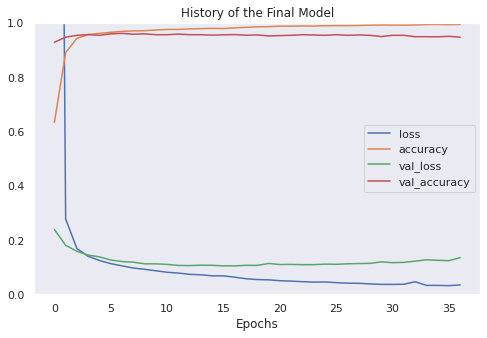

In [ ]:
pd.DataFrame(final_history.history).plot(figsize=(8, 5))
plt.grid()
plt.ylim(0, 1)
plt.title('History of the Final Model')
plt.xlabel('Epochs')
plt.show()

In [ ]:
X_test, _ = format_file(hcc_drop_test)

In [ ]:
final_model.predict(X_test)

array([[1.04186386e-01],
       [1.50471926e-03],
       [5.93334153e-05],
       ...,
       [9.83703256e-01],
       [9.99989271e-01],
       [8.06891620e-02]], dtype=float32)

<h4> Error Analysis </h4>

<div>
<img src="https://static.packt-cdn.com/products/9781838555078/graphics/C13314_06_05.jpg" width="400"/>
</div>

Below we show the eror matrices we got for HCC Drop and MCF7 Drop. Below 1 stands for Hypoxia. \\

HCC: \\
$\begin{bmatrix} 1379 & 94 \\ 75 & 2123\end{bmatrix}$ \\

MCF7: \\
$\begin{bmatrix} 2131 & 41 \\ 60 & 3174\end{bmatrix}$ \\

And now we display some appropiate statistics:



In [ ]:
hcc_matrix = np.array([[1379, 94], [75, 2123]])
mcf_matrix = np.array([[2131, 41], [60, 3174]])

In [ ]:
def yield_stats(error_matrix):
  fn, tp = error_matrix[1]
  tn, fp = error_matrix[0]
  acc = (tp + tn)/error_matrix.sum()
  prec = tp / (tp + fp)
  recall = tp / (tp + fn)
  print(f'Accuracy: {acc}')
  print(f'Precision: {prec}')
  print(f'Recall: {recall}')

In [ ]:
print('On HCC Drop:')
yield_stats(hcc_matrix)

On HCC Drop:
Accuracy: 0.9539634976845546
Precision: 0.9576003608479928
Recall: 0.9658780709736123


In [ ]:
print('On MCF7 Drop:')
yield_stats(mcf_matrix)

On MCF7 Drop:
Accuracy: 0.9813170551239364
Precision: 0.9872472783825816
Recall: 0.9814471243042672


## Appendix

In this appendix, we're plotting the same types of graphs presented for the MCF7 dataset, and will highlight some differences. We did not include this part in the main corpus to avoid being repetitive. For the same reason, since the methods used are basically identical, we avoided including the code for the unsupervised analysis and classification of all four datasets, but rather we picked significant examples suited to the method to be discussed.

### Meta Data

In [ ]:
meta = pd.read_csv(mcf_meta, delimiter='\t', engine='python', index_col=0)
print(f"shape: {meta.shape}")
meta.head()

shape: (383, 8)


,Cell Line,Lane,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A10,Hypo,72,S28,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A11,Hypo,72,S29,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A12,Hypo,72,S30,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A1,Norm,72,S1,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A2,Norm,72,S2,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


### Unfiltered Sequencing Data

In [ ]:
df, y = format_file(mcf_smart_unfiltered)
print(f"shape: {df.shape}")
df.head()

shape: (383, 22934)


,"""WASH7P""","""MIR6859-1""","""WASH9P""","""OR4F29""","""MTND1P23""","""MTND2P28""","""MTCO1P12""","""MTCO2P12""","""MTATP8P1""","""MTATP6P1""",...,"""MT-TH""","""MT-TS2""","""MT-TL2""","""MT-ND5""","""MT-ND6""","""MT-TE""","""MT-CYB""","""MT-TT""","""MT-TP""","""MAFIP"""
"""output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam""",0,0,1,0,0,2,2,0,0,29,...,0,0,0,505,147,4,270,0,5,8
"""output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,0,...,1,1,0,1,0,0,1,0,0,0
"""output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,1,1,1,0,12,...,0,0,0,1,0,0,76,0,0,0
"""output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,7,...,1,0,0,44,8,0,66,0,1,0
"""output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam""",0,0,0,0,0,0,0,0,0,68,...,0,0,0,237,31,3,727,0,0,0


### Quality Control

Here we append the results obtained after performing the same quality control steps as we did for HCC1806.

##### Total count

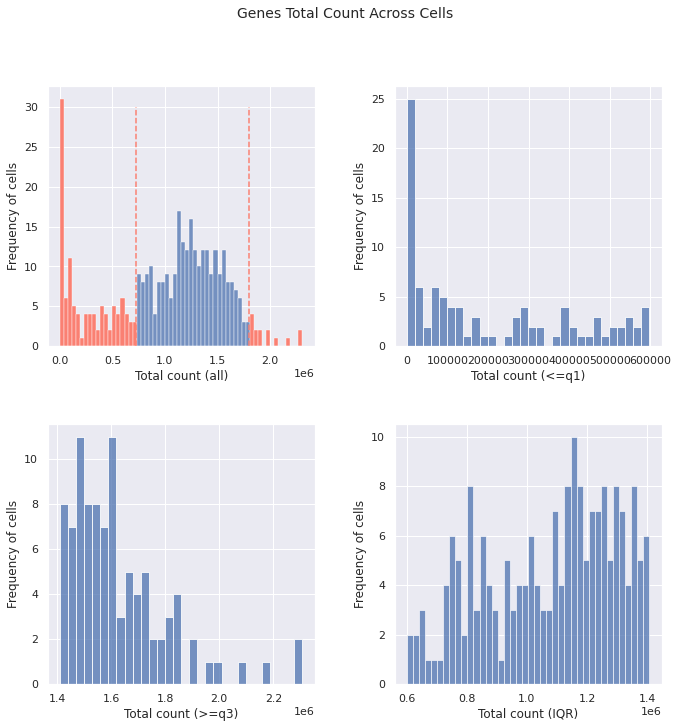

#### Number of Genes

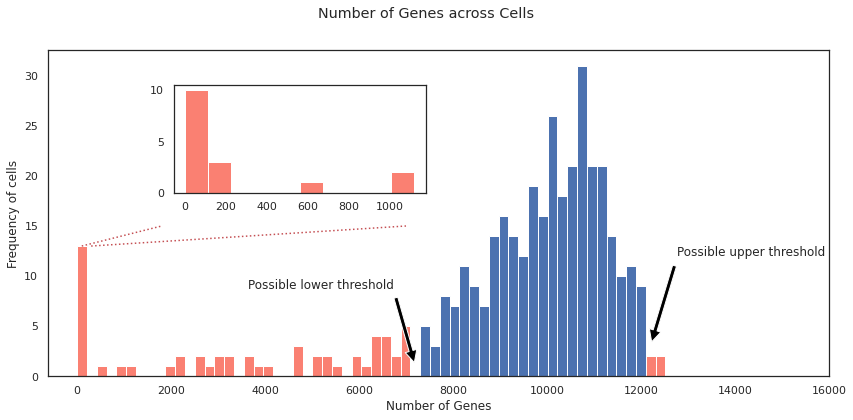

#### Mitochondrial Counts

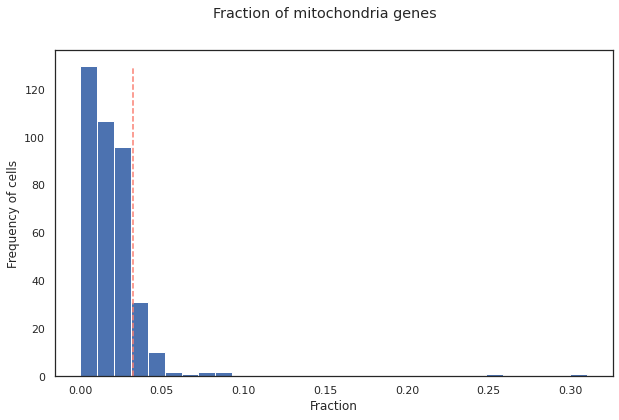

#### Filtering

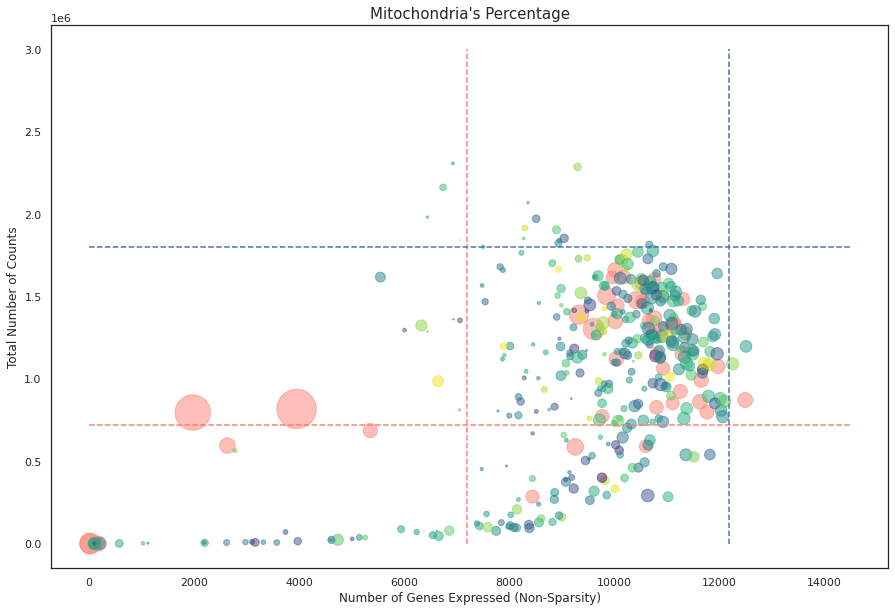

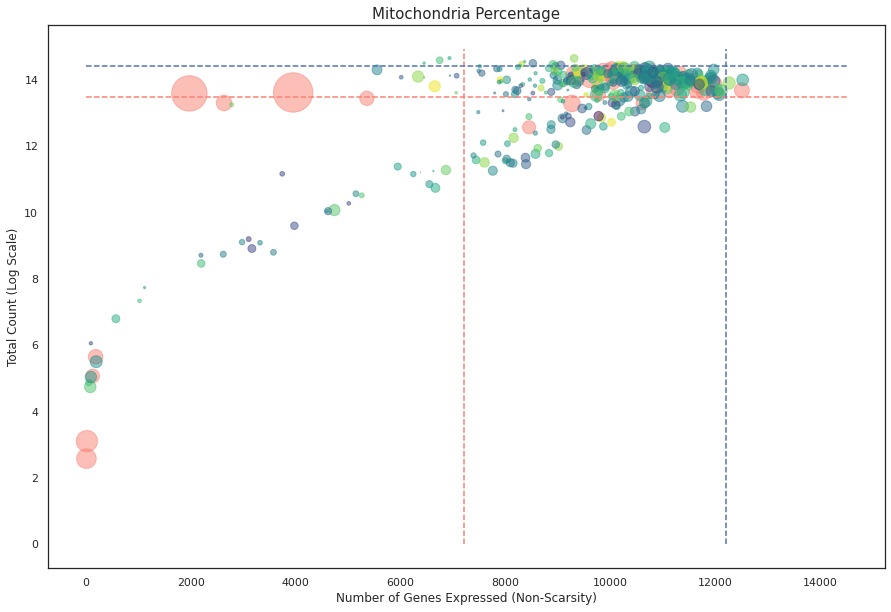

After identifying thresholds, we perform the usual filtering of cells. After this process, we remove 27 cells from the dataset and are left with 356 cells.

### Gene Selection

We perform the steps for gene selection as we did for HCC1806.

#### Duplicate genes

**In** MCF7, we find that 86 of the genes are not unique. Once again, we see that the duplicate genes are very close to 0 and are extremely sparse. Thus, we remove them without problems again.

#### Sparsity of genes

We compute the sparsity level: 0.5758323857108347

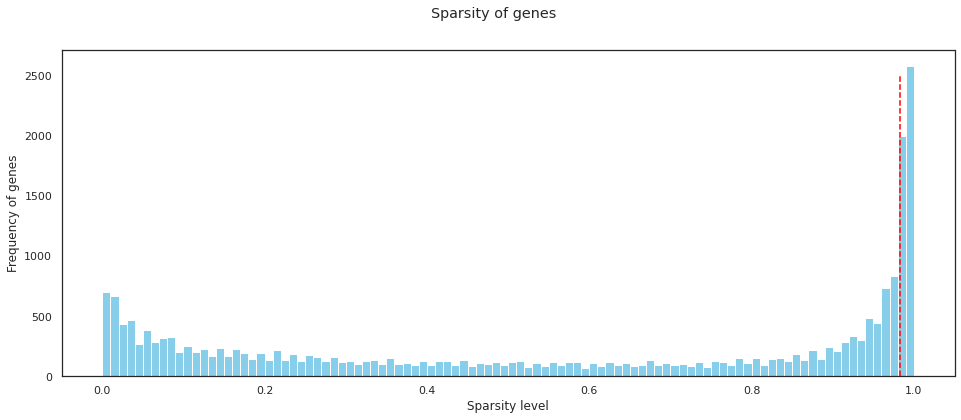

Filtering past the sparsity threshold, we're left with 18663 genes.

#### Variability

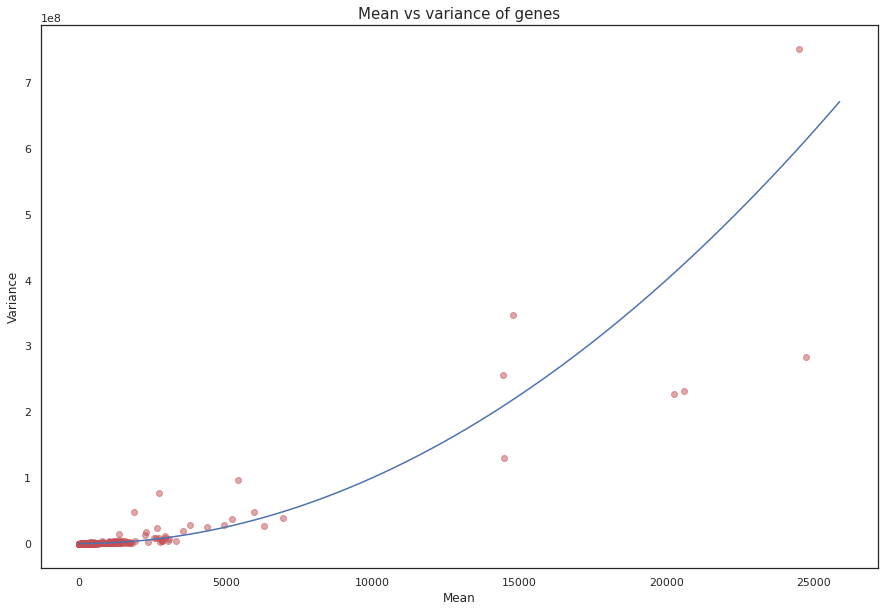

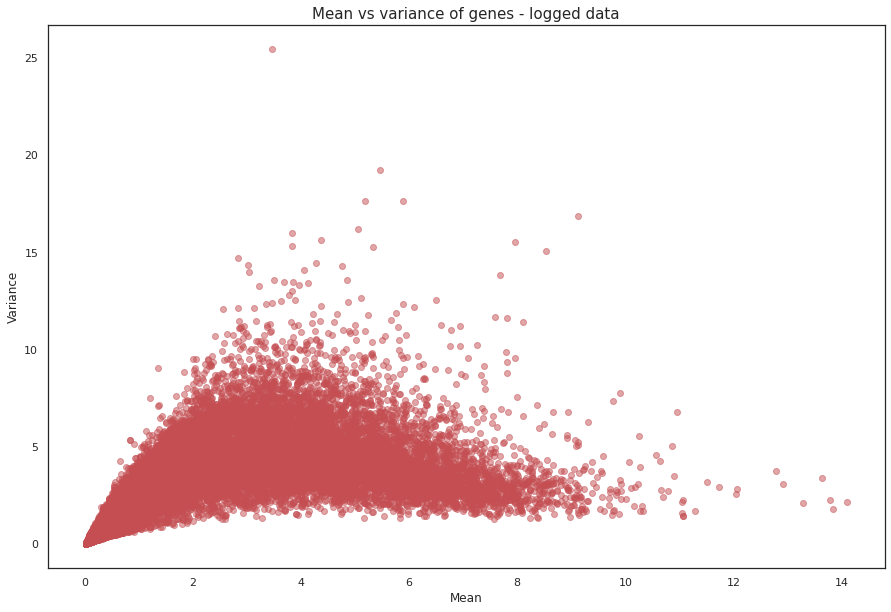

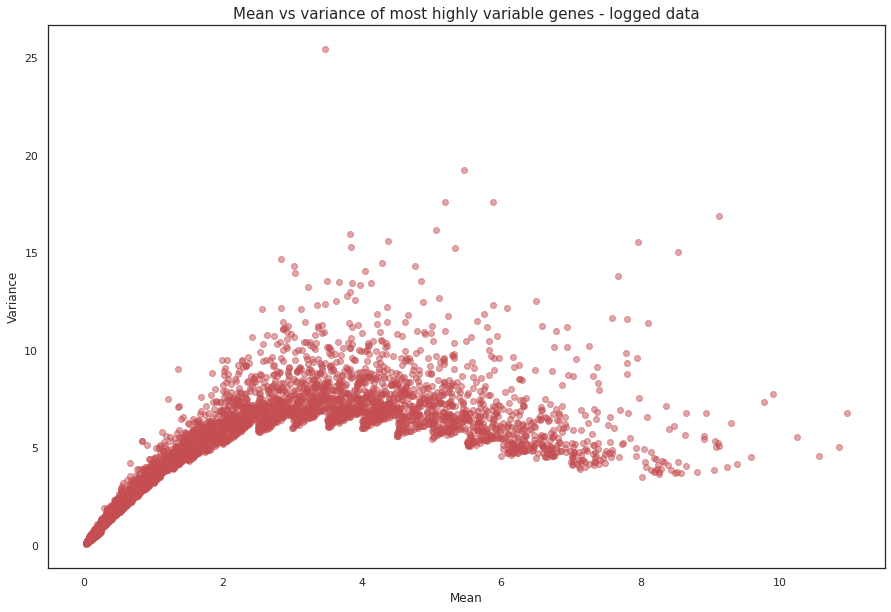

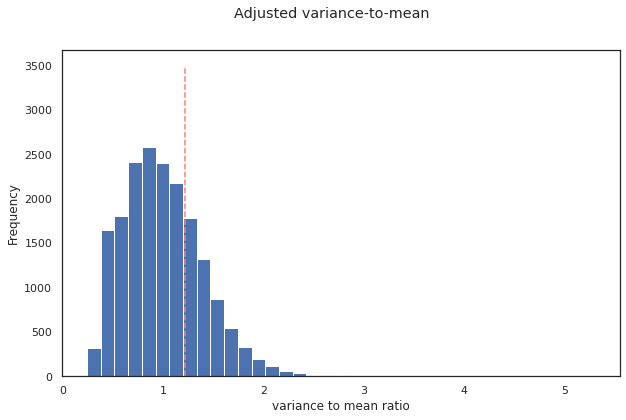

After performing the same steps as when analyzing HCC1806, we remain with the 5000 most highly variable genes after bin normalization. Comparing our selection with provided filtered dataset, we find out that 90% of the genes in the filtered dataset were kept by our filtering as well.

### Normalization

Regarding the batch effects, MCF7 was not process with different PCR plates but with Lanes. We again check for differences in the means of the batches and compute:
- Lane 1: 1.108639487623765
- Lane 2: 2.3976272563291854
- Lane 3: 2.173325836853408
- Lane 4: 1.8917076511896995

We do not normalize by leveraging batch effects but instead we use CPM normalization, like we did before.

### Log Transformation

We plot the skewness and kurtosis of the genes and the cell expression profiles before and after applying the log transformation. Once again, the logged data has a skewness and kurtosis which is much more similiar to those of a normal distribution than the non-logged data. 

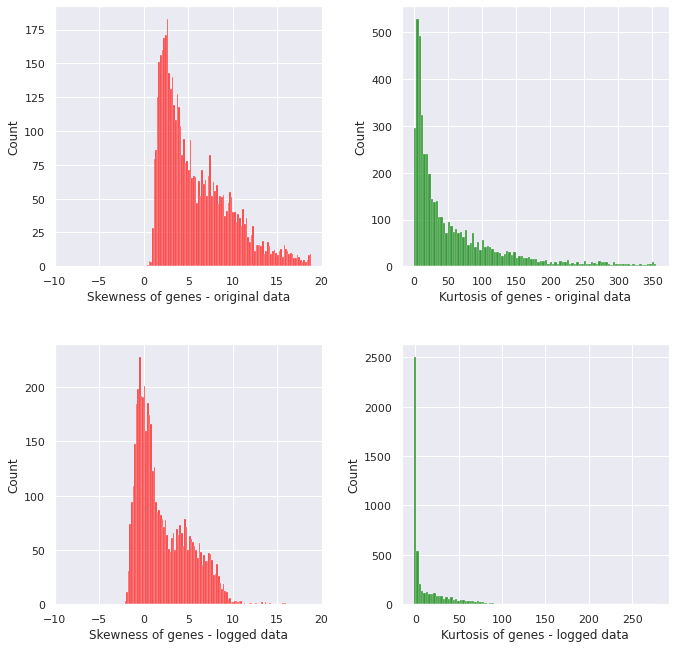

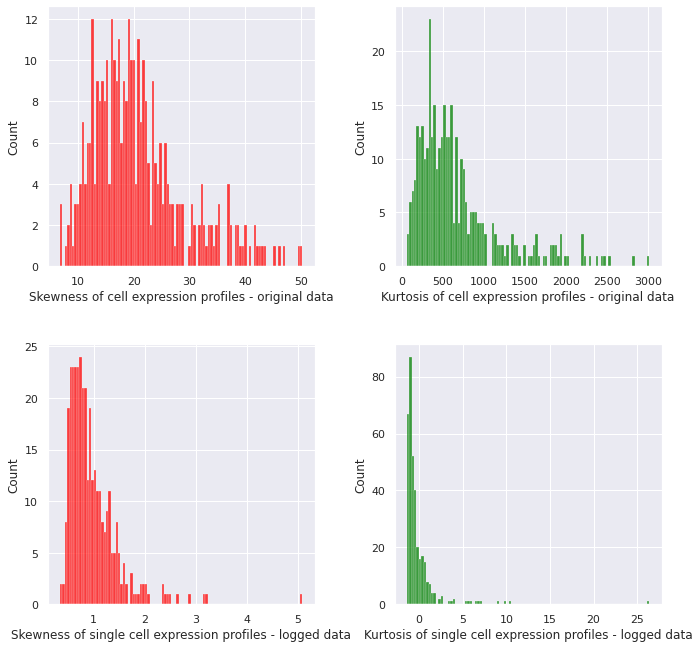

### Correlation

#### Correlation between cells

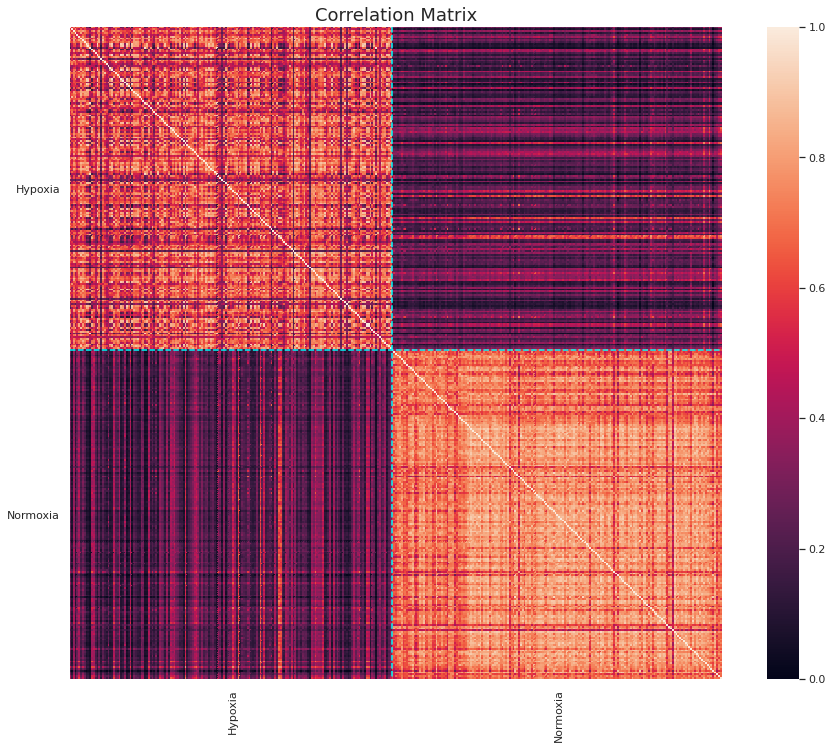

The trend identified in HCC1806 is much stronger here, as the correlations between cells of the same type are clearly higher than those between cells of opposite types.

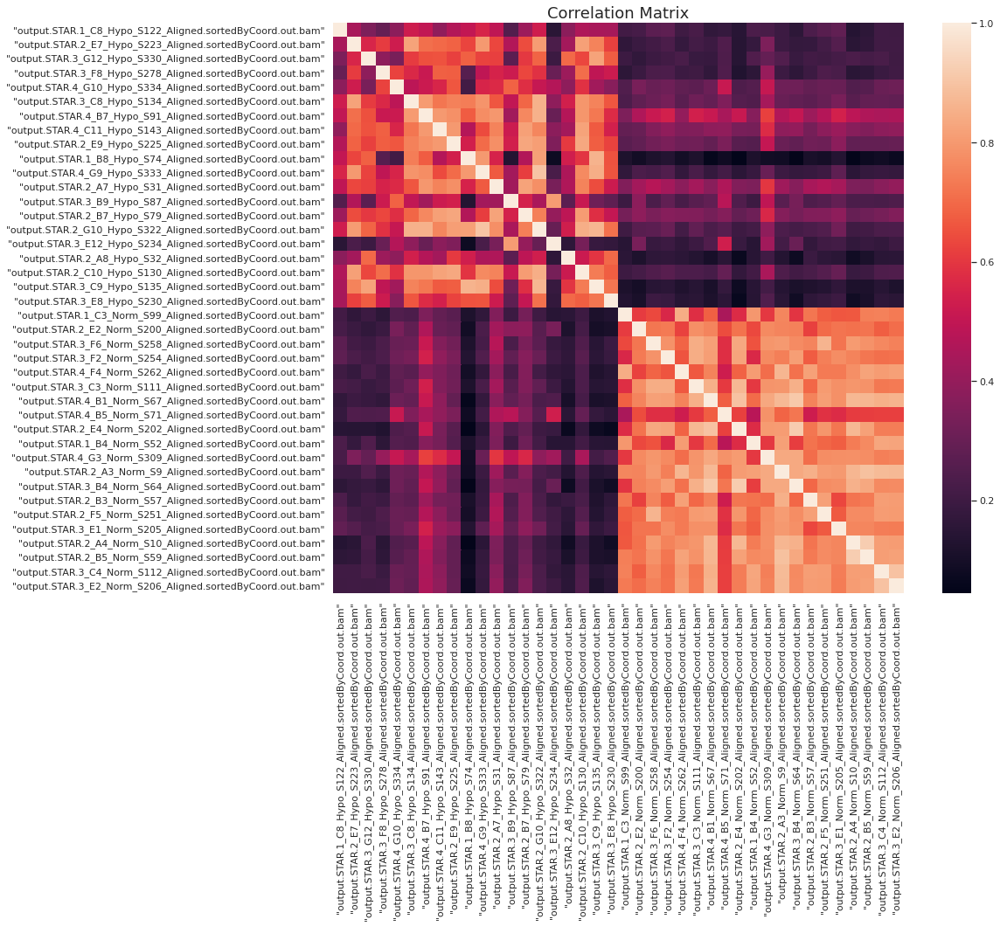

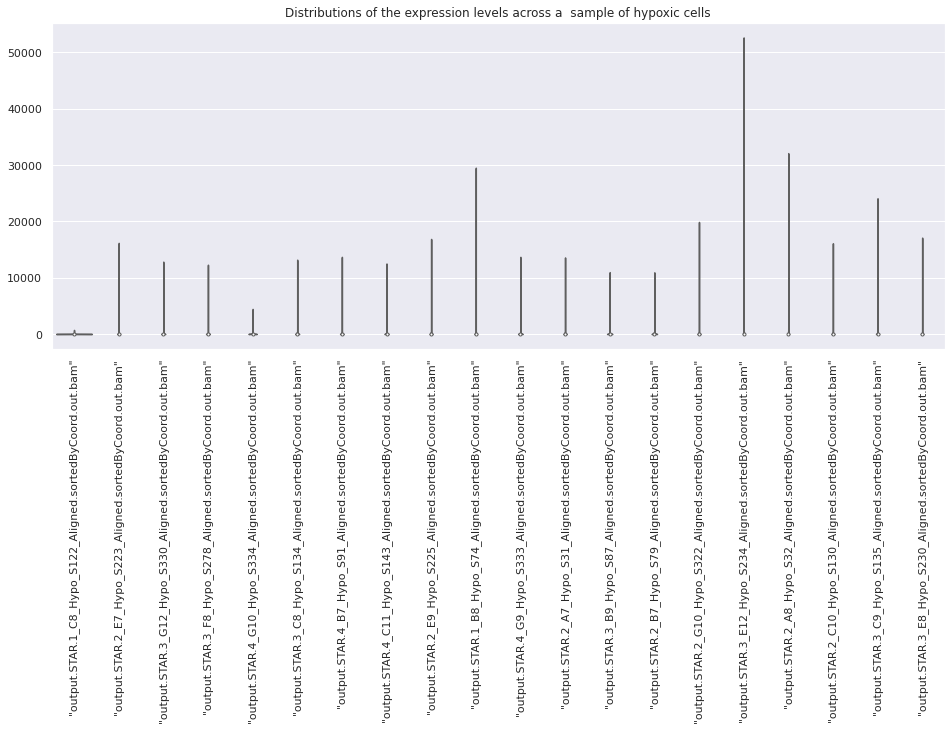

Looking at cell S234 which is very uncorrelated with other cells, our observation from HCC1806 holds: it has counts of higher value than those of other cells. 

#### Correlation between genes

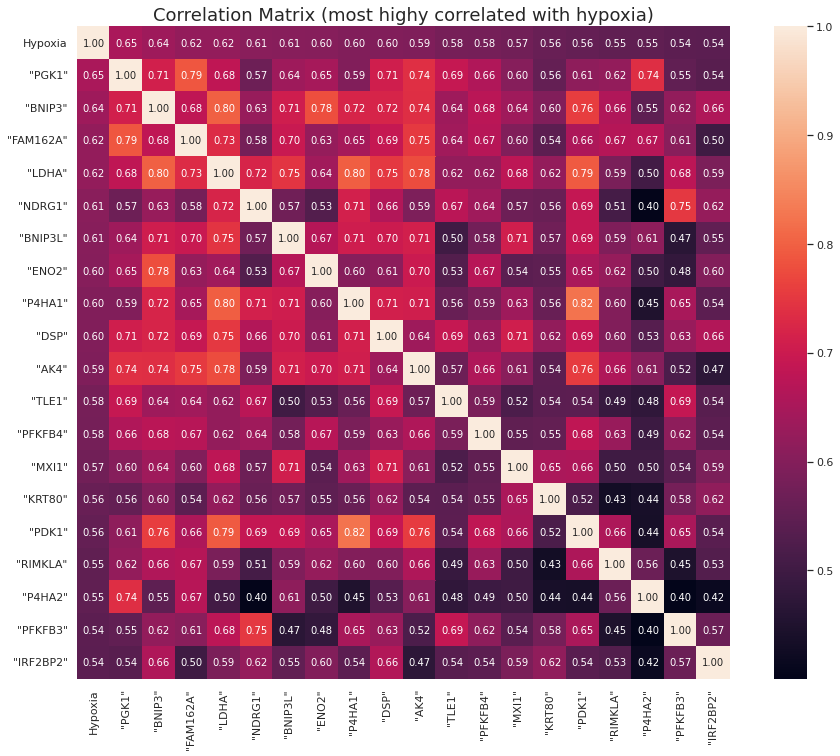

Again, we see from the correlation matrix that, as expected, genes which are highly correlated with hypoxia also tend to be correlated among each other. As the genes become less correlated with hypoxia, their correlations tend to decrease as wel

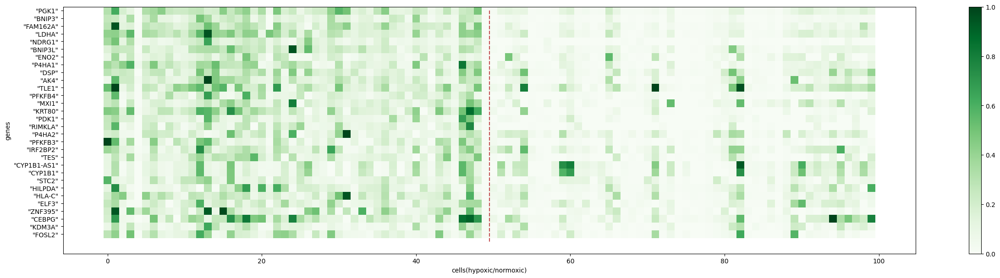

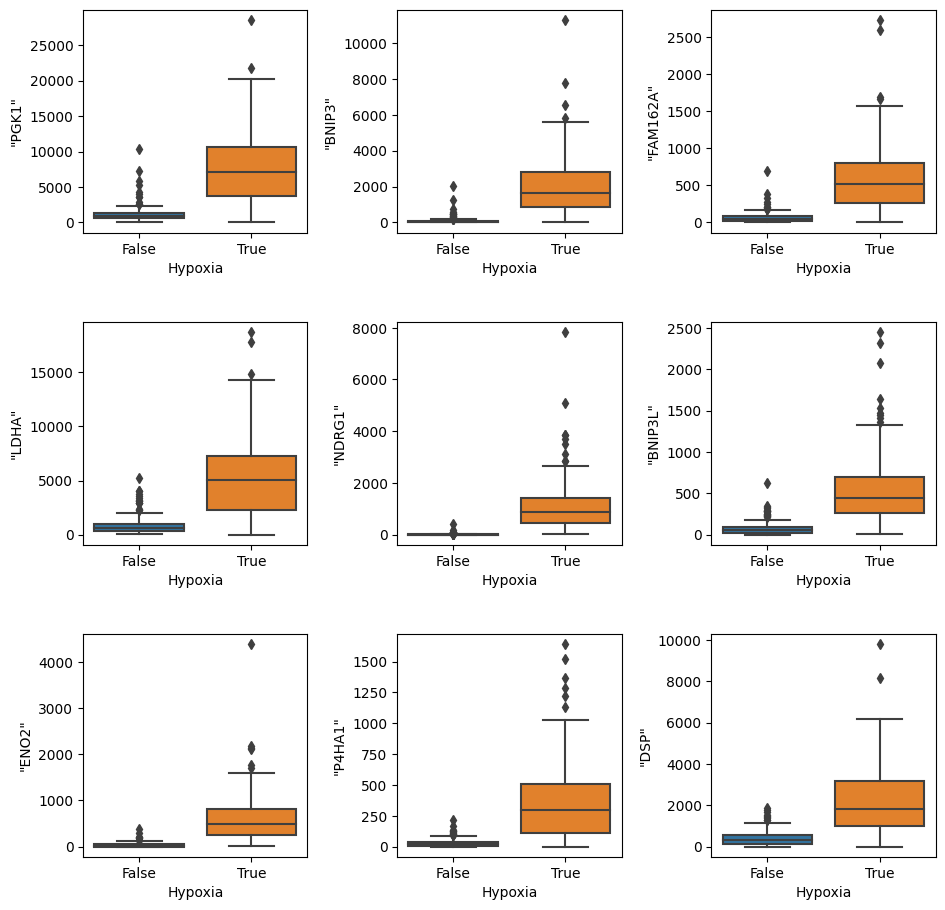

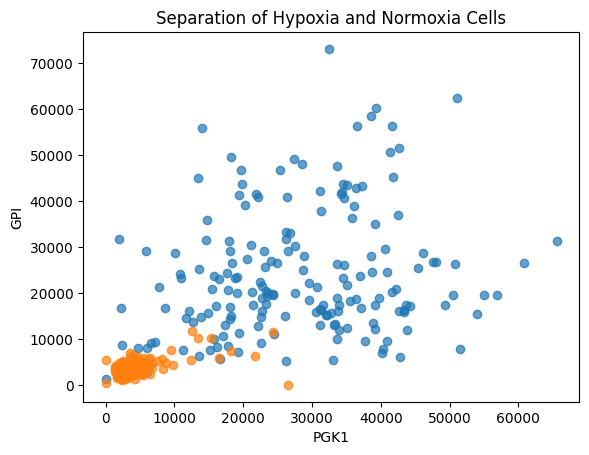

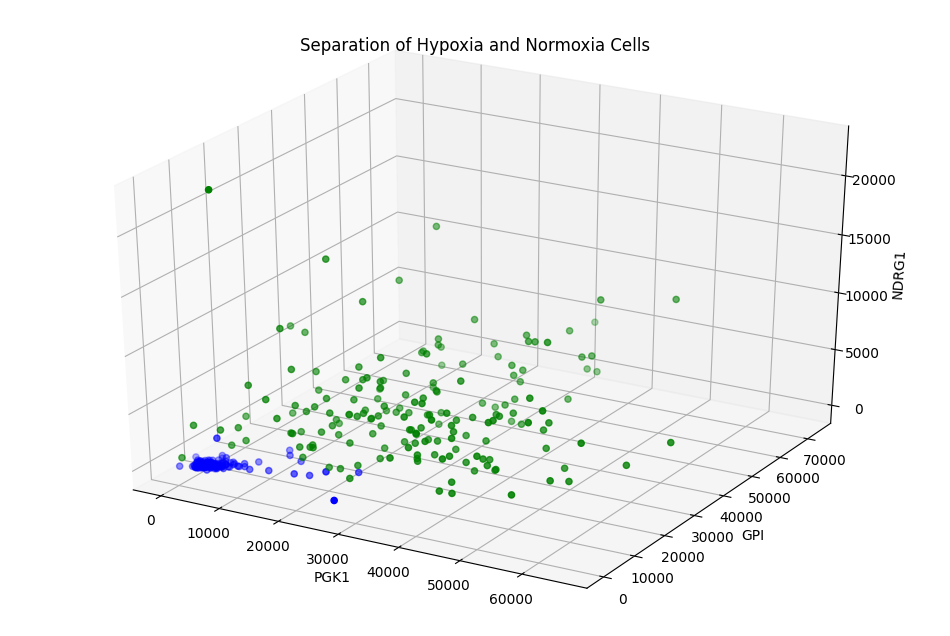

Once again, we see that we see that higher counts of these few genes efficitiently distinguish hypoxic cells.

## Bibliography

Current best practices in single‐cell RNA‐seq analysis: a tutorial | Molecular Systems Biology
https://www.embopress.org/doi/full/10.15252/msb.20188746

Hands-On Machine Learning with Scikit-Learn, Keras, and Tensorflow Concepts, Tools, and Techniques to Build Intelligent Systems by Aurélien Géron

Sklearn official documentation

Professor Francesca Buffa's lecture notes